In [91]:
from common_code.common import *
from common_code.plotting import *

from Trainers.DatasetQA import *
import numpy as np
import os
import sys
import matplotlib.pyplot as plt
from random import shuffle

In [92]:
dataset = 'snli'
if dataset not in os.listdir(base):
    os.mkdir(base+dataset)

base = './experiments/GLUE/'

base_dir1 = base+dataset+'_diversity_lstm_tanh/'+dataset.upper()+'/diversity_lstm+tanh__diversity_weight_0'
base_dir2 = base+dataset+'_ortho_lstm_tanh/'+dataset.upper()+'/ortho_lstm+tanh'
base_dir3 = base+dataset+'_diversity_lstm_tanh/'+dataset.upper()+'/diversity_lstm+tanh__diversity_weight_0.5'

# 2 => Neutral(1992), # 1 => entailment(2481), #0 => contradiction(2172)
       
path_to_png_1 = base + dataset +'/attn_pngs_1_{}/'.format(dataset)
path_to_png_2 = base + dataset +'/attn_pngs_2_{}/'.format(dataset)
path_to_png_0 = base + dataset +'/attn_pngs_0_{}/'.format(dataset)
path_to_csv_1 = base + dataset +'/form_data_1_{}.tsv'.format(dataset)
path_to_csv_0 = base + dataset +'/form_data_0_{}.tsv'.format(dataset)
path_to_csv_2 = base + dataset +'/form_data_2_{}.tsv'.format(dataset)


if 'attn_pngs_0_{}'.format(dataset) not in os.listdir(base+dataset):
    os.mkdir(path_to_png_0)
if 'attn_pngs_1_{}'.format(dataset) not in os.listdir(base+dataset):
    os.mkdir(path_to_png_1)
if 'attn_pngs_2_{}'.format(dataset) not in os.listdir(base+dataset):
    os.mkdir(path_to_png_2)    



In [93]:
dataset = datasets[dataset]()

def process_grads(grads, X) :
    for k in grads :
        if (k != "conicity") and (k != "X"):
            xxe = grads[k]
            for i in range(len(xxe)) :
                L = len(X[i])
                xxe[i] = np.abs(xxe[i])
                xxe[i] = xxe[i] / np.sum(xxe[i][1:L-1])

def get_outputs(base_dir):    
    dirname = get_latest_model(base_dir)
    outputs = pload1(dirname,'test_output')
    grads = pload1(dirname,'gradients')
    process_grads(grads,outputs['P'])
    ydiff = pload1(dirname, 'remove_and_run')
    
    for i in range(len(ydiff)):
        L = len(outputs['P'][i])
        ydiff[i] = ydiff[i]/ np.sum(ydiff[i][1:L-1])
    
    outputs['grads'] = grads['XxE[X]']
    outputs['loo'] = ydiff
    return outputs

In [94]:
def print_attention_old(output1, output2, output3):
    
    indices = []
    threshold = 0.21
    for idx in range(len(output1['attn_hat'])):
        
        attn1 = output1['attn_hat'][idx]        
        attn2 = output2['attn_hat'][idx]
        attn3 = output3['attn_hat'][idx]
        
        L = len(output1['P'][idx])
        js_divergence = jsd(attn1[1:L-1],attn3[1:L-1])
        y = output1['y'][idx]
        y_pred1 = output1['yt_hat'][idx]
        y_pred2 = output2['yt_hat'][idx]
        y_pred3 = output3['yt_hat'][idx]

        if (js_divergence >= threshold and ( y == y_pred1 and y== y_pred3 and y==2)):
            indices.append(idx)
            
    shuffle(indices)
    print("no of instances : {}".format(len(indices)))
    # indices = indices[:300]
    
    for idx in indices:
    
        attn1 = output1['attn_hat'][idx]        
        attn2 = output2['attn_hat'][idx]
        attn3 = output3['attn_hat'][idx]

        # grad1 = output1['grads'][idx]

        # grad3 = output3['grads'][idx]
        # loo3 = output3['loo'][idx]

        L = len(output1['P'][idx])
        sentence = dataset.vec.map2words(output1['P'][idx])  
        question = dataset.vec.map2words(output1['Q'][idx])  
        l_q = len(question)
        question = " ".join(question[1:l_q-1])
        y = output1['y'][idx]
        L = len(sentence)
        y_pred1 = output1['yt_hat'][idx]
        y_pred2 = output2['yt_hat'][idx]

        print(question)
        print('prediction: {}'.format(y))
        print_attn(sentence[1:L-1], attn1[1:L-1])
#         print_attn(sentence[1:L-1], attn2[1:L-1])
        print_attn(sentence[1:L-1], attn3[1:L-1])
        print ("="*30)
        # print_attn(sentence[1:L-1], grad1[1:L-1])
        # print_attn(sentence[1:L-1], grad3[1:L-1])
        # print ('sum',grad3[1:L-1].sum(),attn3[1:L-1].sum())
        # print_attn(sentence[1:L-1], loo3[1:L-1])

        print ("-"*30)
        sys.stdout.flush()

In [95]:
def print_attention(output1, output2, output3, output_filter=0, plot=True, jsd_thresh=0.3, max=10, crop=True):
    #not shuffling over here because Forms api is already shuffling for us in each form
    #use max=-1 to use whole output
    
    op = output_filter
    
    if(output_filter == 1):
        path_to_png = path_to_png_1
        path_to_csv = path_to_csv_1
    elif(output_filter == 2):
        path_to_png = path_to_png_2
        path_to_csv = path_to_csv_2
    else:
        path_to_png = path_to_png_0
        path_to_csv = path_to_csv_0


    fi = open(path_to_csv, 'w')
    count = 0
    
    for idx in range(len(output1['attn_hat'])):
        
        attn1 = output1['attn_hat'][idx]
        # attn2 = output2['attn_hat'][idx]
        attn3 = output3['attn_hat'][idx]
        
        L = len(output1['P'][idx])
        js_divergence = jsd(attn1[1:L-1],attn3[1:L-1])

        if (js_divergence >= jsd_thresh):
            
            y_pred1 = output1['yt_hat'][idx]
            # y_pred2 = output2['yt_hat'][idx]
            y_pred3 = output3['yt_hat'][idx]
            
            y = output1['y'][idx]

            sentence = dataset.vec.map2words(output1['P'][idx])  
            question = dataset.vec.map2words(output1['Q'][idx])  
            
            l_q = len(question)
            question = " ".join(question[1:l_q-1])

            L = len(sentence)
            
            if ( y == op and y == y_pred1 and y== y_pred3):
            
                if( max != -1 and count == max):
                    break
                    
                count += 1
            
                if(plot):
                    # write to file

                    fi.write(str(y)+'\t')
                    fi.write(question+'\n')

                    #plot figures
                    png_path = path_to_png + "example{}.png".format(count)
                    
                    print(question)
                    print(L)

                    print_attn(sentence[1:L-1], attn1[1:L-1])
                    print_attn(sentence[1:L-1], attn3[1:L-1])

                    if(len(sentence[1:L-1]) <= 12):
                        kws = {"rotation": 0, "size": 10}
                    else:
                        kws = {"rotation": 45, "size": 15}

                    fig, ax = init_gridspec(10, 1, 2)
                    attn_matirx = np.array(attn1[1:L-1]).reshape(1,-1)
                    annotate = np.array(sentence[1:L-1]).reshape(1,-1)
                    ax[0].set_ylabel('')    
                    ax[0].set_xlabel('')

                    ax[0] = plot_attention(ax[0], attn_matirx, annotate, kws)

                    attn_matirx = np.array(attn3[1:L-1]).reshape(1,-1)
                    annotate = np.array(sentence[1:L-1]).reshape(1,-1)
                    ax[1] = plot_attention(ax[1], attn_matirx, annotate, kws)

                    show_gridspec()
                    fig.savefig(png_path)
                    
                    print ("-"*30)
                    sys.stdout.flush()
                    
                    
    if(plot and crop):
        #crop pngs to remove whitespace
        print("Cropping saved pngs")

        for l in os.listdir(path_to_png):
            if(l == '.DS_Store'):
                continue
            crop_img(path_to_png+l)

        print("Done cropping")
            
    return count

In [96]:
output1 = get_outputs(base_dir1)
output2 = get_outputs(base_dir1)
output3 = get_outputs(base_dir3)

a woman plays polo
6


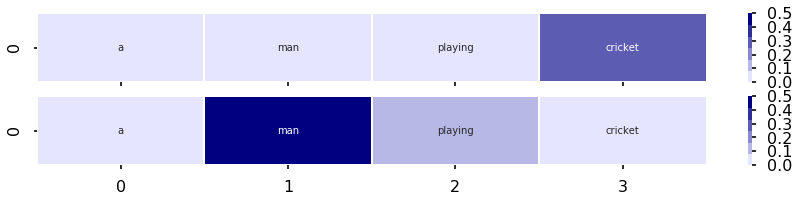

------------------------------
a girl is strolling down the park .
7


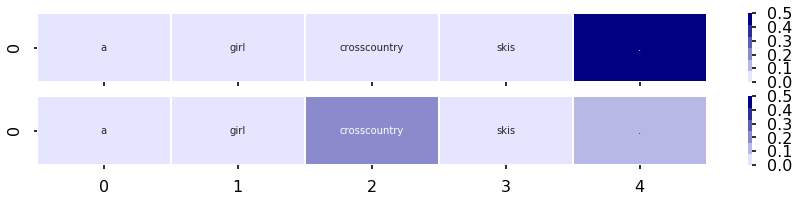

------------------------------
a basket weaver sitting at home .
8


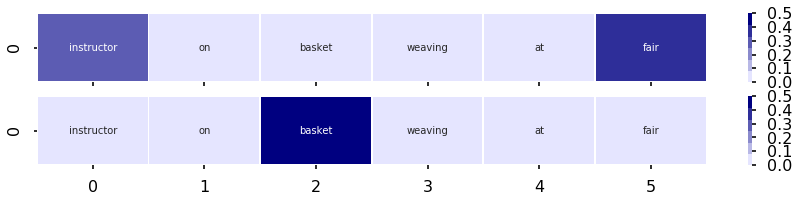

------------------------------
a woman is climbing stairs
8


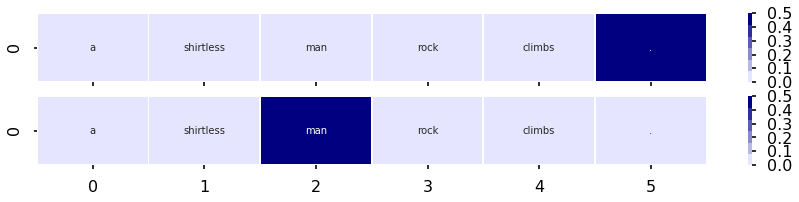

------------------------------
a swimmer at a pool .
8


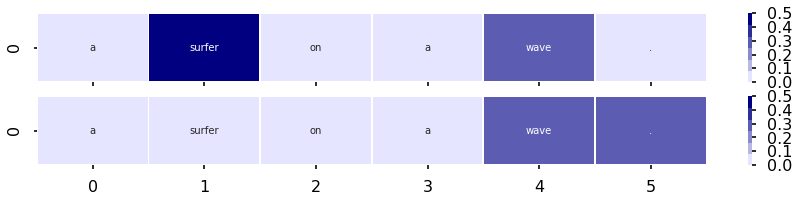

------------------------------
a dog is sitting in a car .
8


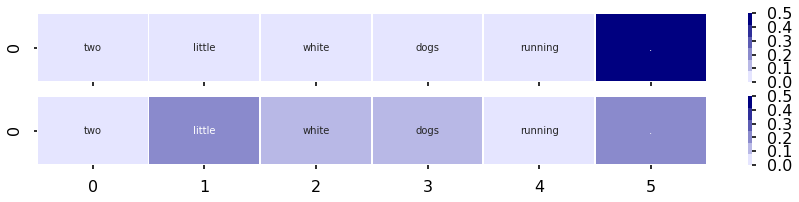

------------------------------
a father holding a ball .
9


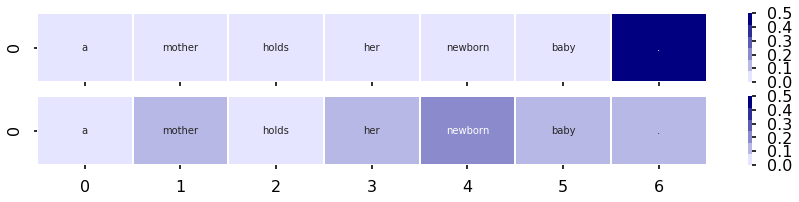

------------------------------
the ocean swims in the blue <UNK> .
9


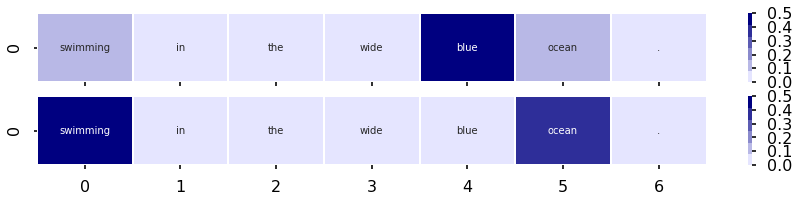

------------------------------
a man and two women are bungee jumping .
9


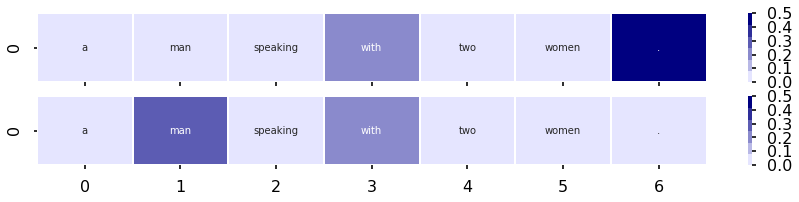

------------------------------
a family is playing out in their backyard .
9


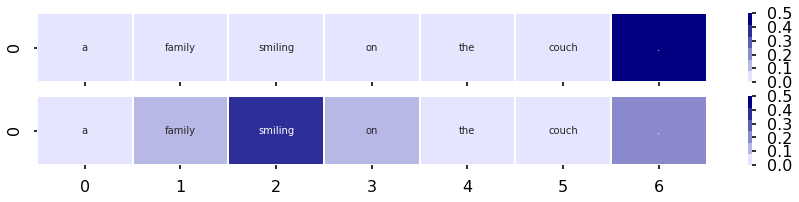

------------------------------
the boy is posing for a picture .
9


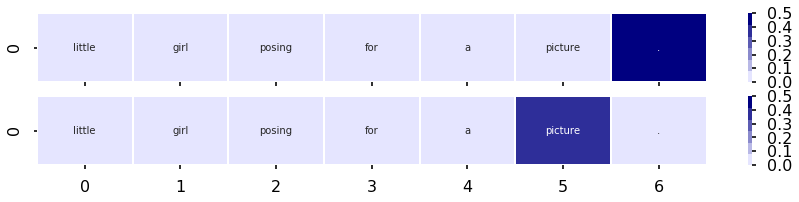

------------------------------
the kids are at the table eating dinner .
9


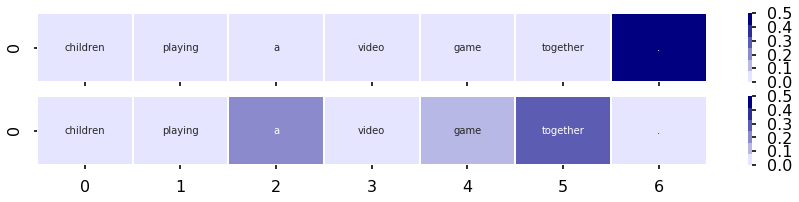

------------------------------
a woman is sitting at her desk .
9


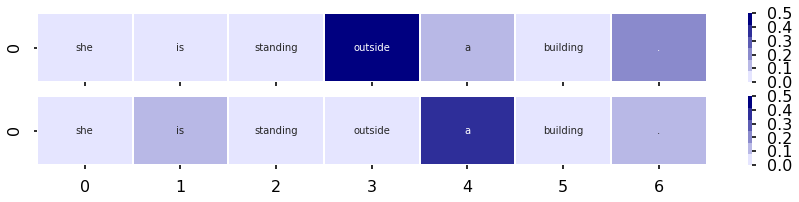

------------------------------
the <UNK> are eating their dinner .
9


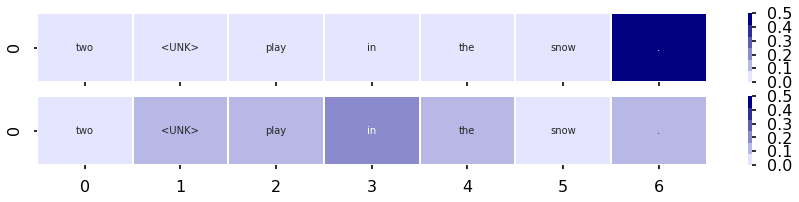

------------------------------
people are swimming in the ocean .
10


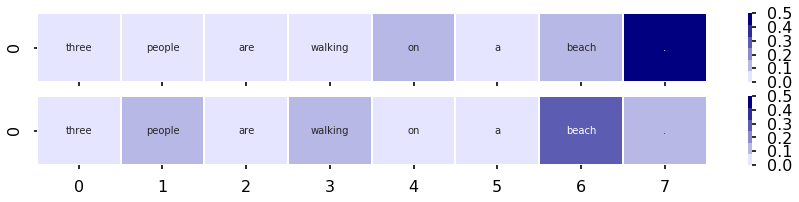

------------------------------
people are running a marathon
10


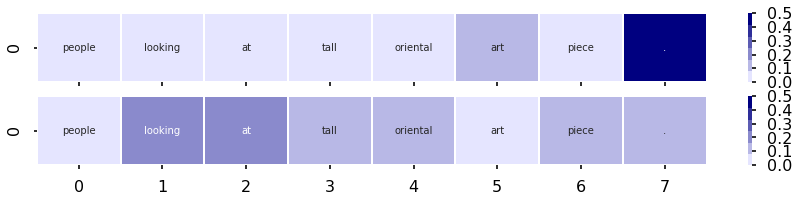

------------------------------
a man is singing on stage .
10


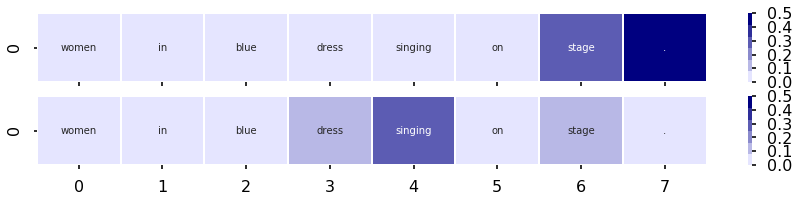

------------------------------
some children sit and read in a library .
10


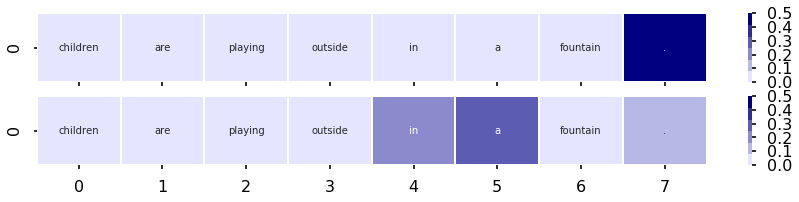

------------------------------
the woman is reading a book .
10


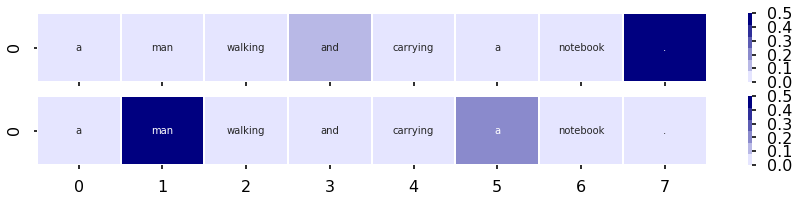

------------------------------
two women are dressed up
10


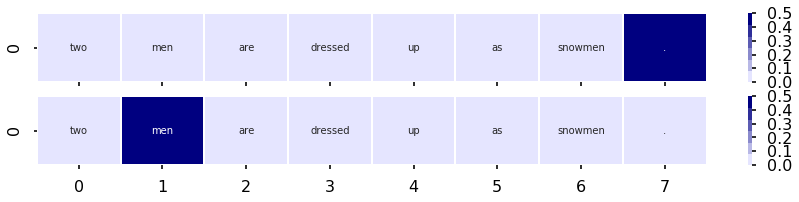

------------------------------
a woman is at the laundromat .
10


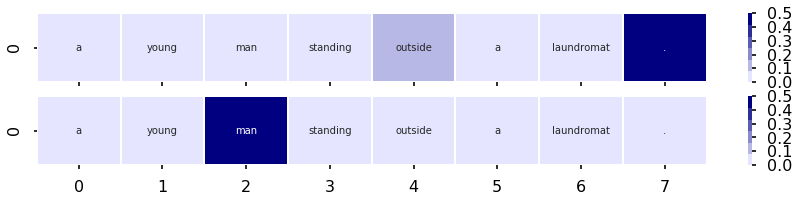

------------------------------
three women are sitting on a blanket .
10


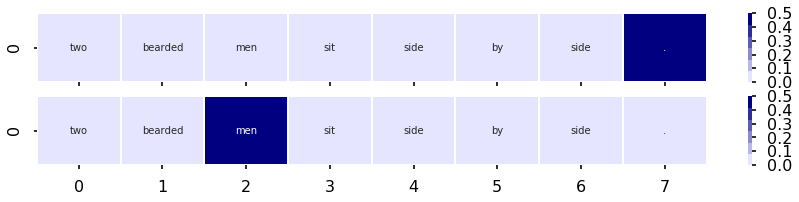

------------------------------
two women are talking .
10


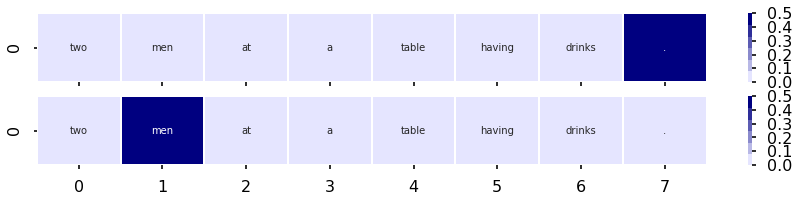

------------------------------
the men are eating lunch
10


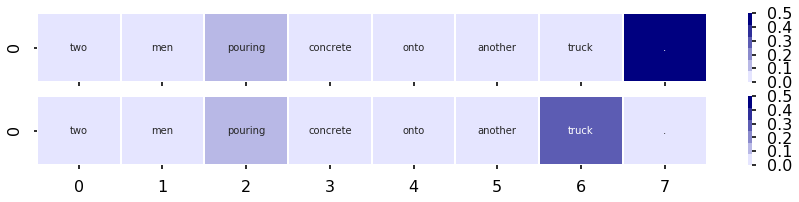

------------------------------
two guys lifting oranges to build up muscles .
10


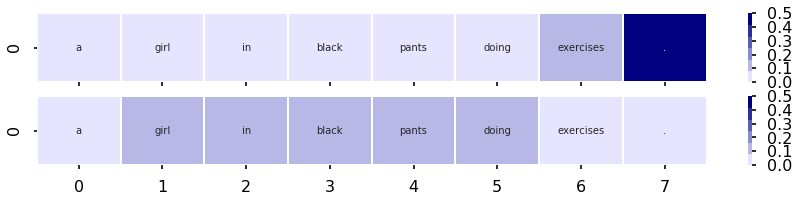

------------------------------
two women are under a waterfall .
10


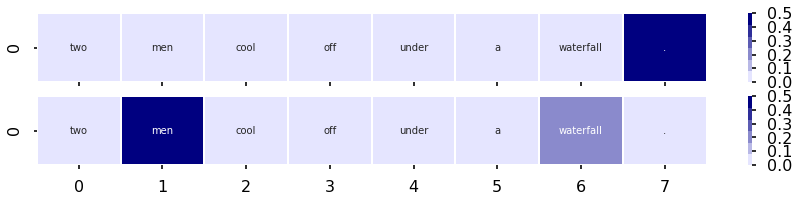

------------------------------
women are playing trumpets on the street .
10


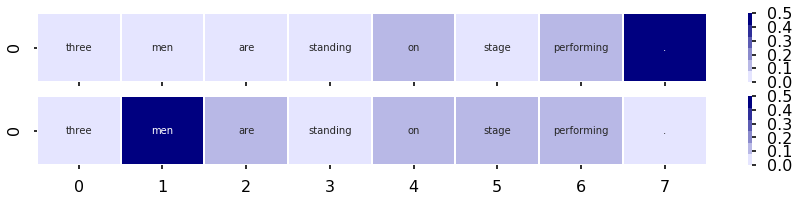

------------------------------
bowlers are eating sandwiches .
10


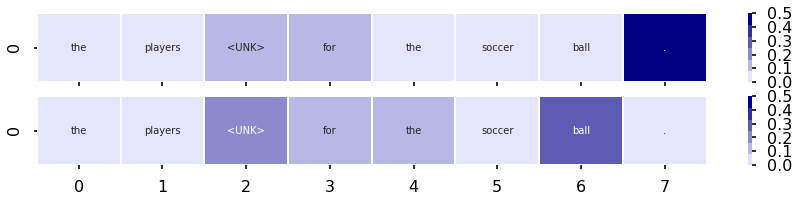

------------------------------
football players practice .
10


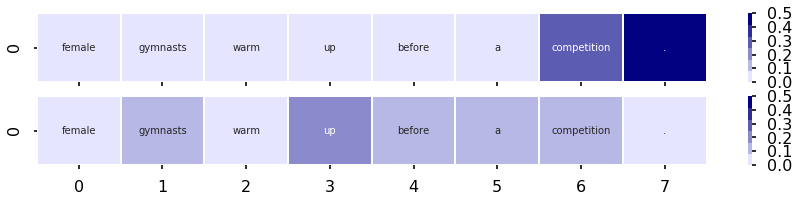

------------------------------
a dog singing karaoke .
10


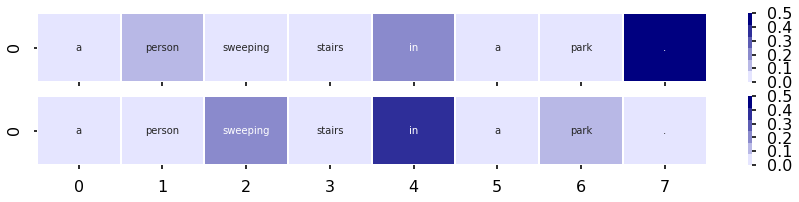

------------------------------
qqq women are dancing
10


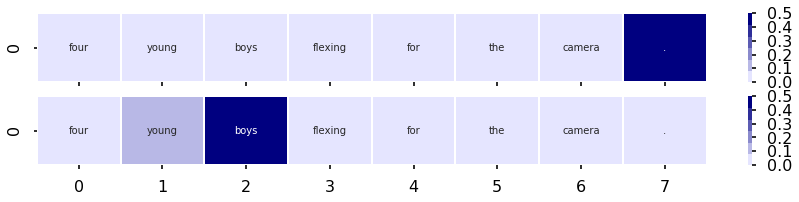

------------------------------
the buss is in a pool
10


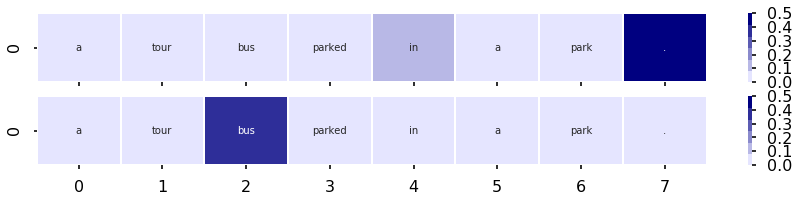

------------------------------
a man enjoying the view of the golden gate bridge .
10


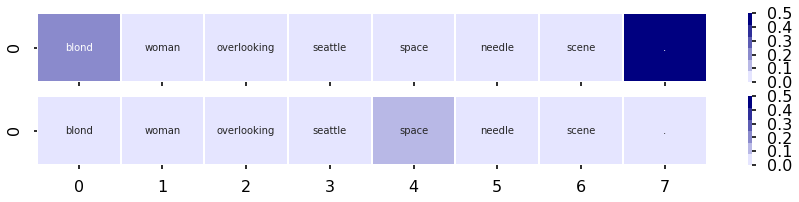

------------------------------
the dog is in a pool .
10


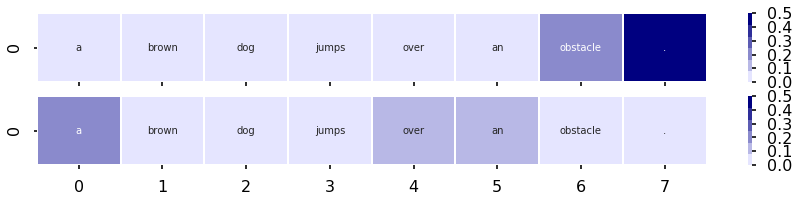

------------------------------
a man is sawing down a telephone pole .
10


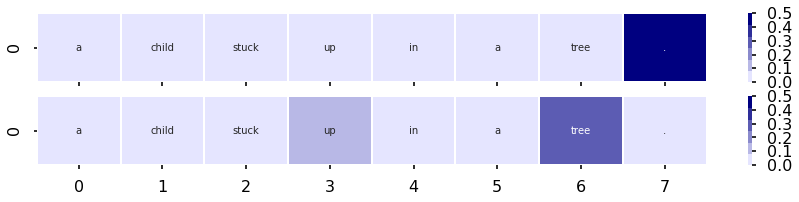

------------------------------
a group of men are fencing .
10


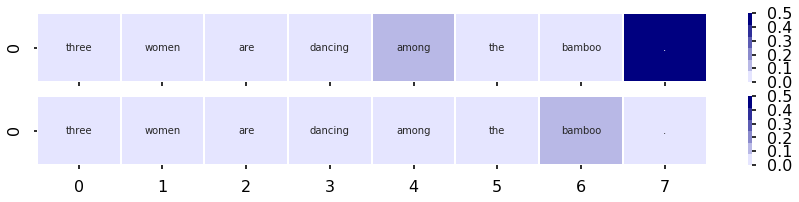

------------------------------
two women having lunch .
10


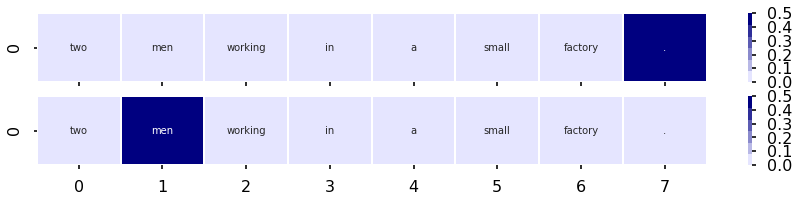

------------------------------
two women climbing on a wooden scaffold .
10


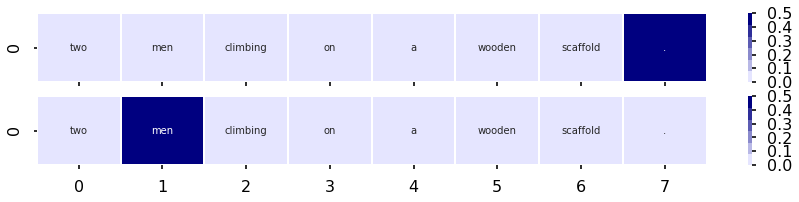

------------------------------
the woman drew on canvas .
10


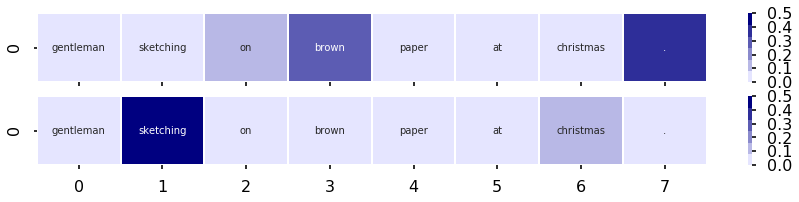

------------------------------
a girl is walking
11


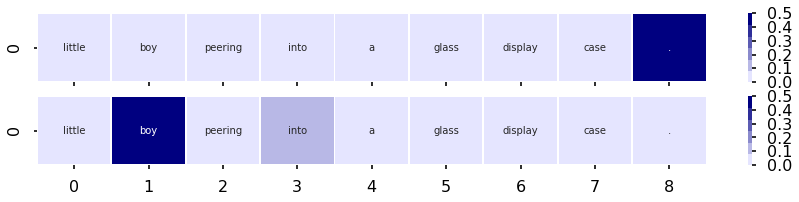

------------------------------
the man is walking his dog .
11


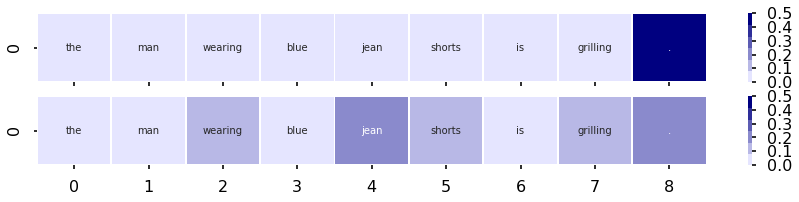

------------------------------
a boy swimming in the ocean
11


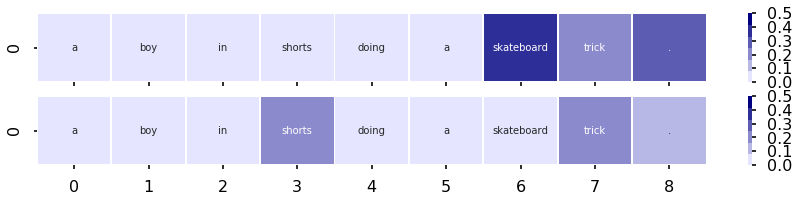

------------------------------
a girl rides his skateboard at the park .
11


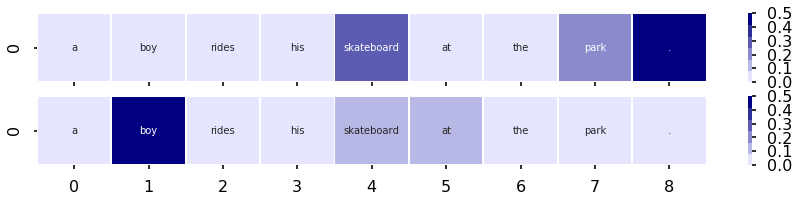

------------------------------
a woman in a dress dances in the club .
11


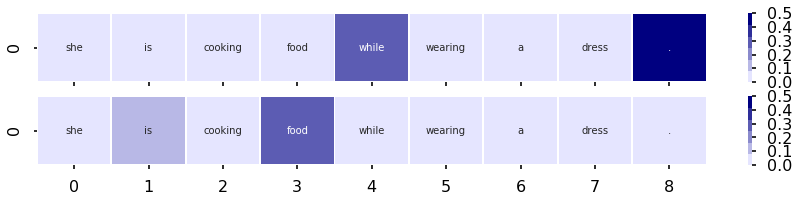

------------------------------
the ladies are riding bikes .
11


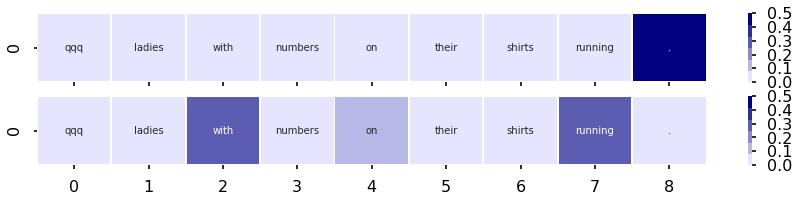

------------------------------
a woman is hanging sausages in a market .
11


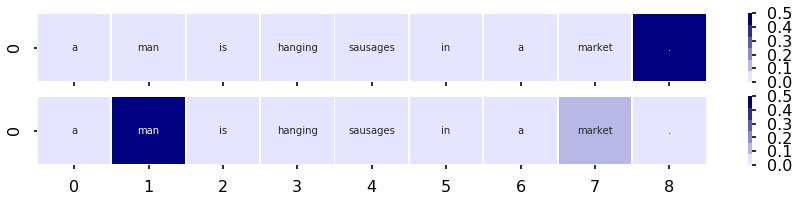

------------------------------
two girls sit quietly and sharpen knives for the sad work ahead .
11


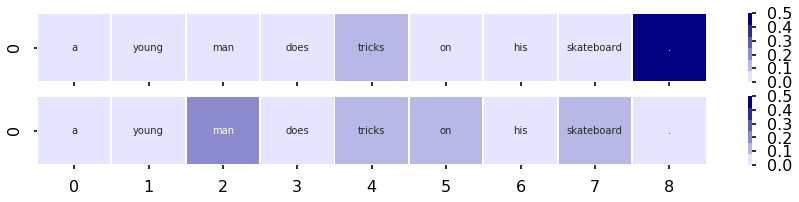

------------------------------
the person is swimming .
11


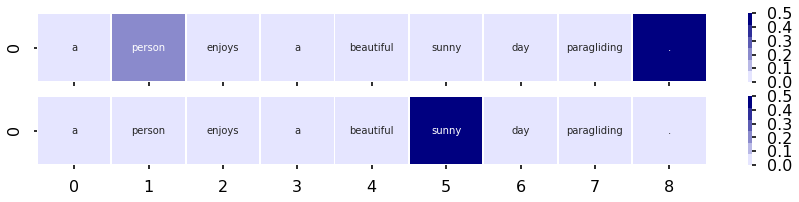

------------------------------
the people are outside in the snow .
11


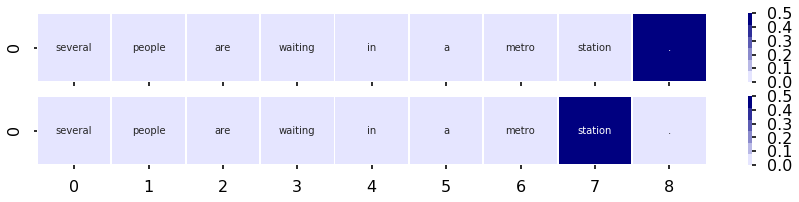

------------------------------
the women are playing soccer on mars .
11


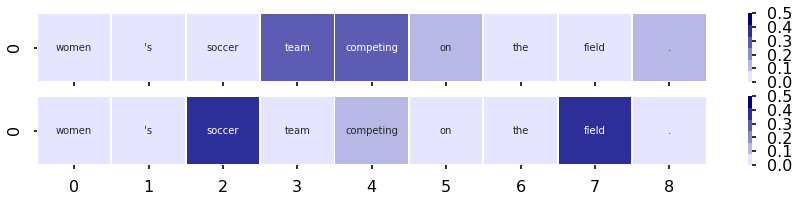

------------------------------
a person is ice skating .
11


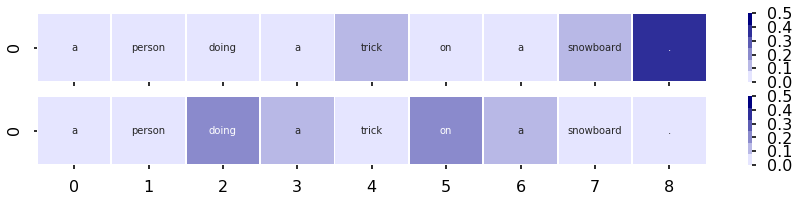

------------------------------
the child is sitting on a bed .
11


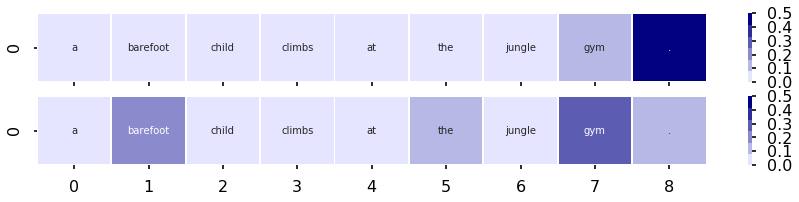

------------------------------
people are showering .
11


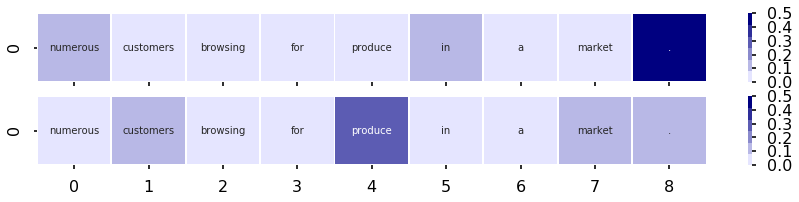

------------------------------
the man and woman are mad at each other .
11


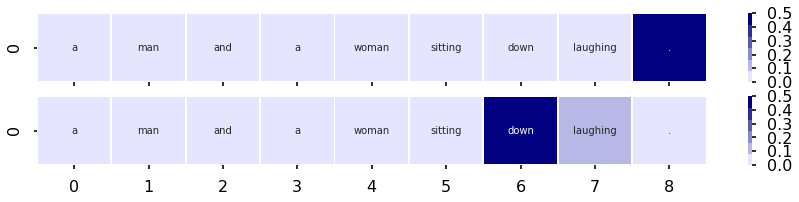

------------------------------
a woman in neon green hails a cab alone .
11


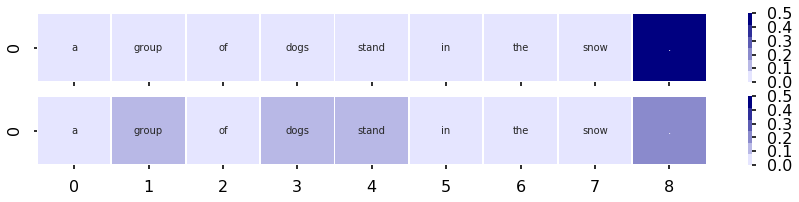

------------------------------
the child is on a swing .
11


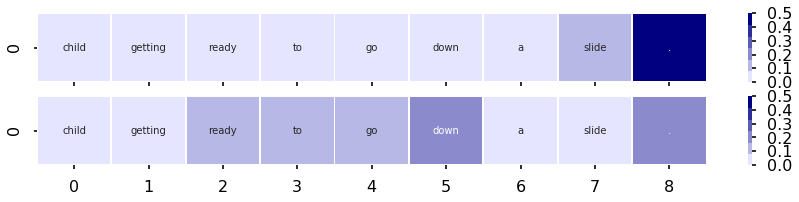

------------------------------
two girls are in front of the snack machine .
11


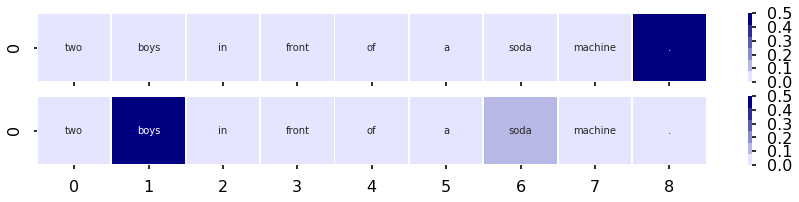

------------------------------
a woman is riding a bike outside .
11


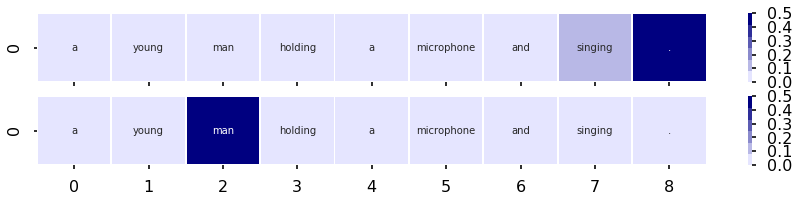

------------------------------
a cat running down a beach
11


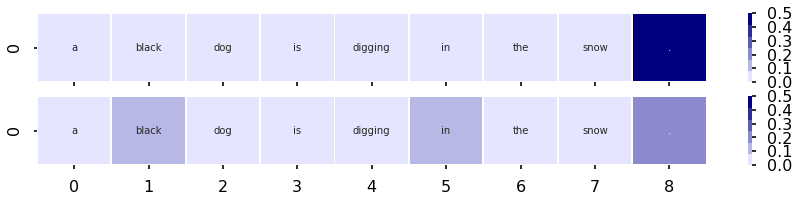

------------------------------
a black couple are eating lunch .
11


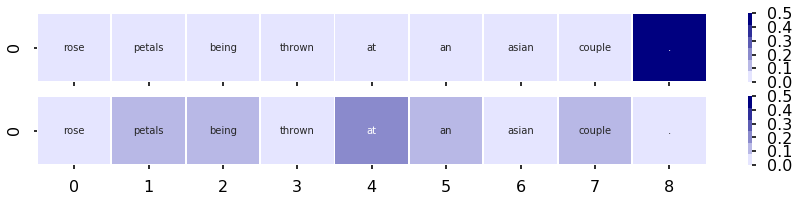

------------------------------
workers are sitting and riding a train .
11


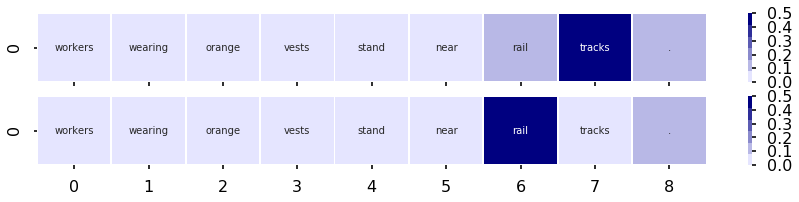

------------------------------
a woman is dancing .
11


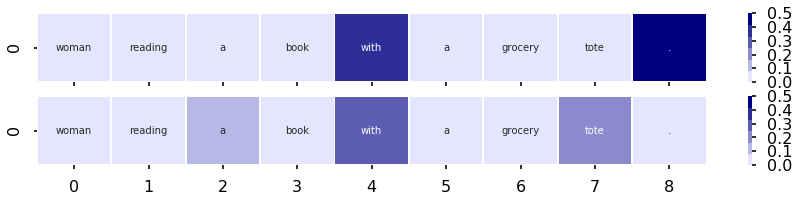

------------------------------
the boy is eating a sandwich on the moon .
11


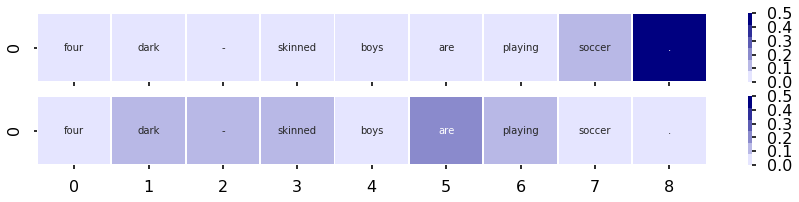

------------------------------
a young woman appears bored in a restaurant .
11


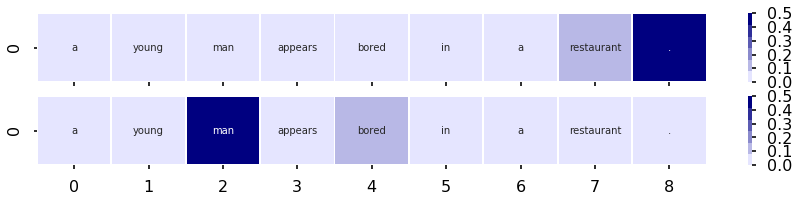

------------------------------
a cyclist dressed in black and white eats cheese .
12


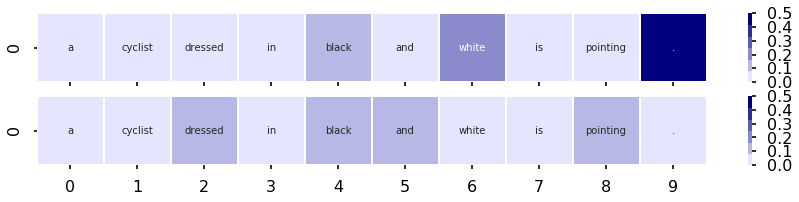

------------------------------
the girls are at the swimming pool .
12


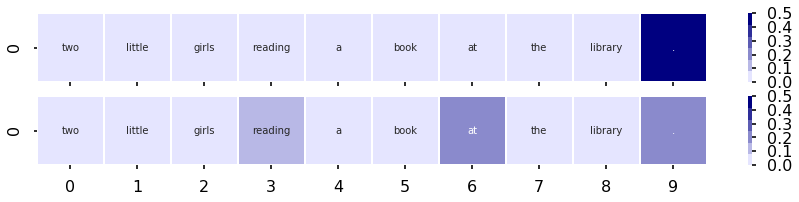

------------------------------
a girl is playing the piano in her living room .
12


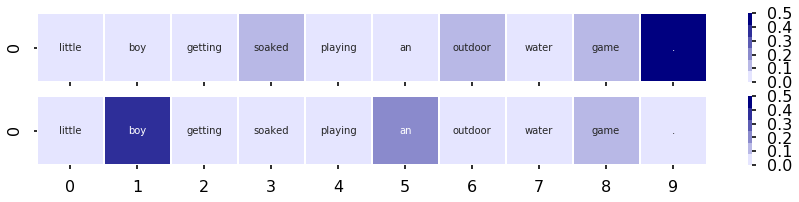

------------------------------
two young people are angry .
12


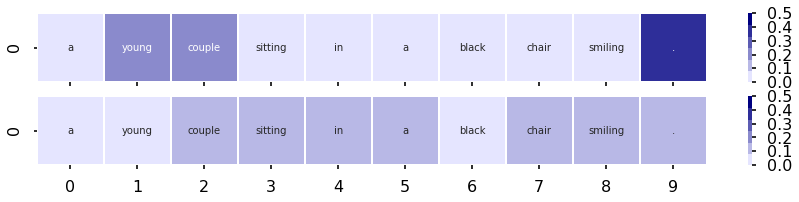

------------------------------
a woman has a helmet on a motorcycle .
12


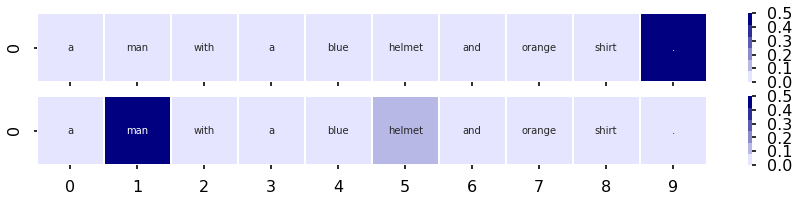

------------------------------
a woman sits .
12


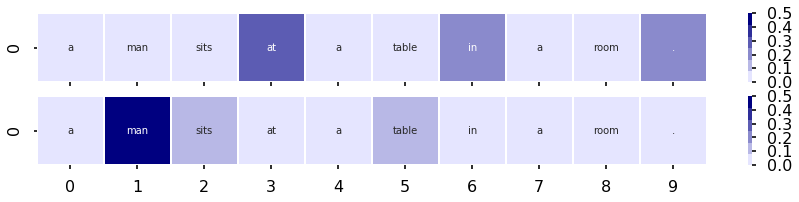

------------------------------
two women embrace on the sidewalk .
12


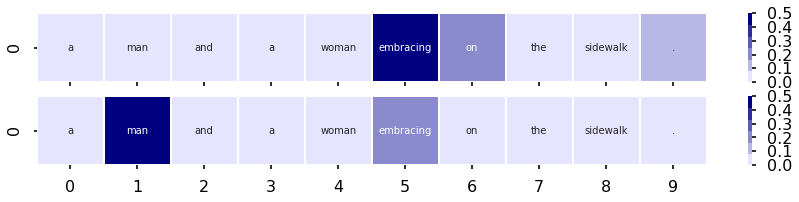

------------------------------
a large crowd of dogs are at the park .
12


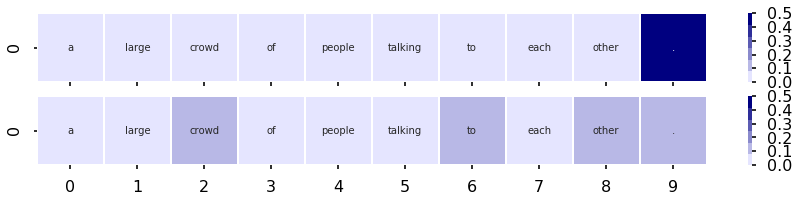

------------------------------
a woman is sitting outside in the rain .
12


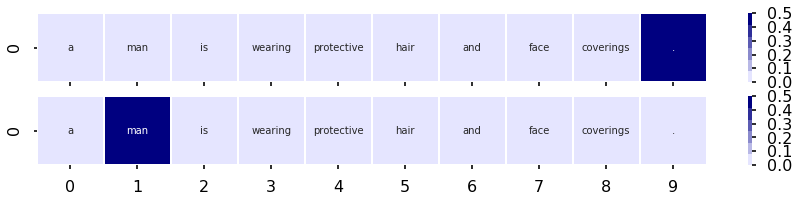

------------------------------
a boy on his cellphone standing on ground
12


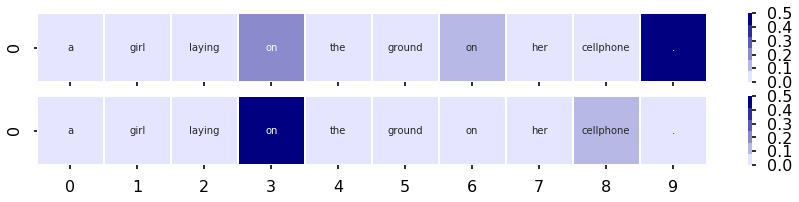

------------------------------
women cooking dinner
12


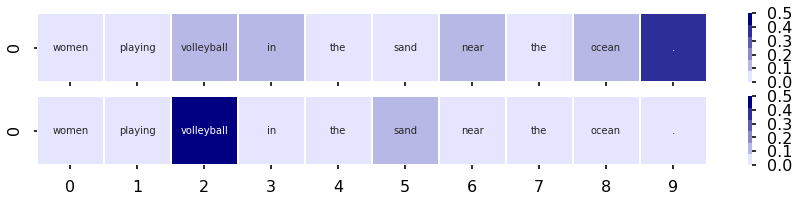

------------------------------
an elderly woman with a cane is sitting on a chair .
12


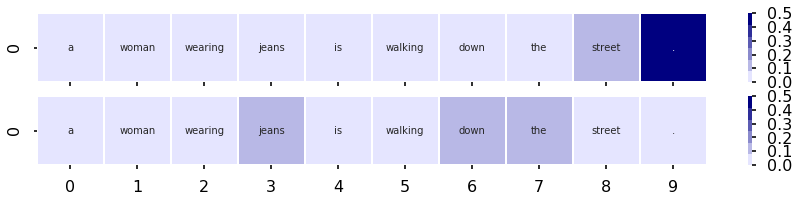

------------------------------
a chef is cooking stew .
12


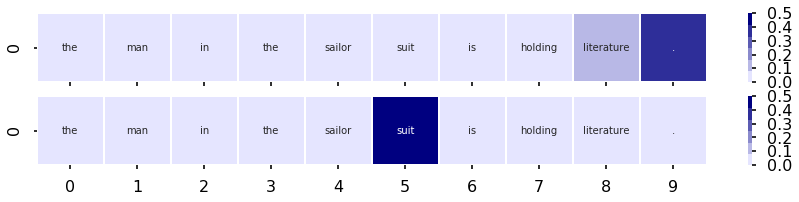

------------------------------
a woman examines a bike
12


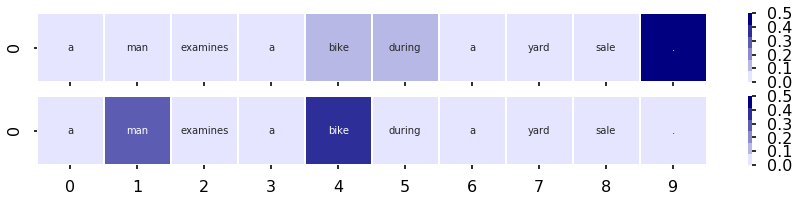

------------------------------
the women in <UNK> dresses look out over the farm .
12


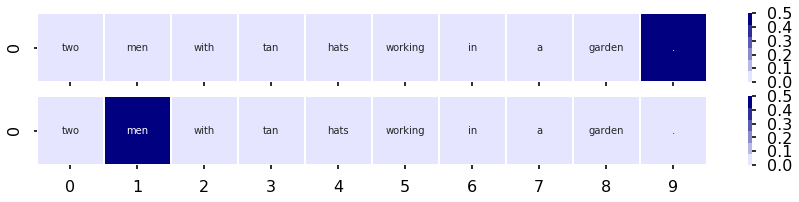

------------------------------
a group of women are baking in a kitchen .
12


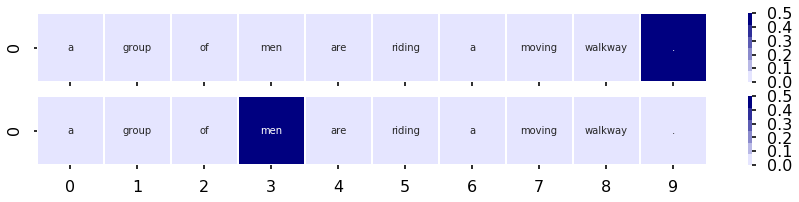

------------------------------
the men are inside
12


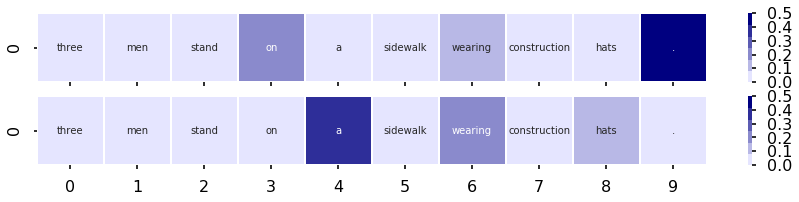

------------------------------
a dad and his daughter with an blueberry pie .
12


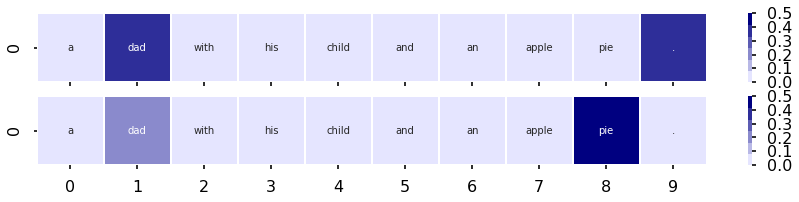

------------------------------
a women is skiing of the mountain .
12


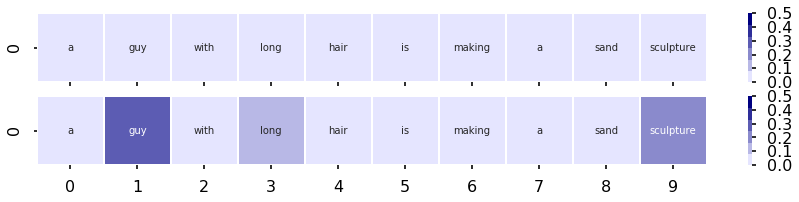

------------------------------
a girl is picks up her skateboard .
12


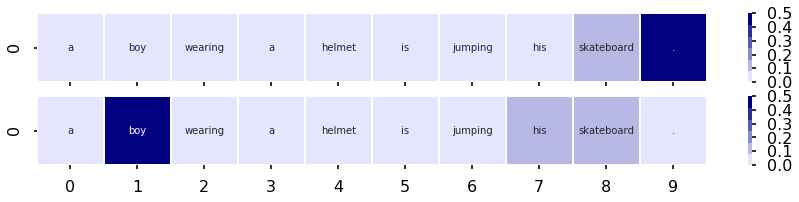

------------------------------
a man and a woman feeding eachother food at a table .
12


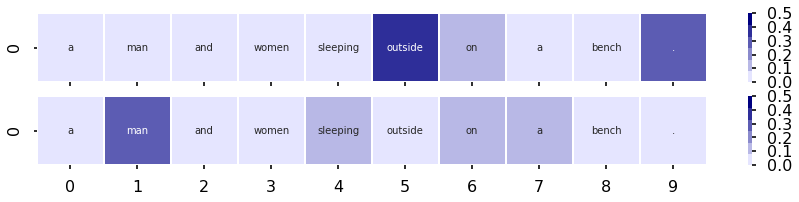

------------------------------
species of animals are indoors .
12


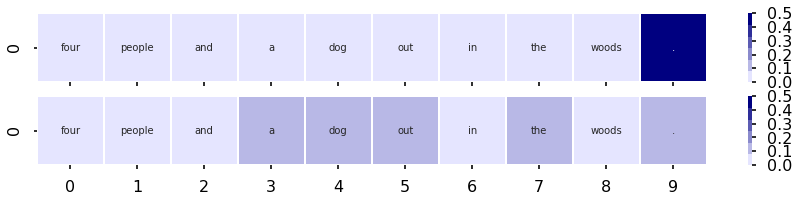

------------------------------
a girl is having a tea party in her room .
12


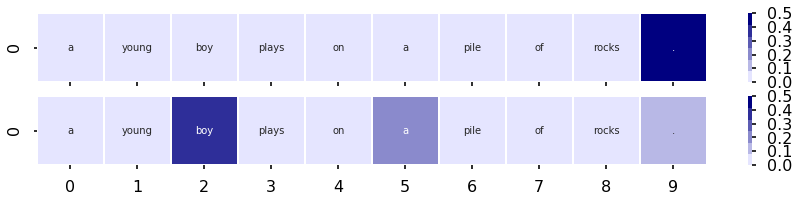

------------------------------
a group of woman play volleyball in a court .
12


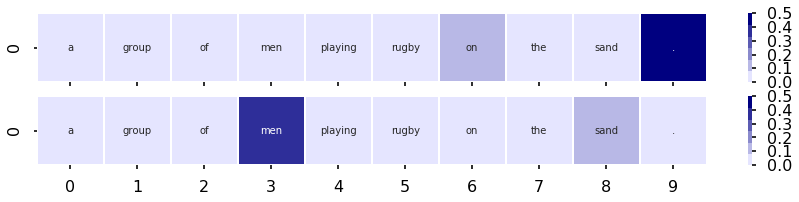

------------------------------
a woman grabs a man 's crotch during a protest .
12


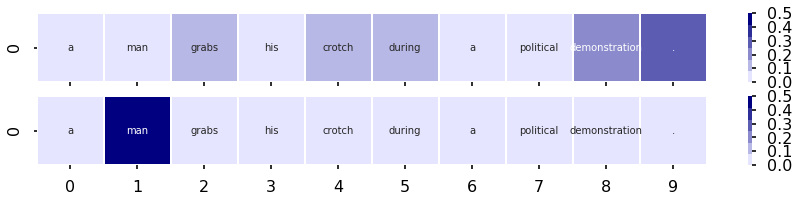

------------------------------
the woman is doing a speech .
12


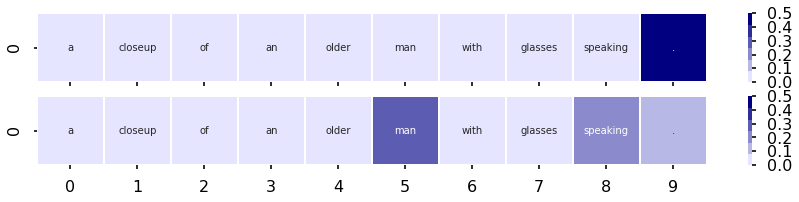

------------------------------
a girl is hitting the ball .
12


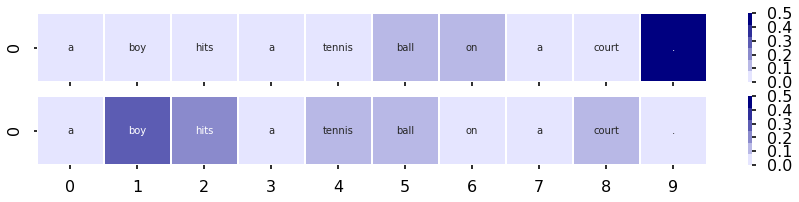

------------------------------
two women are wearing red
12


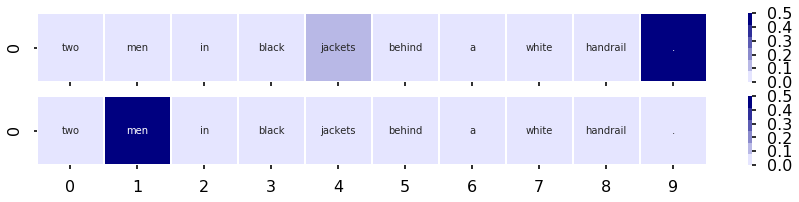

------------------------------
there is a a lot of people on a train .
13


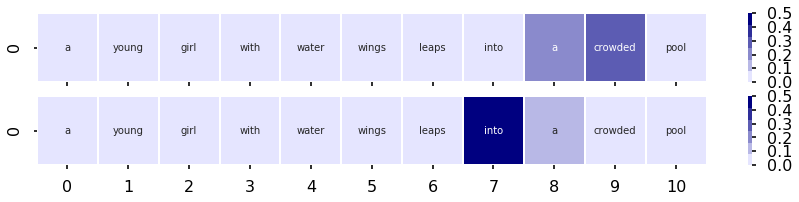

------------------------------
the old man was walking with his cane .
13


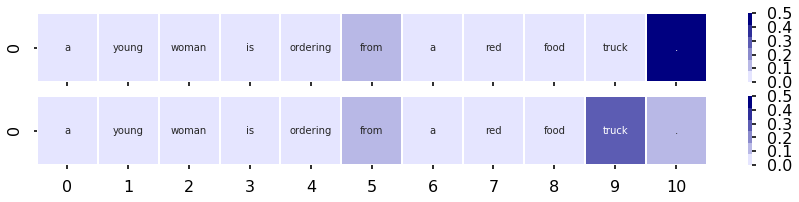

------------------------------
the lady is at the hair salon .
13


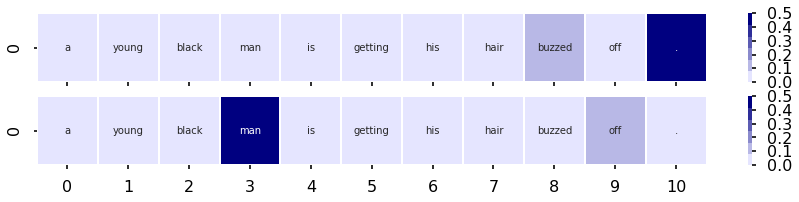

------------------------------
a dog is napping on the bed .
13


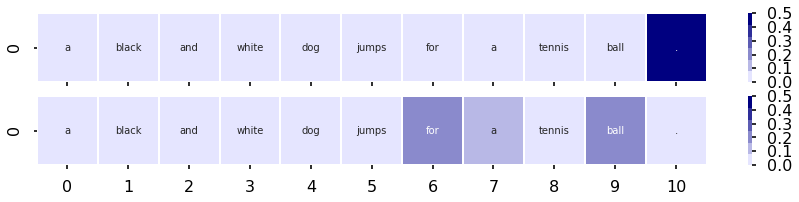

------------------------------
a woman is yelling at a camera .
13


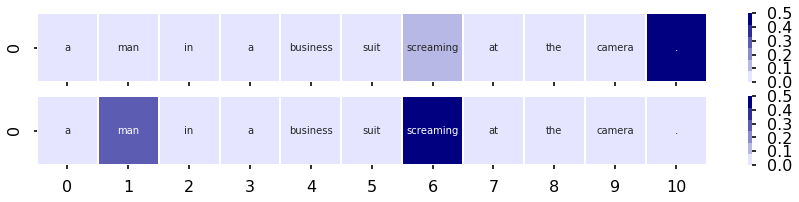

------------------------------
a white dog is chewing on his food .
13


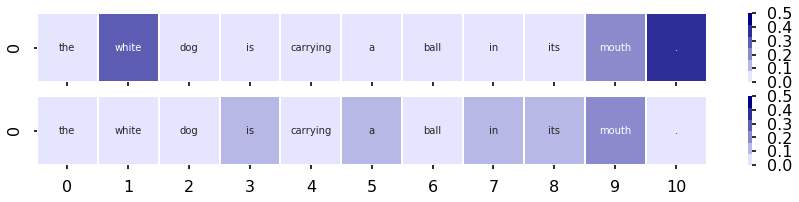

------------------------------
a group of men are scuba diving .
13


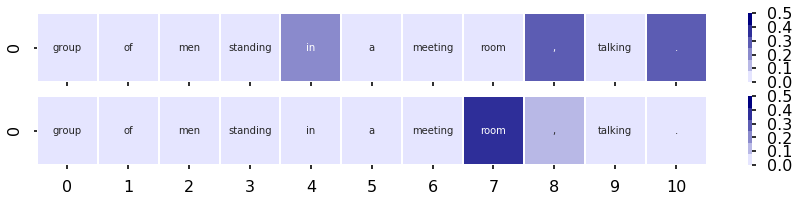

------------------------------
the man is wearing a red shirt .
13


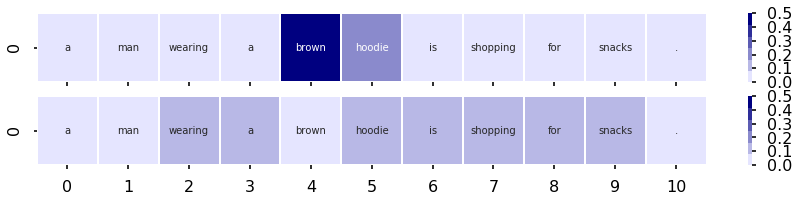

------------------------------
the woman is eating lunch .
13


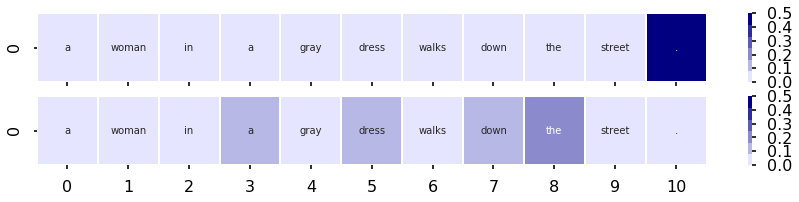

------------------------------
a woman is standing in the doorway of a building .
13


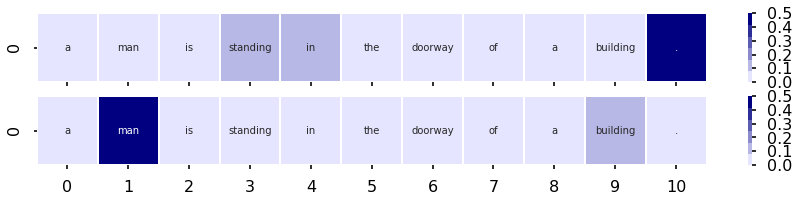

------------------------------
the man attending a meeting in his office .
13


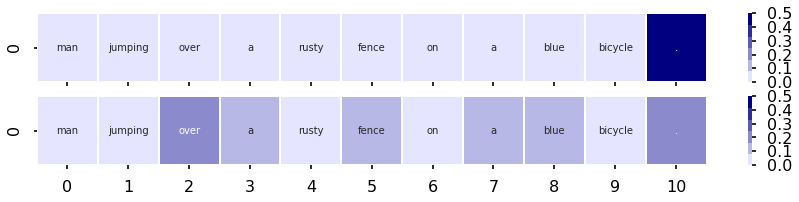

------------------------------
the man and his dog are taking a boat ride .
13


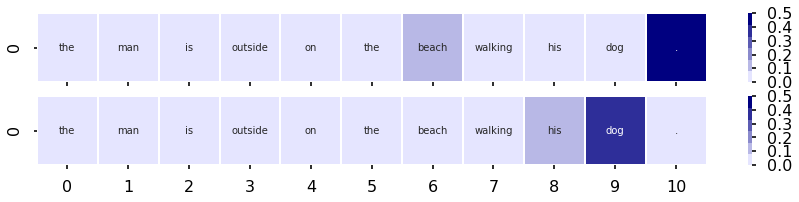

------------------------------
two women enjoying happy hour .
13


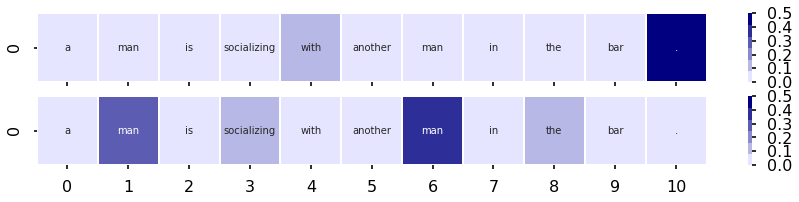

------------------------------
the man is sparring in the gym .
13


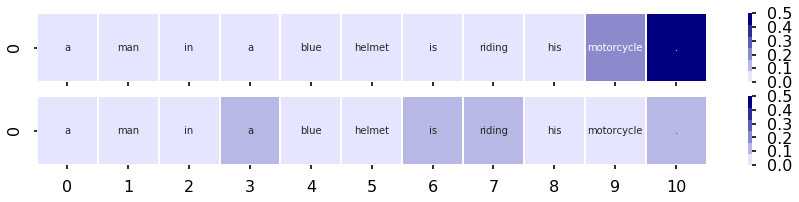

------------------------------
a young girl does aerobics .
13


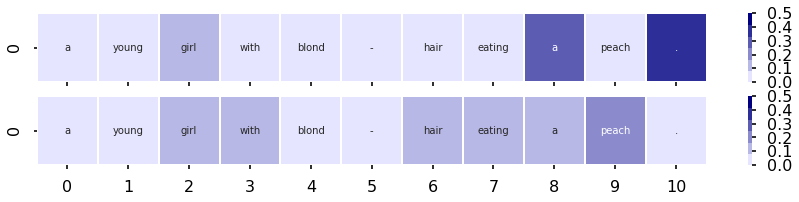

------------------------------
the dog ate a spoon
13


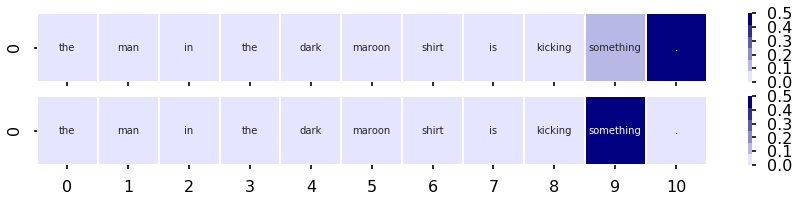

------------------------------
a woman wears a shirt on a unicycle .
13


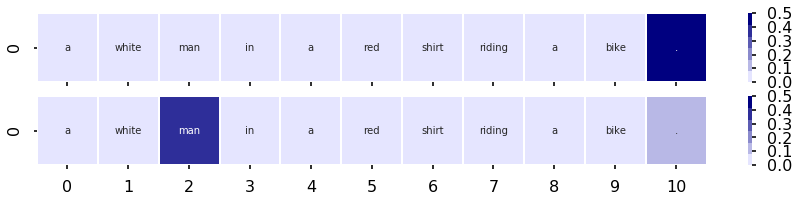

------------------------------
a man rolls on the ground on fire .
13


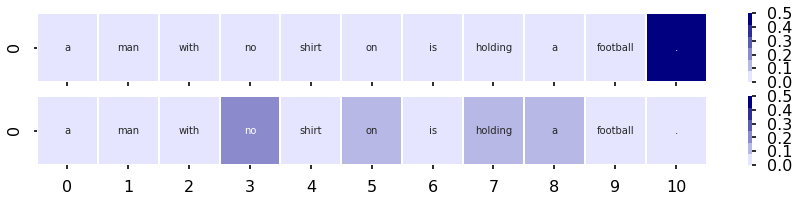

------------------------------
a young woman working in the snow .
13


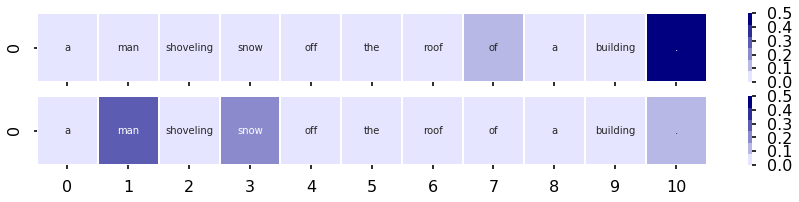

------------------------------
a couple of children are eating popsicles at a birthday party .
13


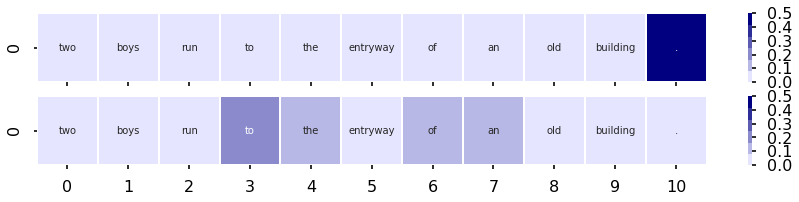

------------------------------
a woman takes a nap .
13


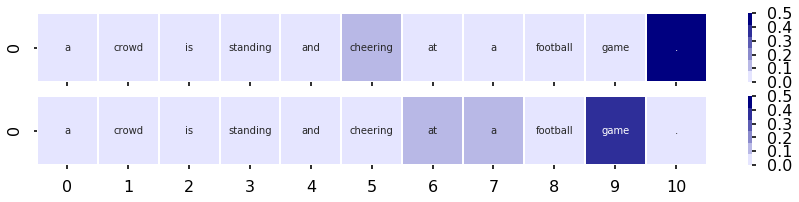

------------------------------
a man is kicking some rocks .
13


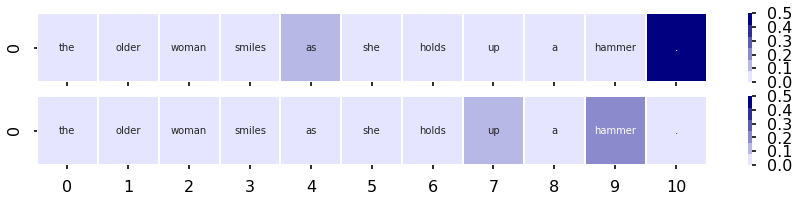

------------------------------
they are girls there too
13


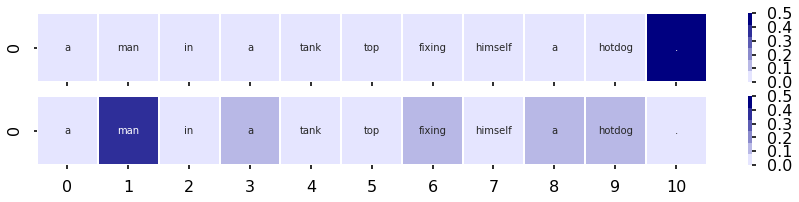

------------------------------
two dogs sleep in a dog bed .
13


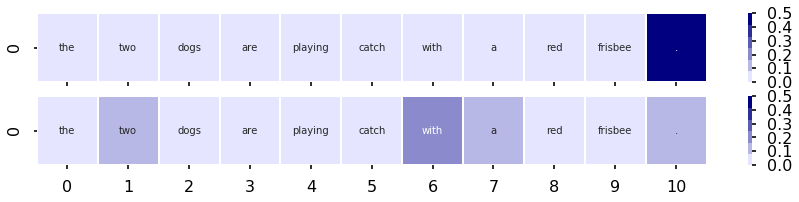

------------------------------
a woman soldier speaks into the microphone .
13


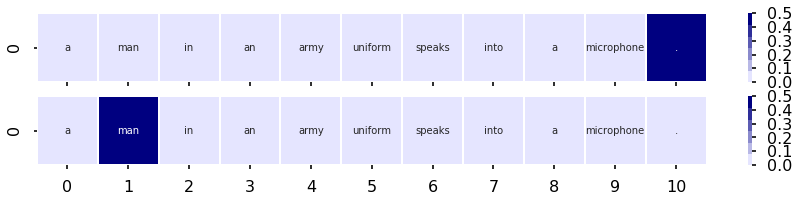

------------------------------
the man is playing football ..
13


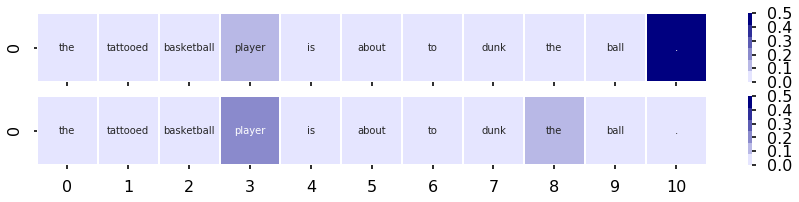

------------------------------
a cowboy is swimming in the arena
13


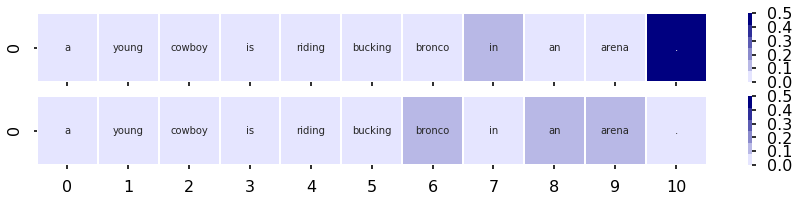

------------------------------
a group of people are sitting in the library .
13


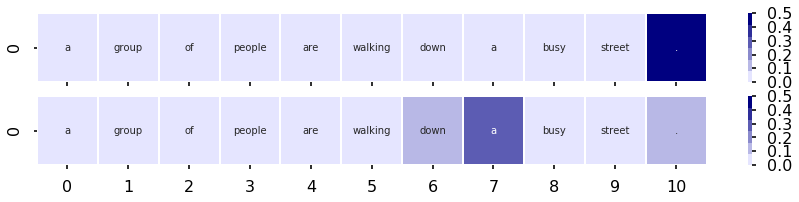

------------------------------
a cat is playing in the snow .
13


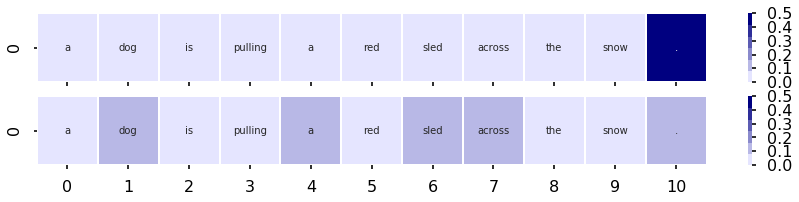

------------------------------
people are dancing to music in a club .
13


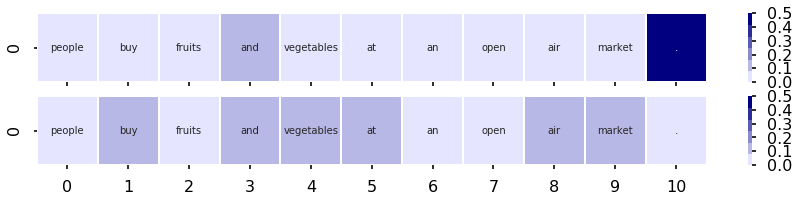

------------------------------
the man is dancing under the stars .
13


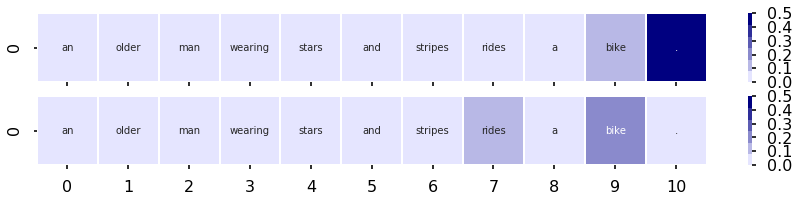

------------------------------
the person is wearing a green shirt .
14


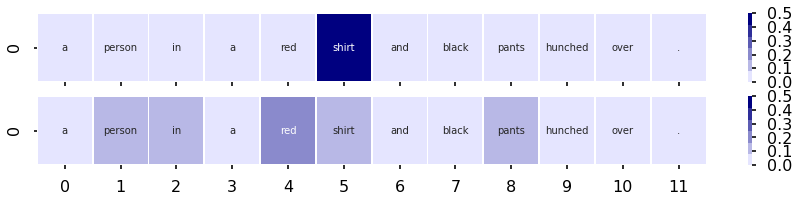

------------------------------
an old woman sits on a bench .
14


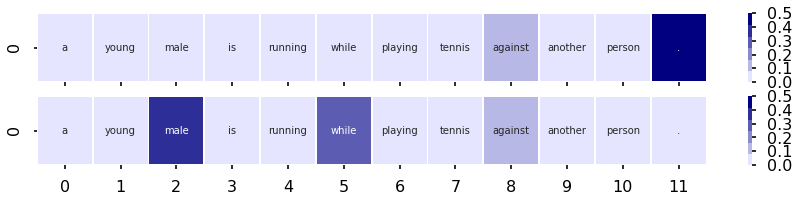

------------------------------
a little girl in a gray jacket is driving a car .
14


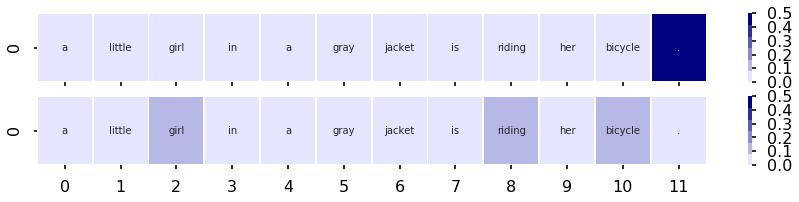

------------------------------
three people sit in a cafe .
14


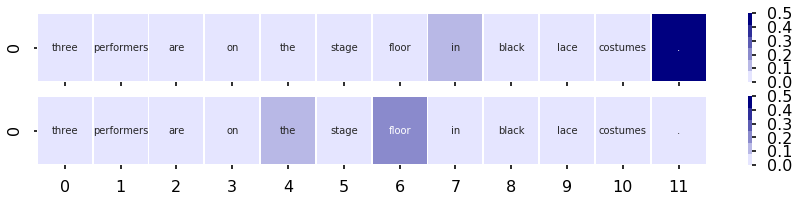

------------------------------
a woman is baking bread in the oven .
14


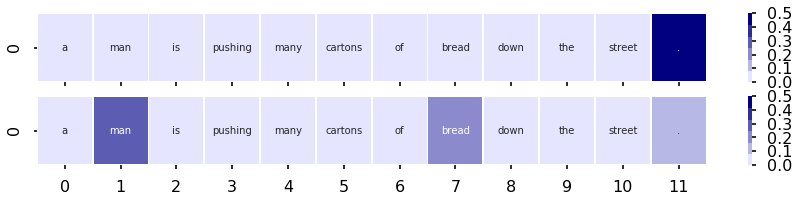

------------------------------
the people are indoors .
14


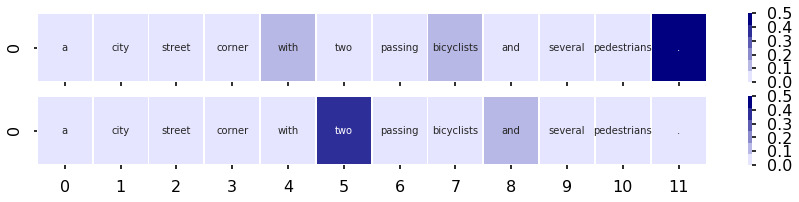

------------------------------
a woman is using what looks to be a fax machine .
14


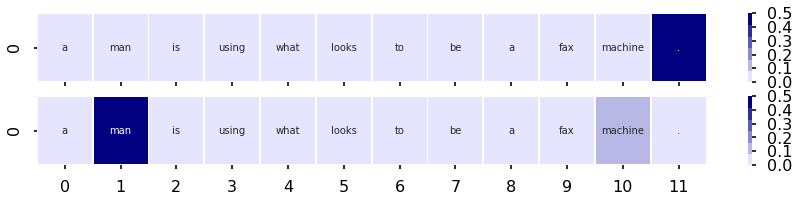

------------------------------
a woman is riding a bicycle .
14


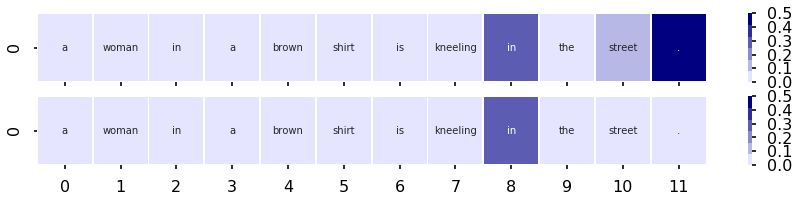

------------------------------
a girl is chasing a rabbit .
14


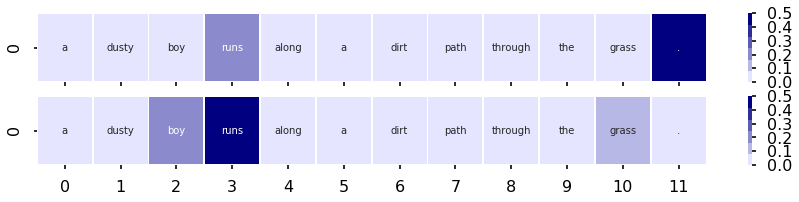

------------------------------
a man folding his laundry .
14


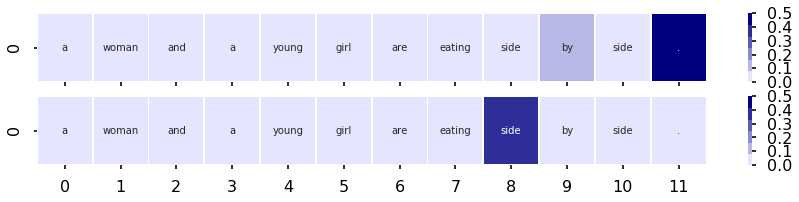

------------------------------
a woman drinks .
14


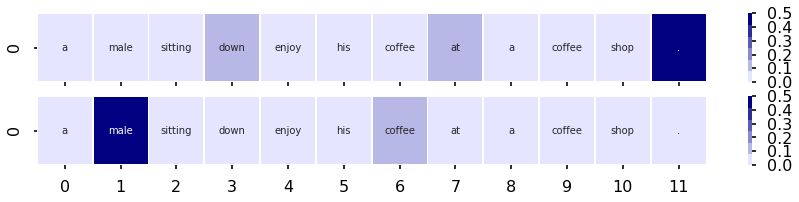

------------------------------
two cats are in the lake .
14


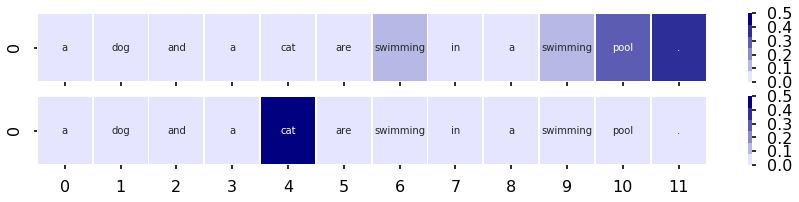

------------------------------
a woman is in the shower .
14


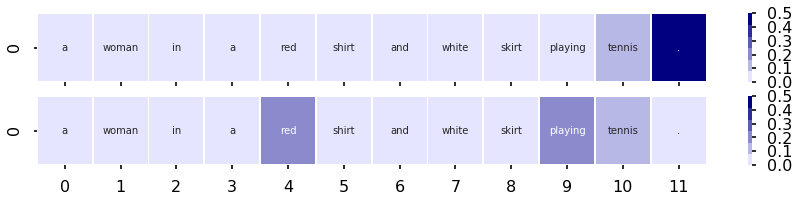

------------------------------
a woman and her dog are eating breakfast .
14


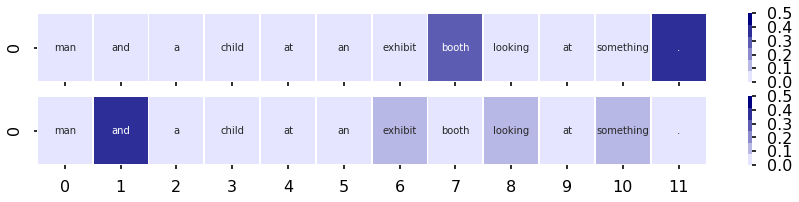

------------------------------
two girls hating the town .
14


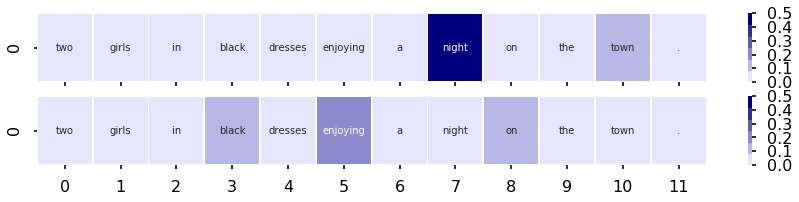

------------------------------
a study group sits at a table in the library .
14


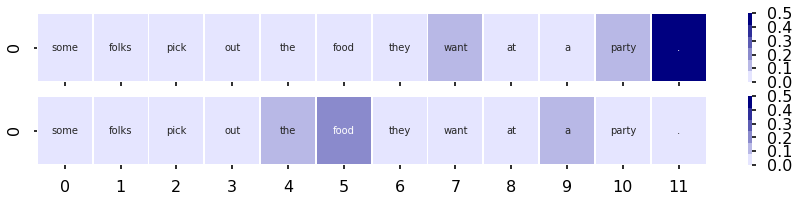

------------------------------
a child is tosses into a box by a woman .
14


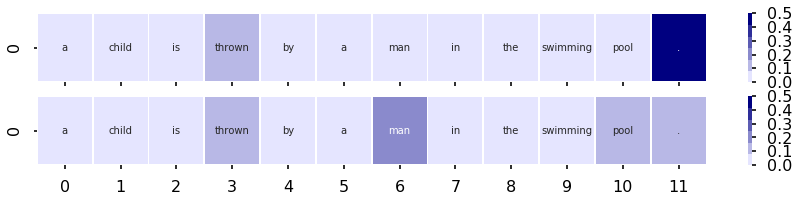

------------------------------
a little boy is walking out of the train .
14


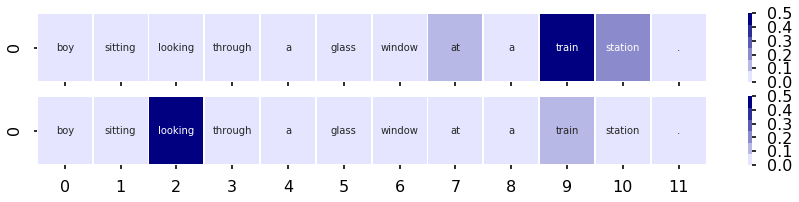

------------------------------
the women are going for a run in the forest .
14


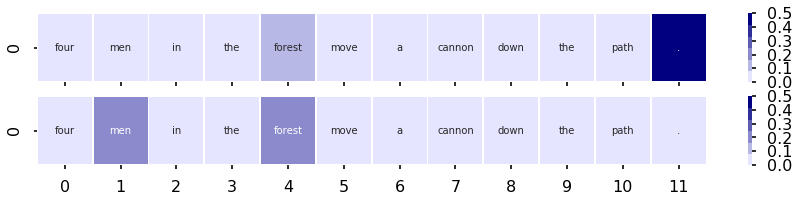

------------------------------
a girl stands in the middle of a crowd of teenagers .
14


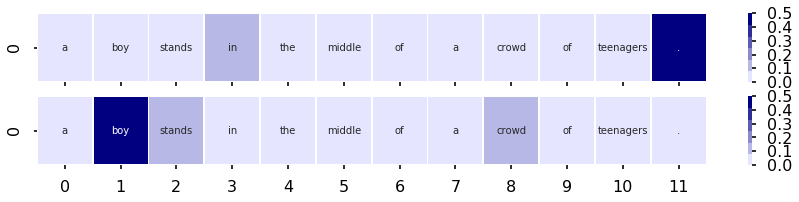

------------------------------
the child has a green shirt .
14


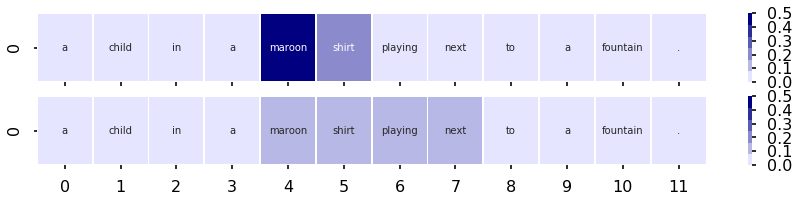

------------------------------
a boy drinks coffee
14


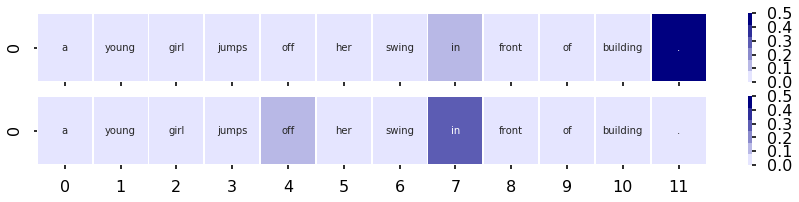

------------------------------
a woman is smoking a cigarette .
14


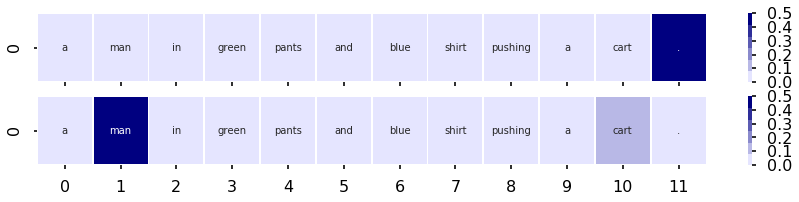

------------------------------
people are surfing in the ocean .
14


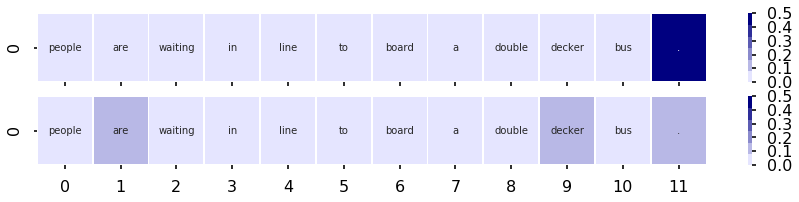

------------------------------
a man is riding a bicycle down the large hill .
14


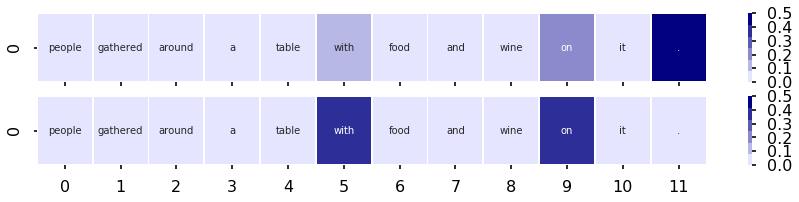

------------------------------
a boy and a girl are cooking breakfast .
14


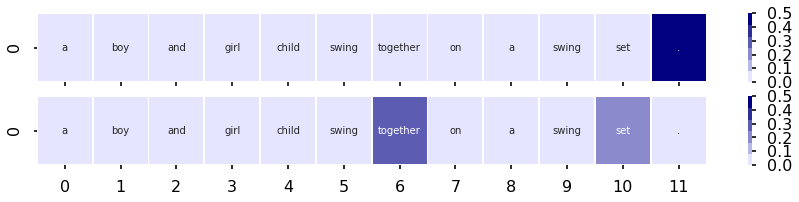

------------------------------
a woman is doing <UNK> at home .
14


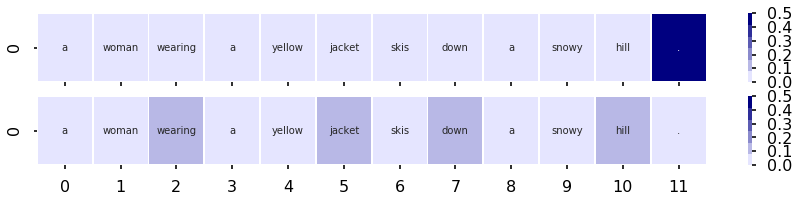

------------------------------
Cropping saved pngs
Done cropping
150


In [97]:
# 2 => Neutral(1992), # 1 => entailment(2481), #0 => contradiction(2172)

count = print_attention(output1,output2, output3, max=150, plot=True, output_filter=0, jsd_thresh=0.21)
print(count)

times square is a place .
8


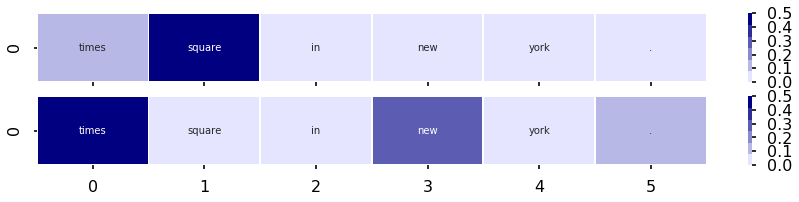

------------------------------
a basket weaving instructor at the fair .
8


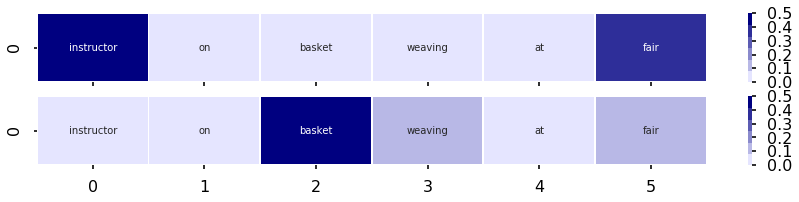

------------------------------
there is a man .
8


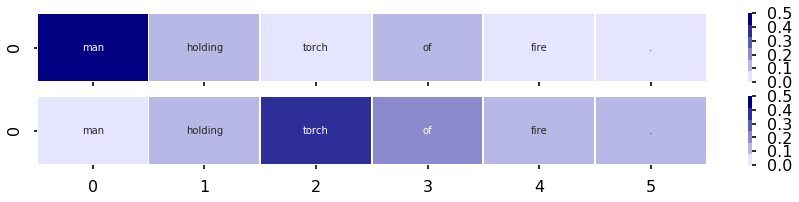

------------------------------
a wooden path towards the shore .
8


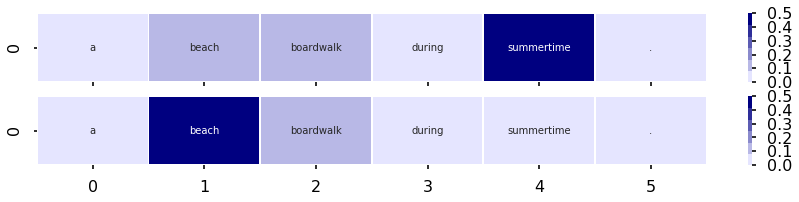

------------------------------
the band is playing .
8


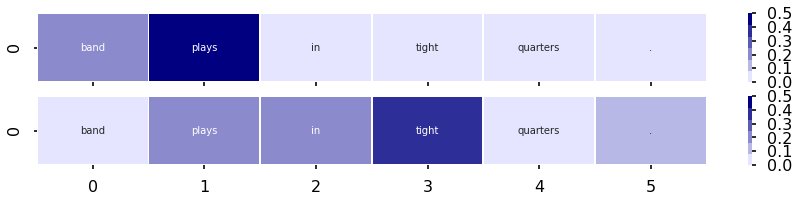

------------------------------
the men are working
9


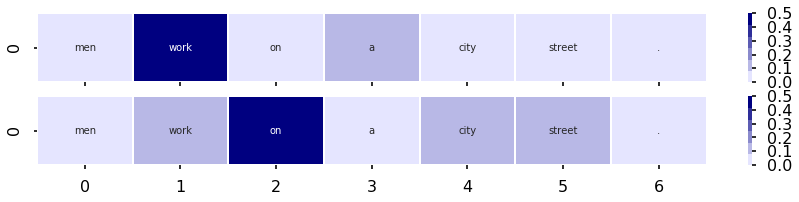

------------------------------
there 's a young boy with rocks in hand .
9


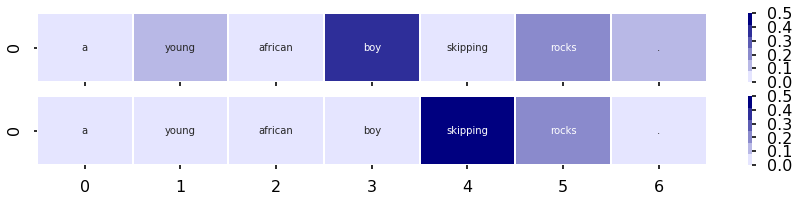

------------------------------
a man is wearing black .
9


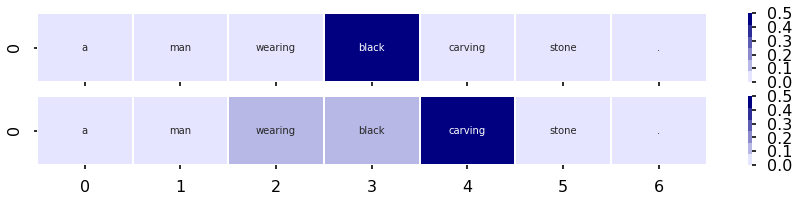

------------------------------
a family is standing outside .
9


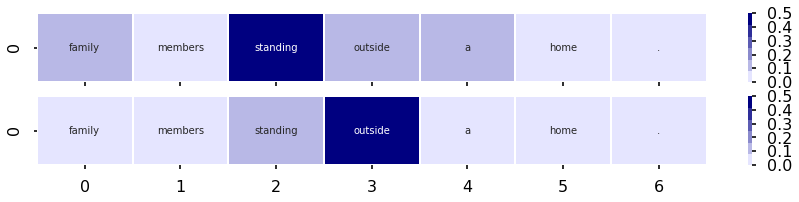

------------------------------
a choir of kids are singing
9


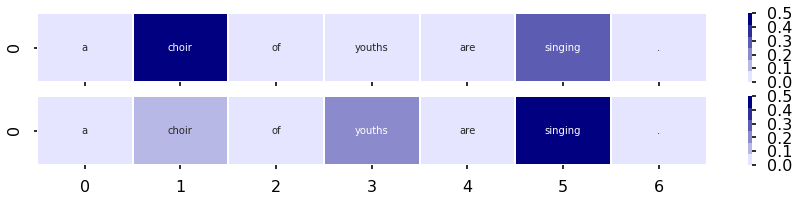

------------------------------
there are multiple people present .
10


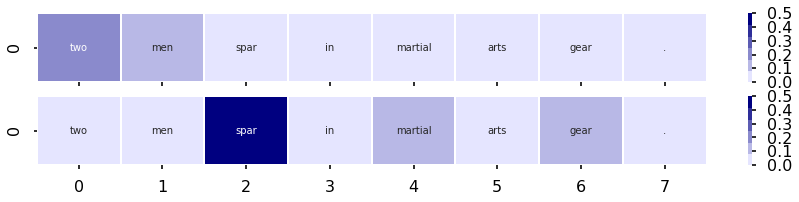

------------------------------
food is being prepared and served .
10


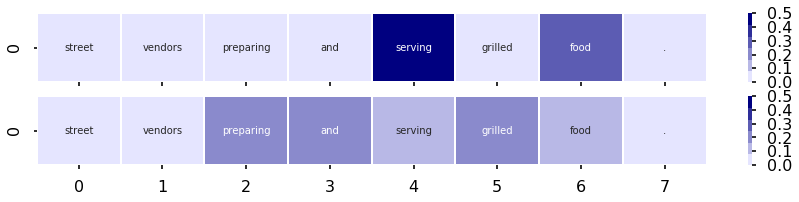

------------------------------
a woman is singing on stage .
10


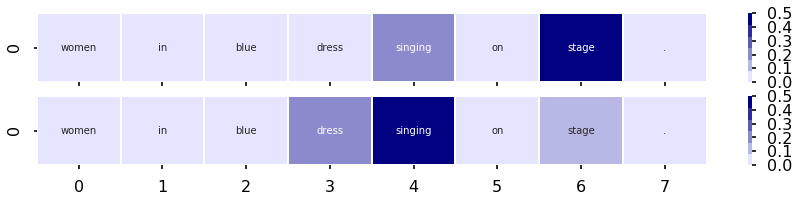

------------------------------
the man has something in his hand .
10


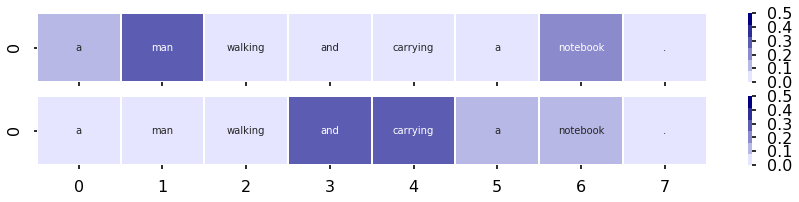

------------------------------
a red shirt as attire .
10


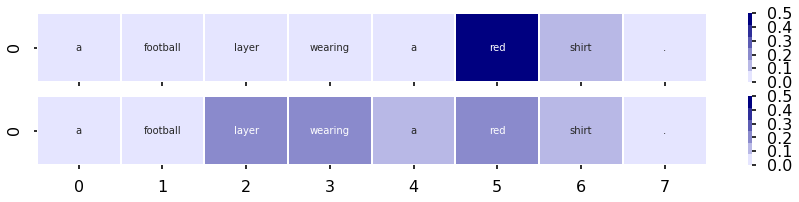

------------------------------
people make balloons
10


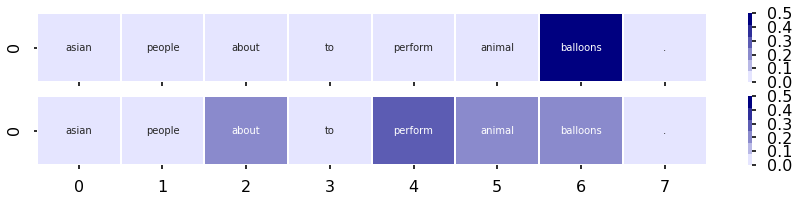

------------------------------
the person is snowboarding .
10


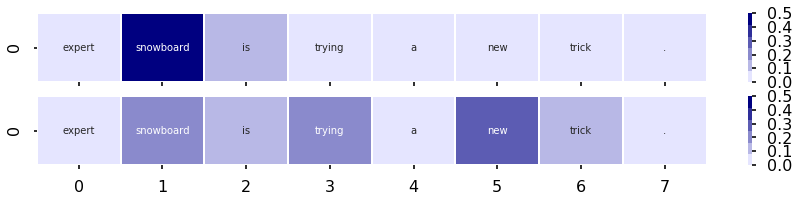

------------------------------
people are in a snowstorm .
10


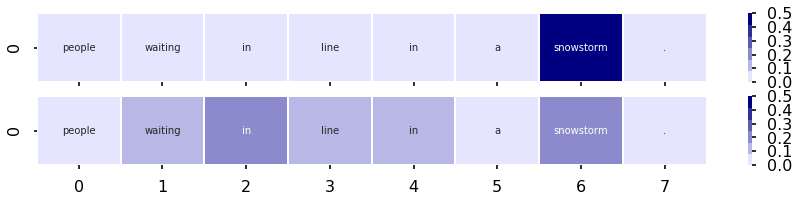

------------------------------
soccer players are trying to get the ball .
10


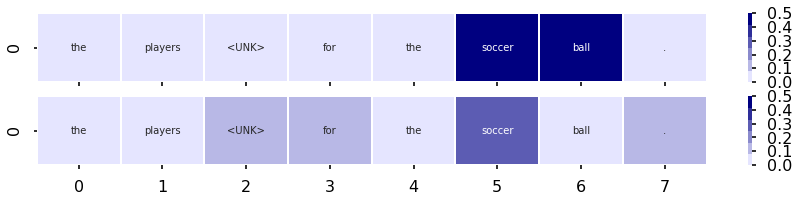

------------------------------
gymnasts get ready for a competition .
10


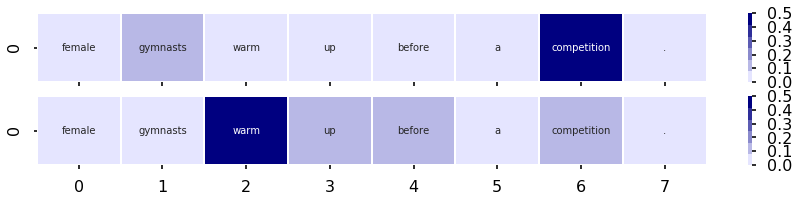

------------------------------
a human in motion .
10


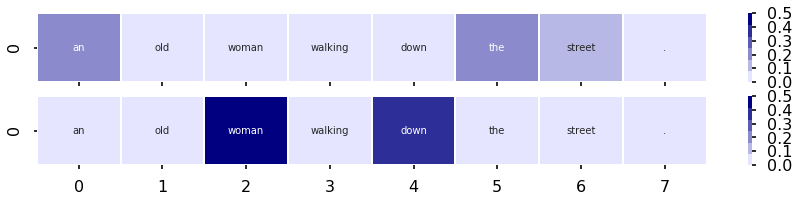

------------------------------
the child is on the steps .
10


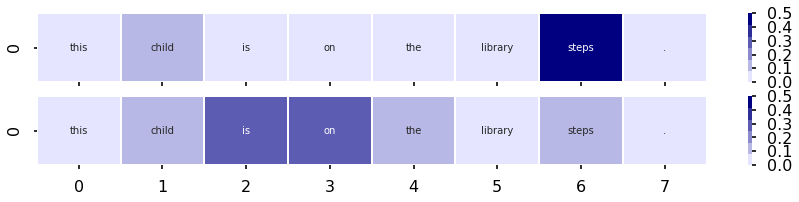

------------------------------
a group of people stand together .
11


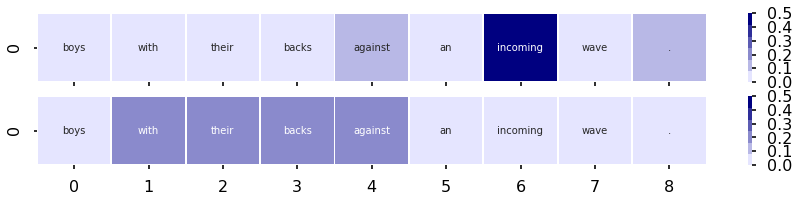

------------------------------
the man is currently competing .
11


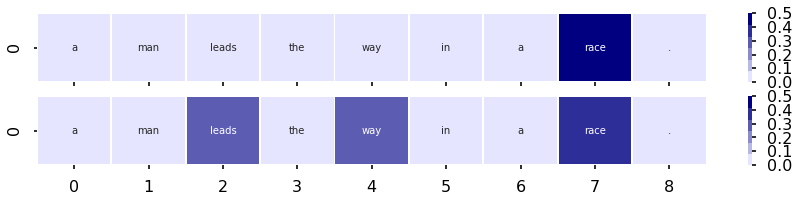

------------------------------
a woman wears glasses .
11


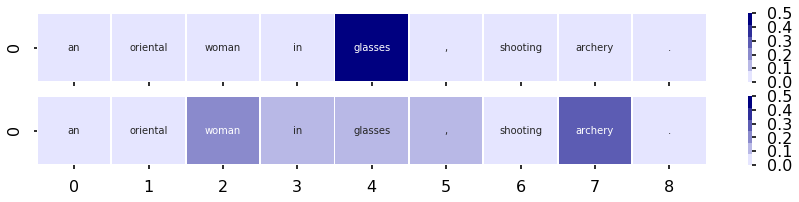

------------------------------
a man wearing a coat .
11


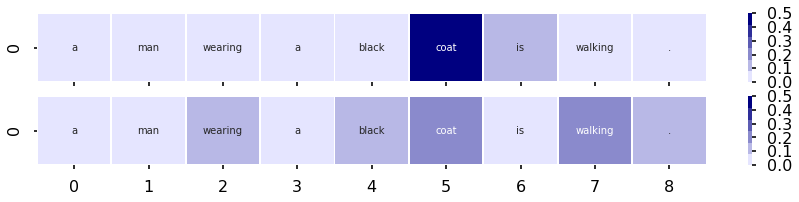

------------------------------
there are people at a table .
11


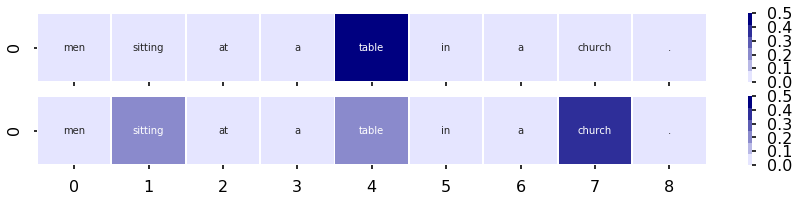

------------------------------
men are in wetsuits
11


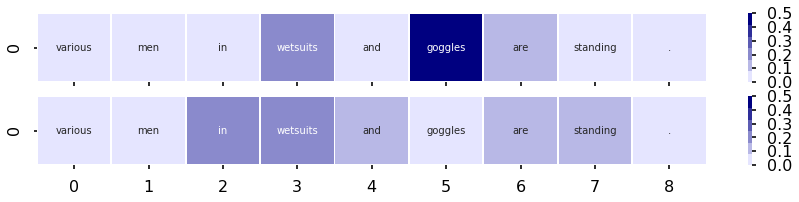

------------------------------
the dogs are near the toy .
11


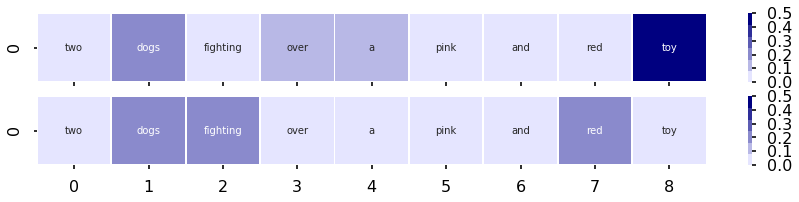

------------------------------
there is a topless child playing in the water .
11


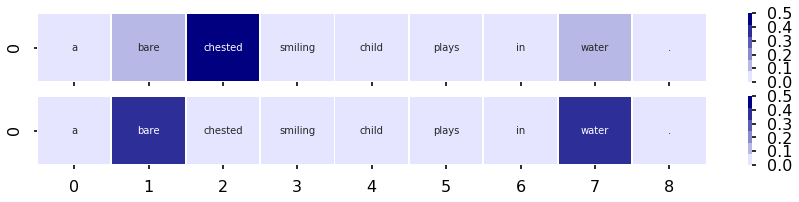

------------------------------
people move around outside .
11


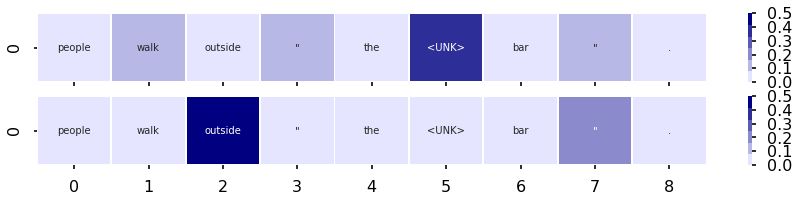

------------------------------
an area is lit up by flashlight .
11


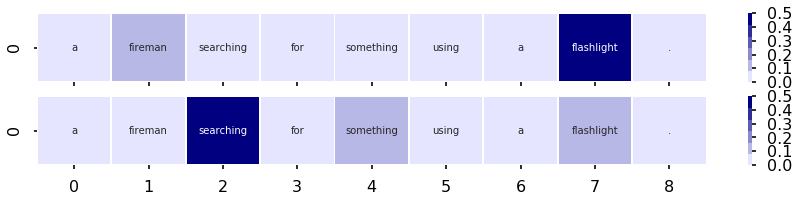

------------------------------
the girl has a beverage .
12


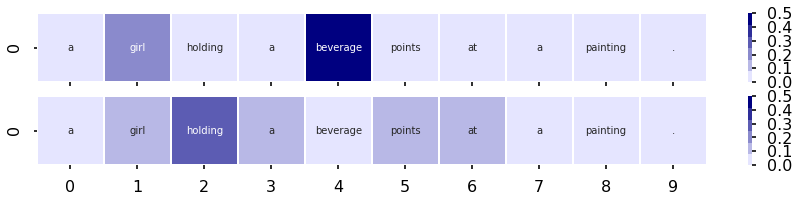

------------------------------
a kid is wearing colorful clothing .
12


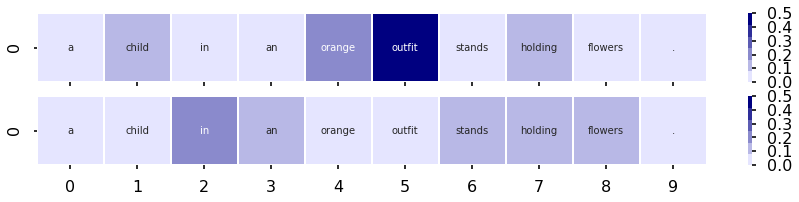

------------------------------
a cyclist dressed in black and white points .
12


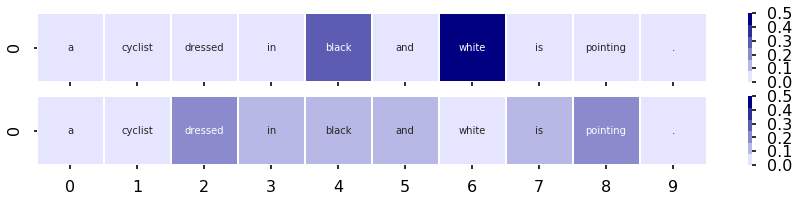

------------------------------
an animal is outside in the cold weather , playing with a plastic toy .
12


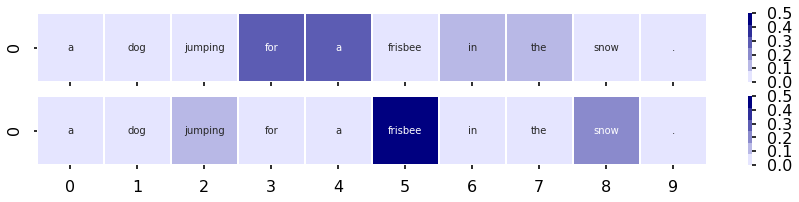

------------------------------
a young person on a skateboard .
12


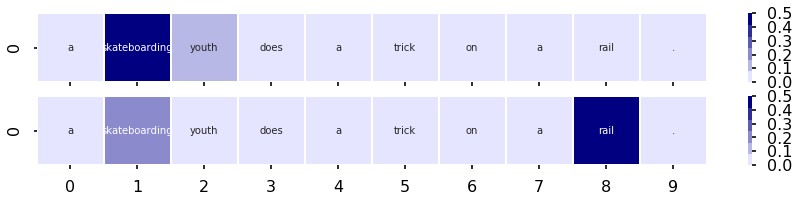

------------------------------
a boy is playing in the swimming pool .
12


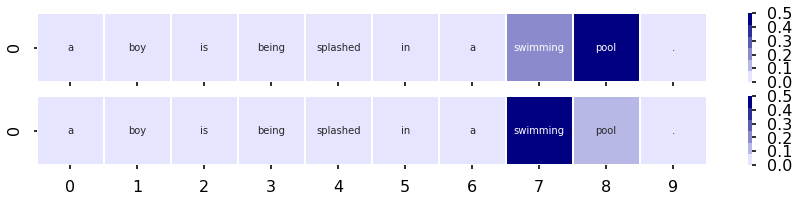

------------------------------
a man is at a yard sale
12


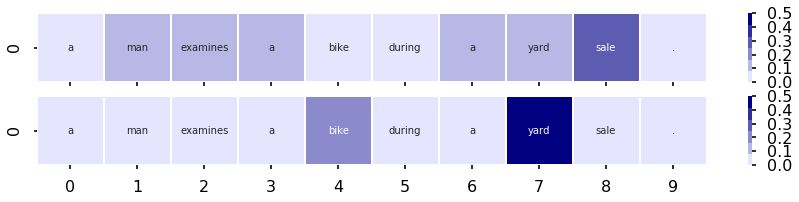

------------------------------
children laugh
12


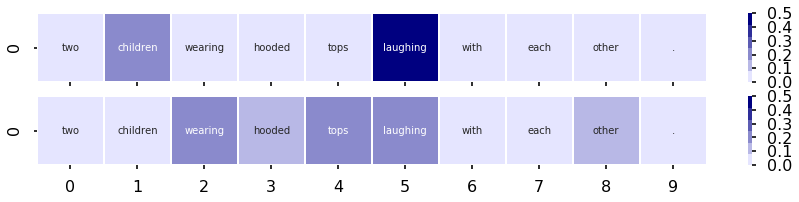

------------------------------
the man is cutting through ice .
12


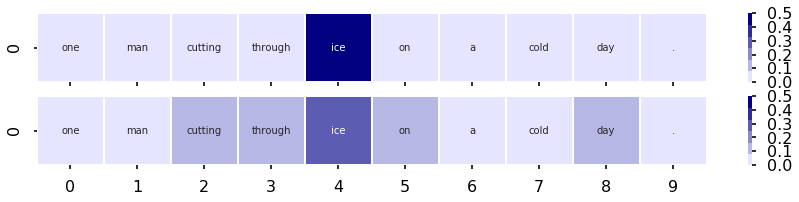

------------------------------
the man is making a crude gesture .
12


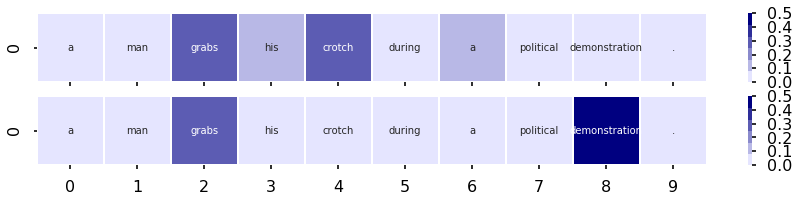

------------------------------
some of the people in the picture are at least fairly athletic .
13


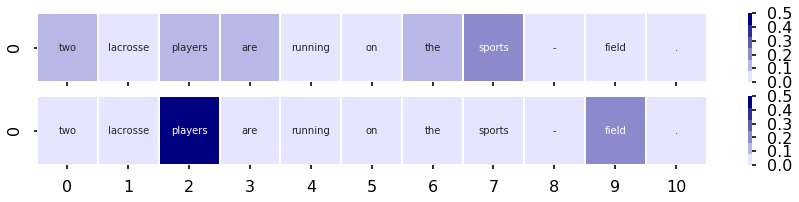

------------------------------
a guy is outside in the snow
13


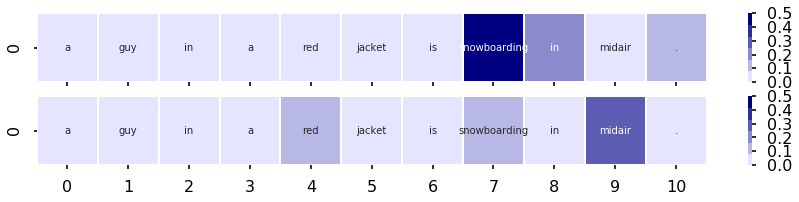

------------------------------
the dog has a ball .
13


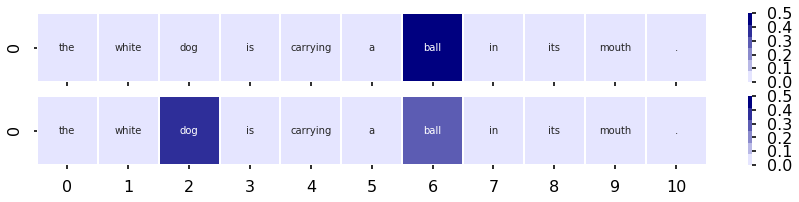

------------------------------
the man is wearing brown .
13


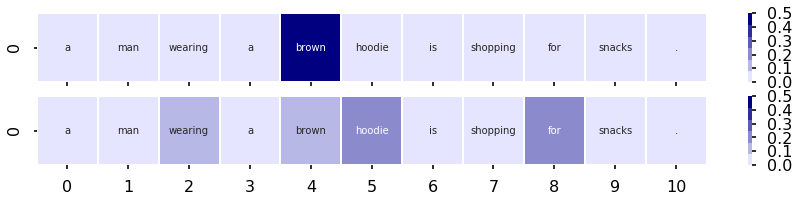

------------------------------
the girl is holding a flower
13


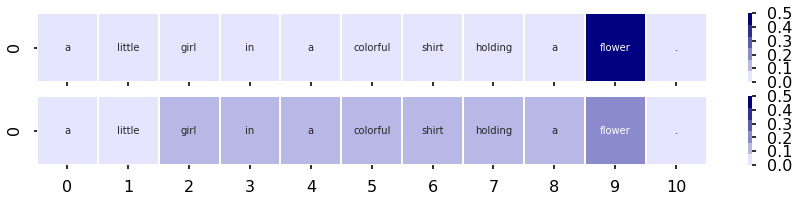

------------------------------
a woman is carrying a serving tray .
13


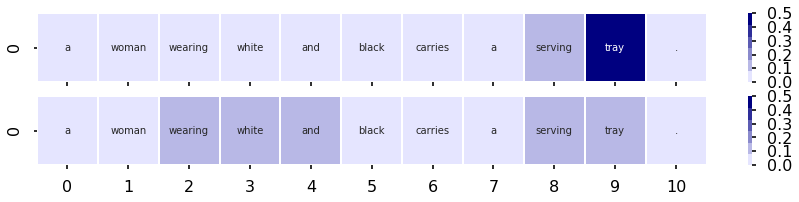

------------------------------
a large group going out
13


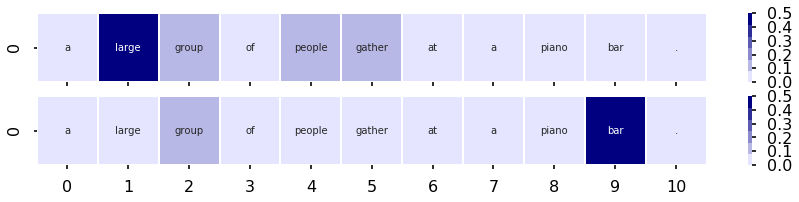

------------------------------
the guy kicked something
13


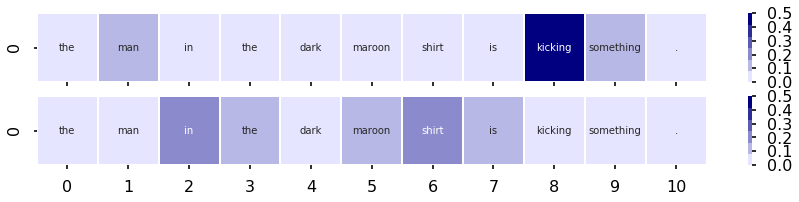

------------------------------
two wrestlers are in a match .
13


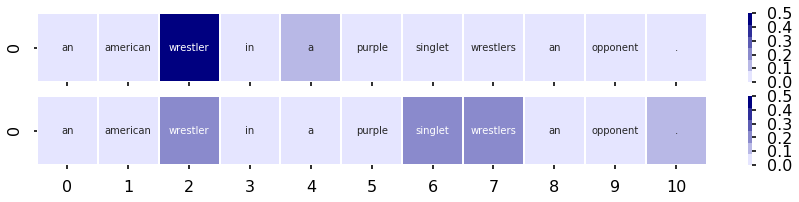

------------------------------
automobiles and humans are outside the hotel .
13


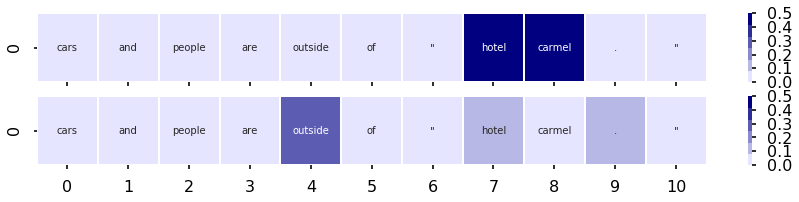

------------------------------
there are children outside .
13


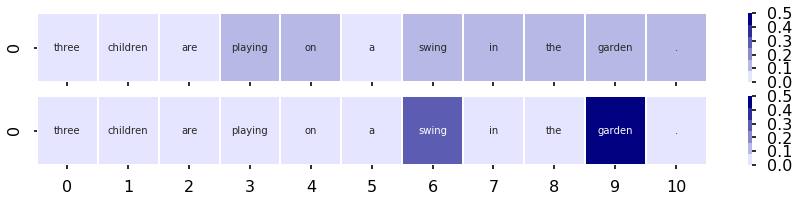

------------------------------
the crowd cheers .
13


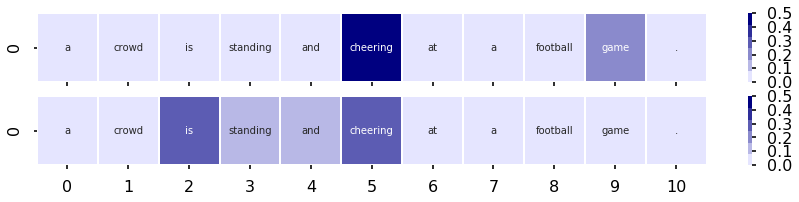

------------------------------
a person is snowboarding .
13


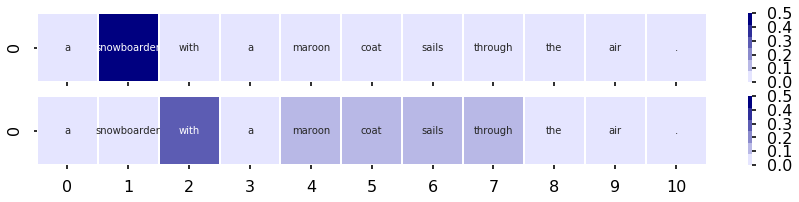

------------------------------
the lady digs into the ground
13


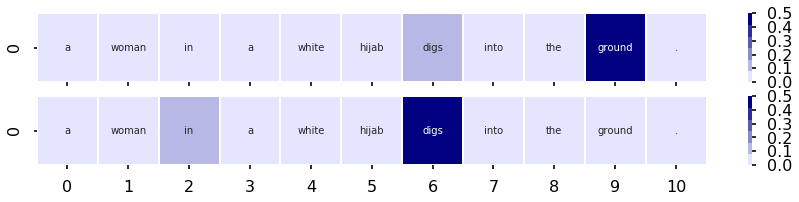

------------------------------
a couple walks outdoors together .
14


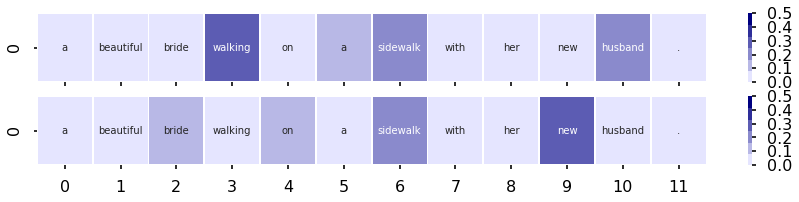

------------------------------
the people are in a city .
14


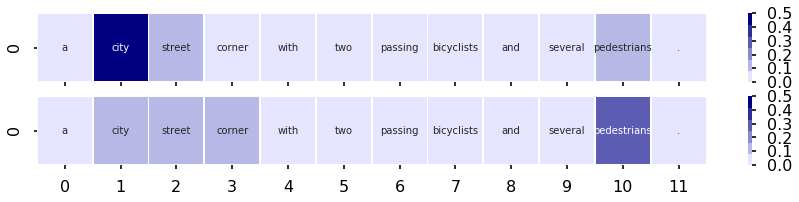

------------------------------
a person is in a vehicle
14


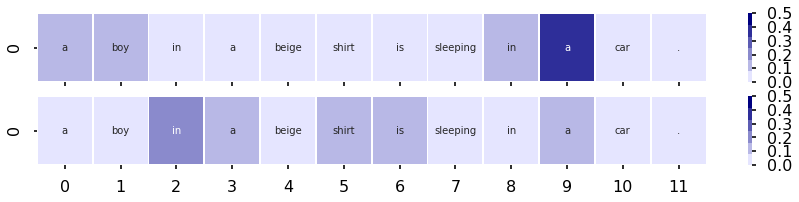

------------------------------
a crowd relaxes in front of a large red building .
14


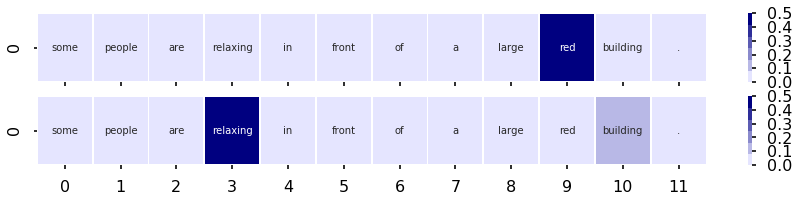

------------------------------
a man sitting on his motorcycle with the sunset directly behind him outside .
14


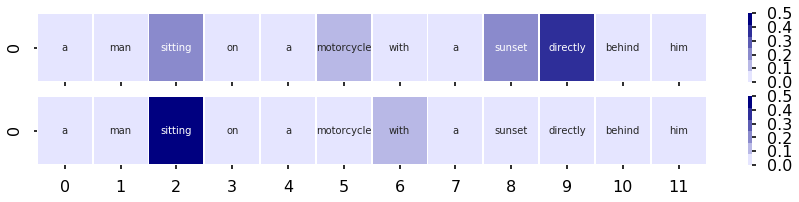

------------------------------
a police officer is moving his mouth .
14


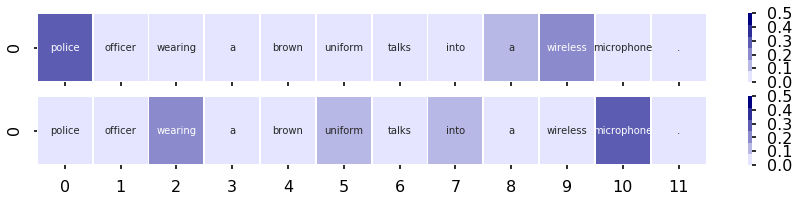

------------------------------
the person is playing rugby .
14


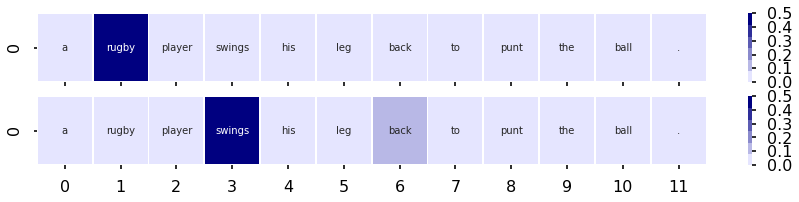

------------------------------
a woman is wearing a shirt .
14


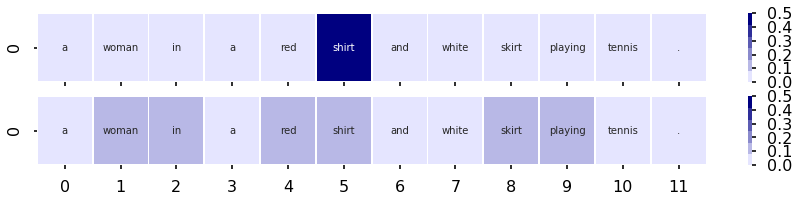

------------------------------
flying black and white bird
14


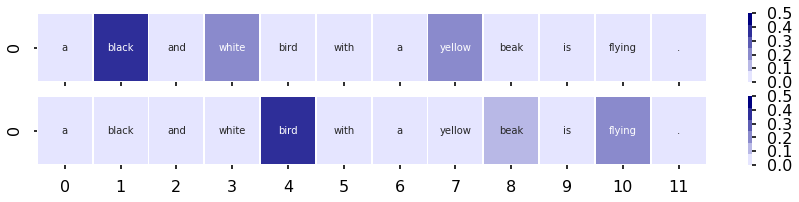

------------------------------
the choir is singing .
14


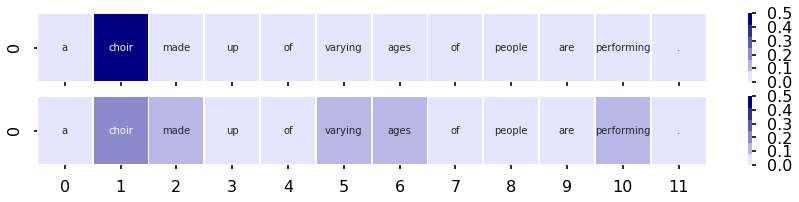

------------------------------
the person is outside .
14


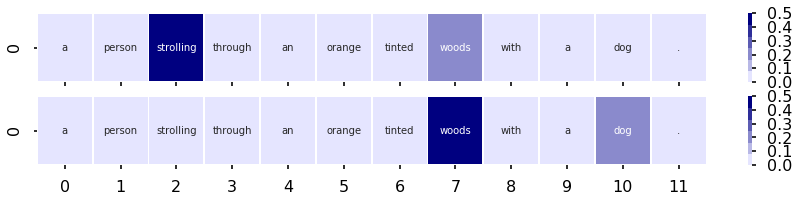

------------------------------
boys playing .
14


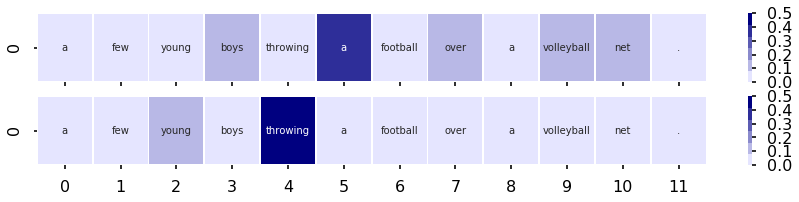

------------------------------
a guy is cutting another man 's hair .
14


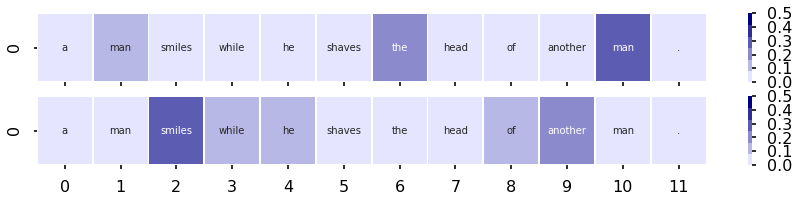

------------------------------
there are people in the fountain .
14


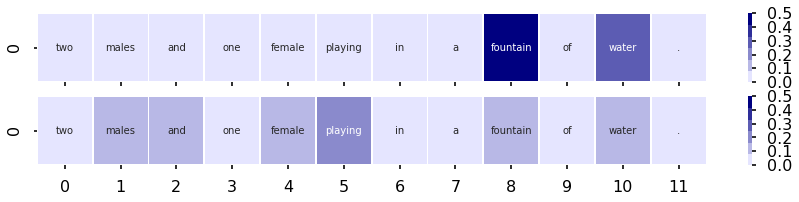

------------------------------
a boy is playing with toys .
14


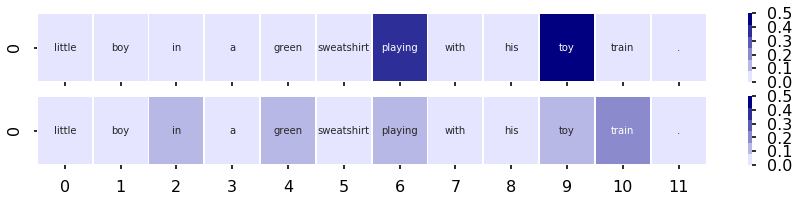

------------------------------
there is a man wearing cloths .
14


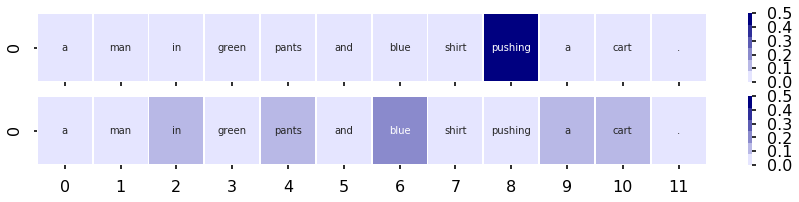

------------------------------
a child is asian .
14


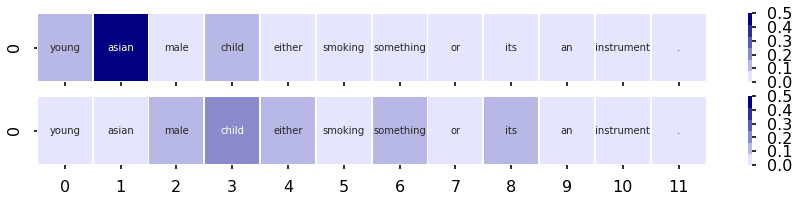

------------------------------
people wearing orange .
14


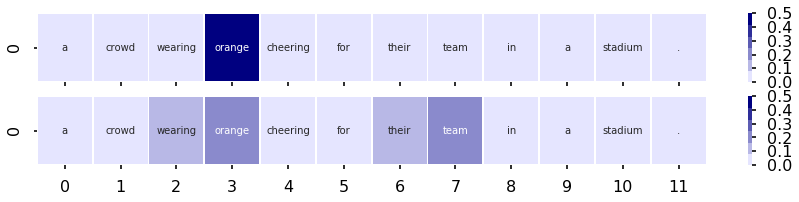

------------------------------
a little baby is wearing blue .
14


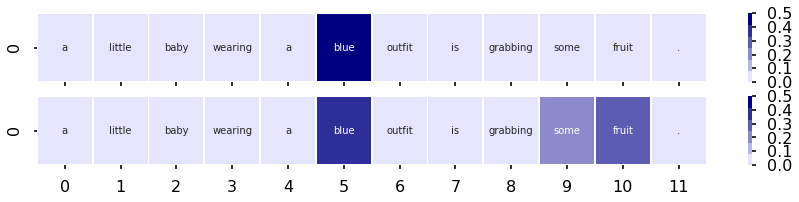

------------------------------
the man is wearing safety gear on his head .
15


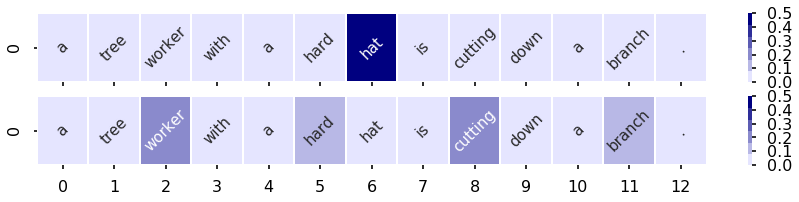

------------------------------
a dog is outdoors .
15


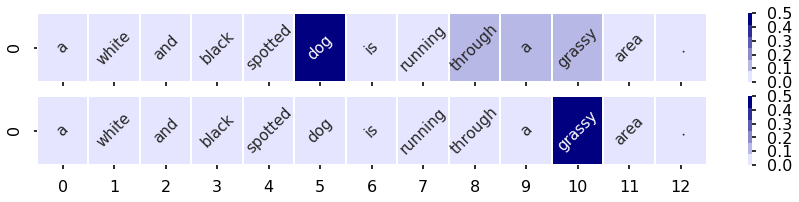

------------------------------
there is a dog outside .
15


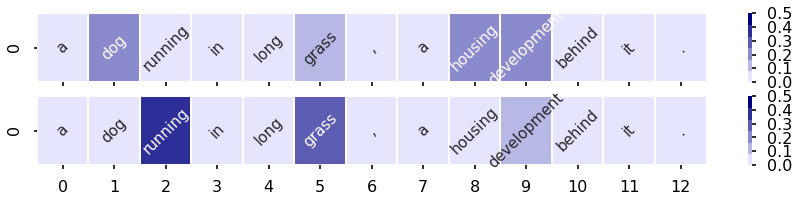

------------------------------
a boy has a yellow bike .
15


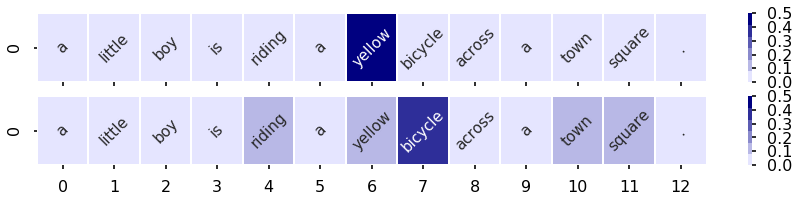

------------------------------
there are people outside .
15


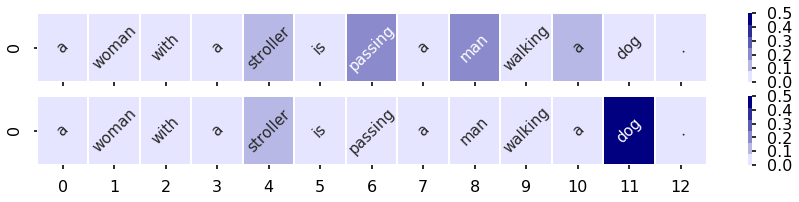

------------------------------
a child is playing .
15


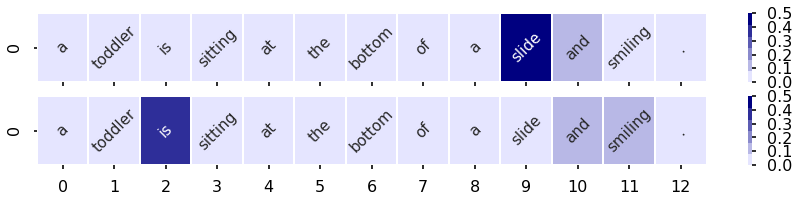

------------------------------
a young boy gets his photo taken .
15


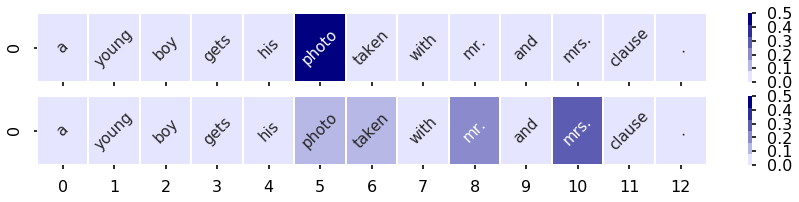

------------------------------
the surfer is surfing .
15


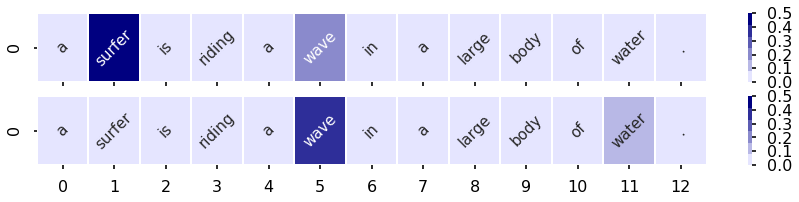

------------------------------
the woman is outdoors
15


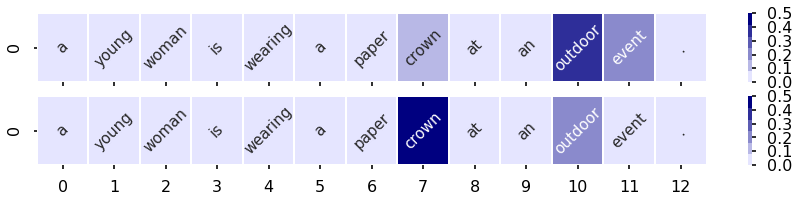

------------------------------
two men are engaging in a sporting activity .
15


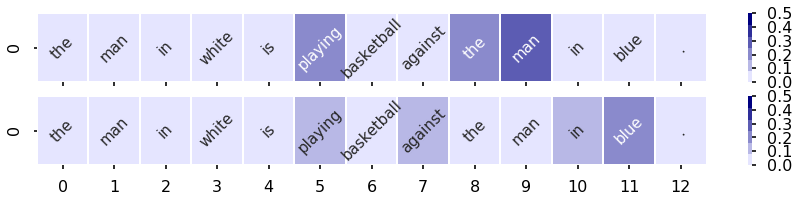

------------------------------
the girl is giving the flowers some water .
15


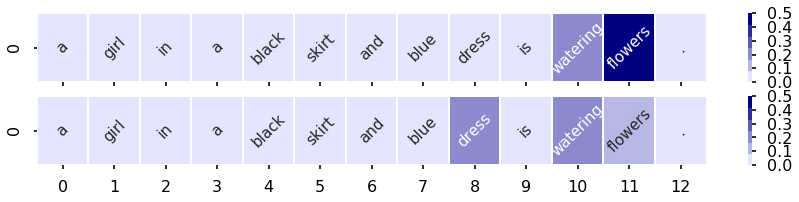

------------------------------
there are men outdoors .
15


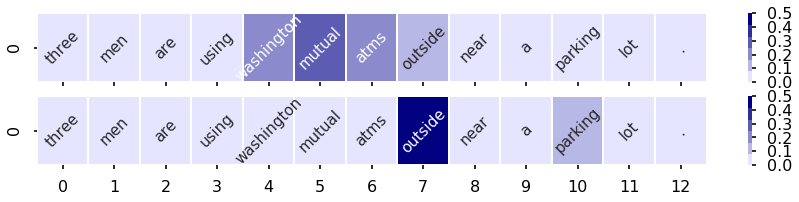

------------------------------
a girl is wearing orange .
15


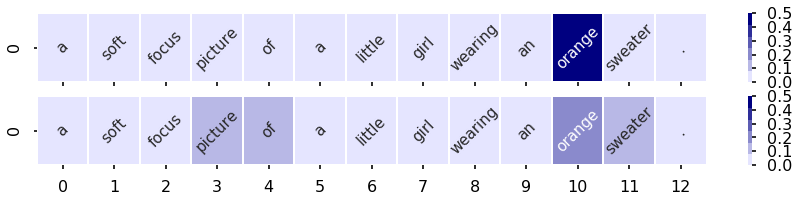

------------------------------
a snowboarder is riding along a metal railing while wearing a green hat .
15


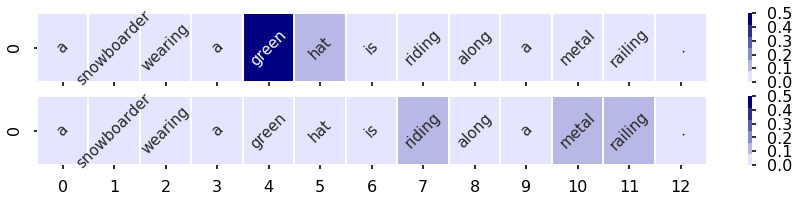

------------------------------
there is a girl outdoors .
15


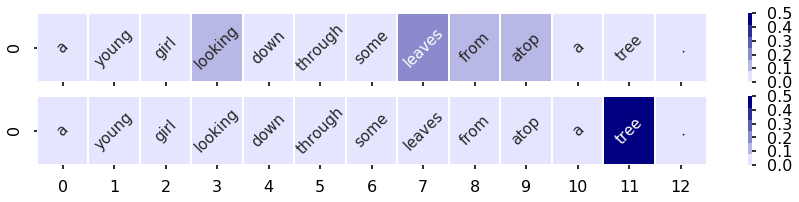

------------------------------
kids are splashing around in a fountain .
15


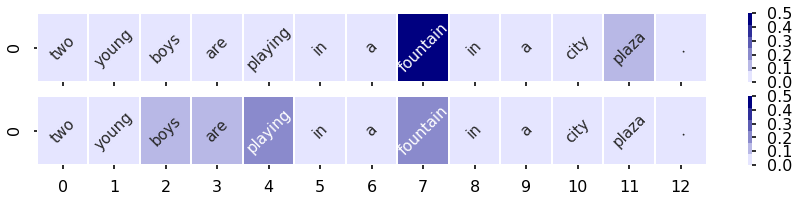

------------------------------
there is a person with a green backpack .
16


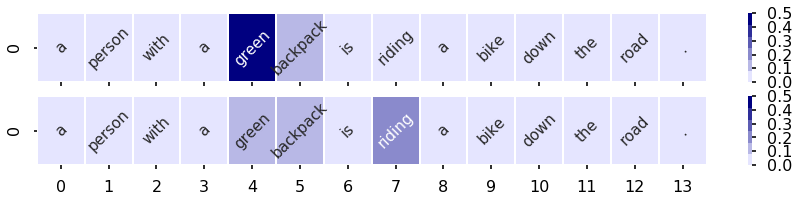

------------------------------
there is a crowd outside the restaurant .
16


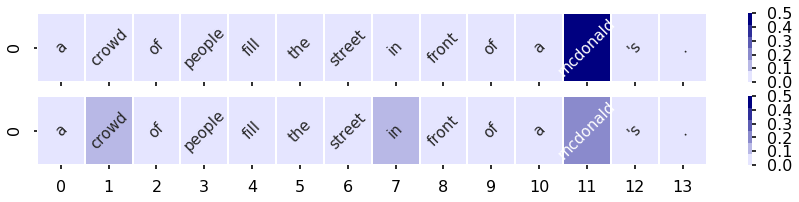

------------------------------
there is a large group .
16


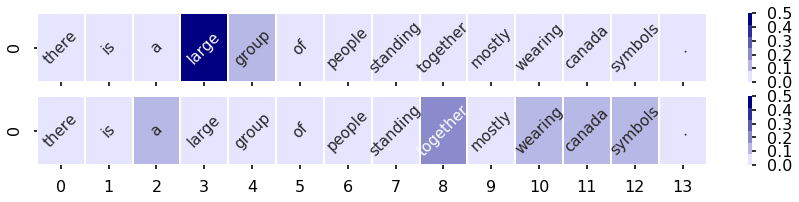

------------------------------
the country road has a walker wearing green .
16


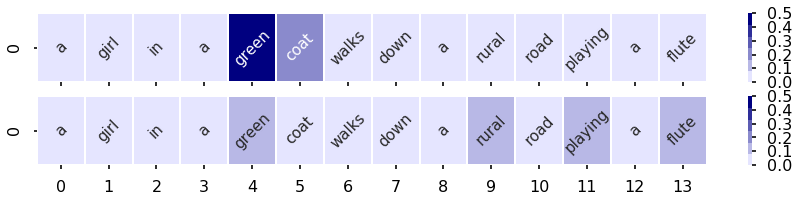

------------------------------
a young male in a white shirt .
16


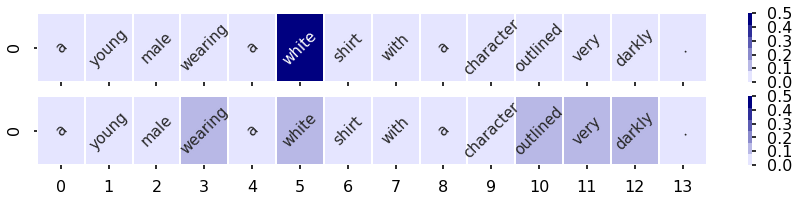

------------------------------
a person snowboarding in mid air
16


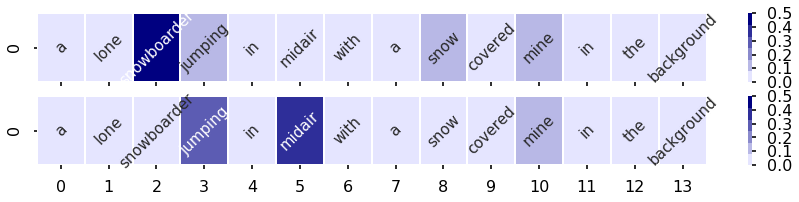

------------------------------
two women with cotton candy smile .
16


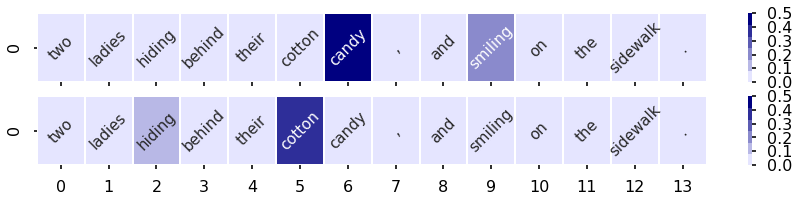

------------------------------
there are three boys
16


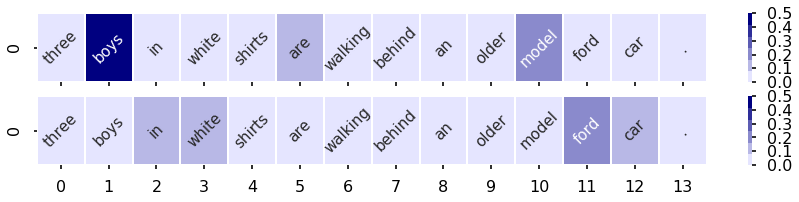

------------------------------
a woman in her vegetable market .
16


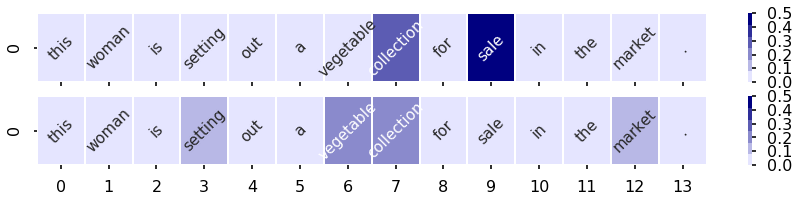

------------------------------
a boy riding a roller - coaster
16


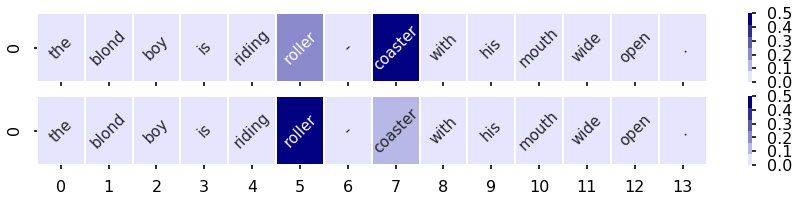

------------------------------
a football player is holding a ball .
16


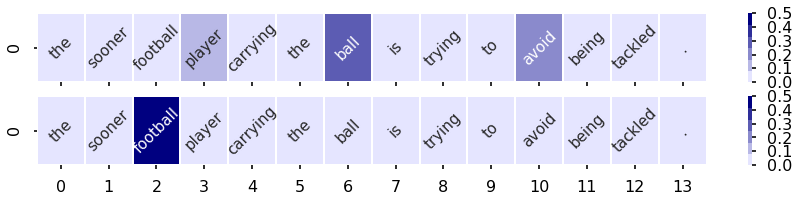

------------------------------
the roller coaster ride is filled with people .
16


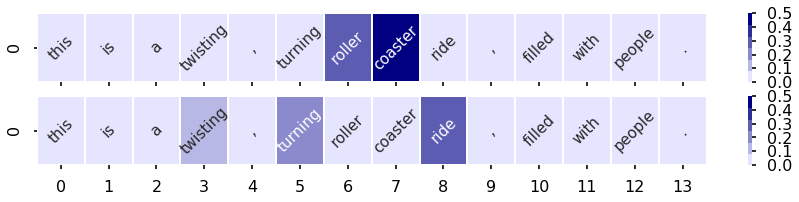

------------------------------
a person is outside
16


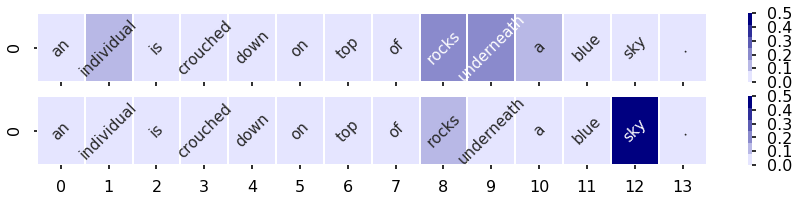

------------------------------
there are more females than males .
16


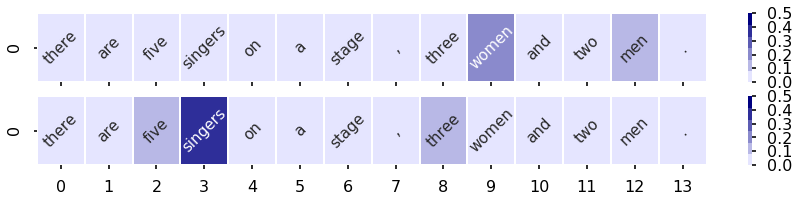

------------------------------
a man has black hair .
16


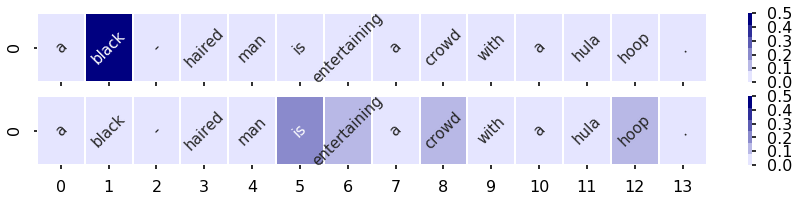

------------------------------
two individuals are walking outdoors .
16


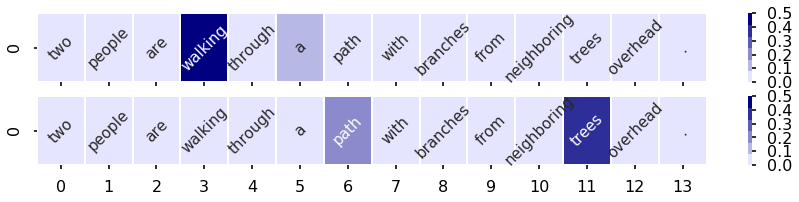

------------------------------
a man is riding a brown horse while protecting his head with a helmet .
16


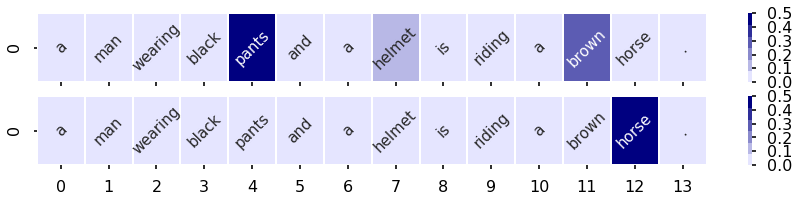

------------------------------
a person balancing .
16


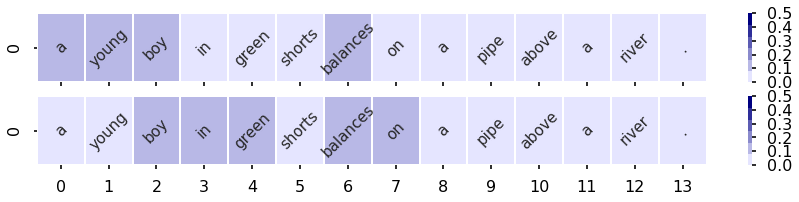

------------------------------
there are people wearing scrubs .
16


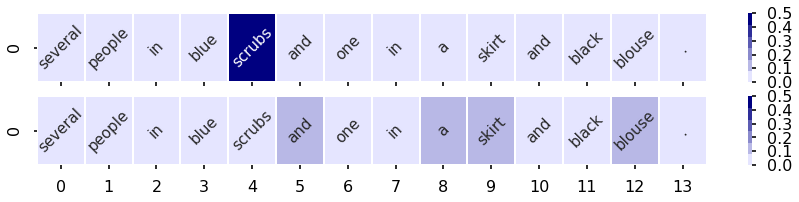

------------------------------
a camera is being lowered onto a running track by a girl in black pants
17


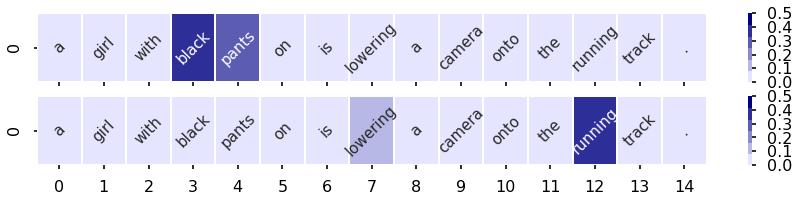

------------------------------
women are outside .
17


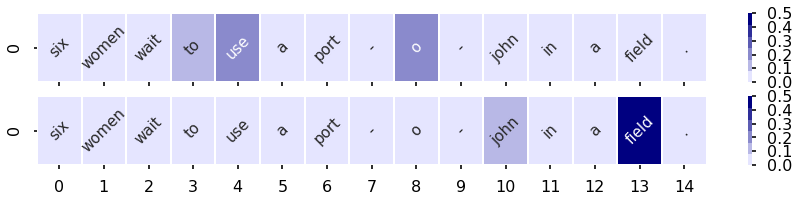

------------------------------
a man is raising his arm .
17


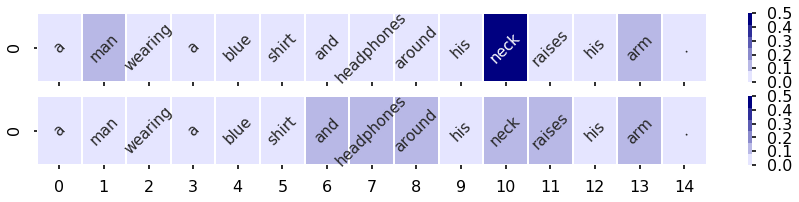

------------------------------
a man is in a black shirt
17


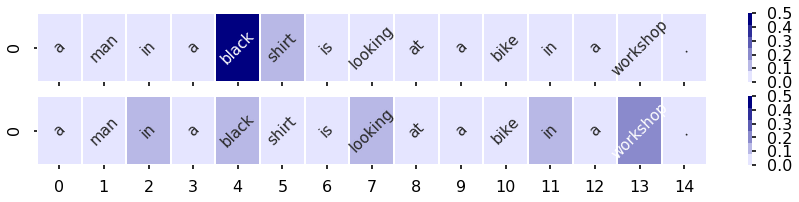

------------------------------
a lady wearing gray speaks to a lady in black .
17


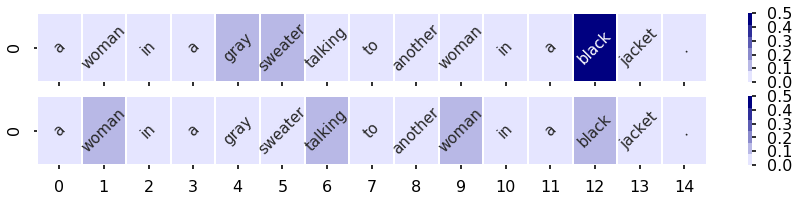

------------------------------
a women walking outdoors .
17


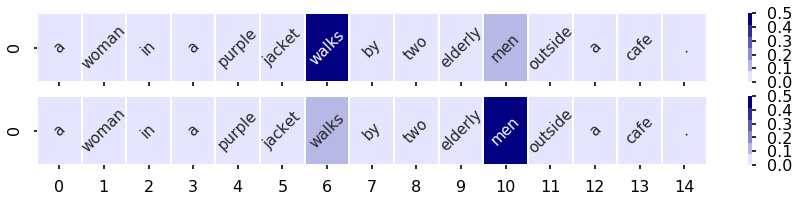

------------------------------
a man in a shirt juggles .
17


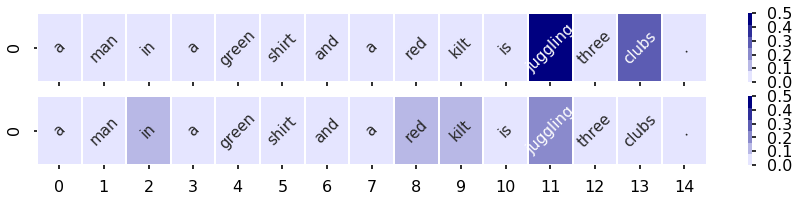

------------------------------
a man is wearing a white shirt .
17


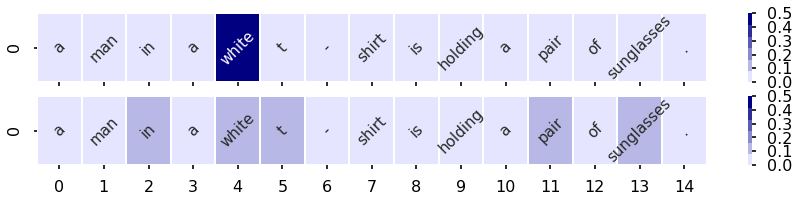

------------------------------
a group of people dance outdoors .
17


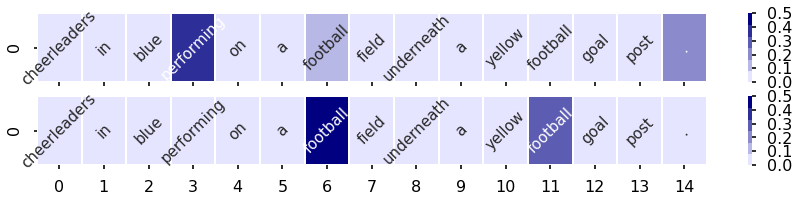

------------------------------
a woman with red hair .
17


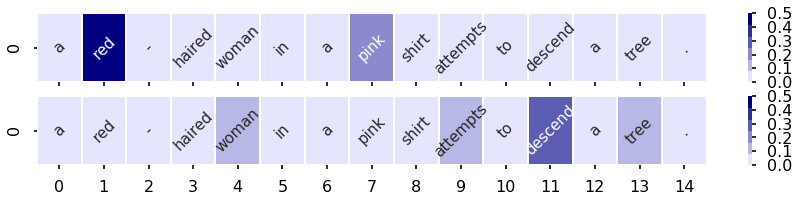

------------------------------
the woman is wearing dark clothing .
17


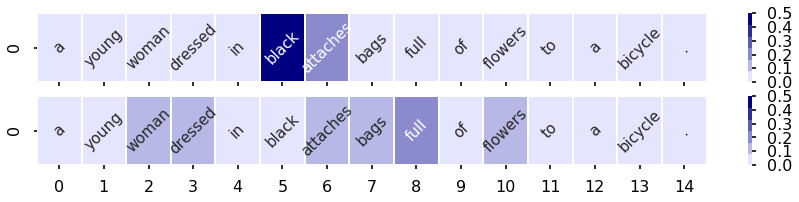

------------------------------
a man is jumping .
17


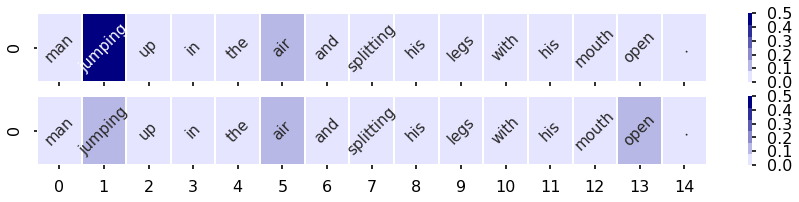

------------------------------
people are milling about the city street .
18


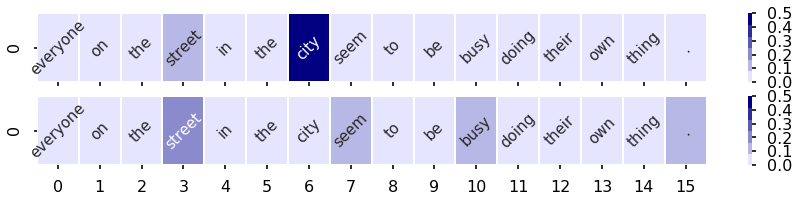

------------------------------
there are several people wearng red .
18


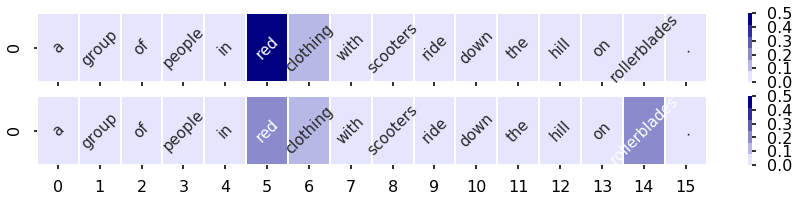

------------------------------
a person is wearing orange .
18


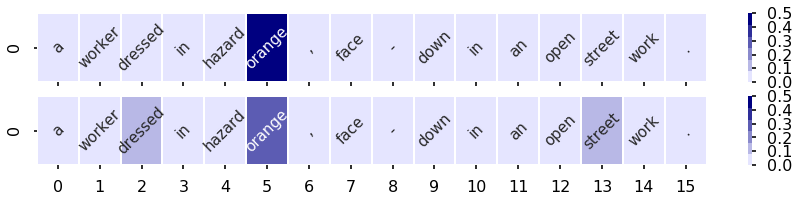

------------------------------
a person is situated near a mountain .
18


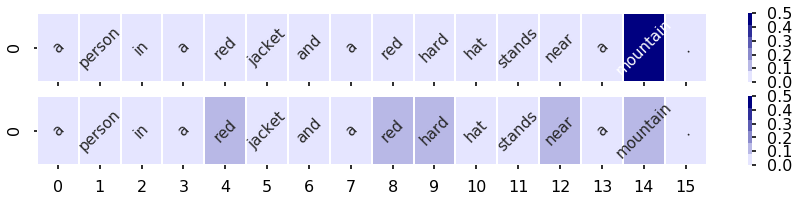

------------------------------
a young person in black next to an older person .
18


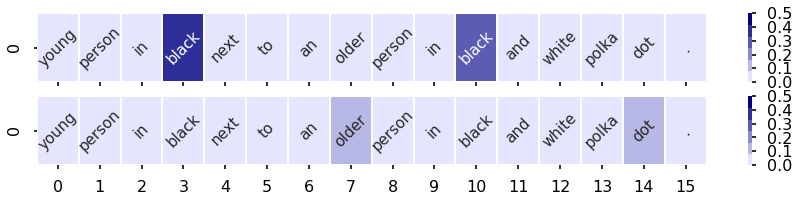

------------------------------
a kid climbing some logs
18


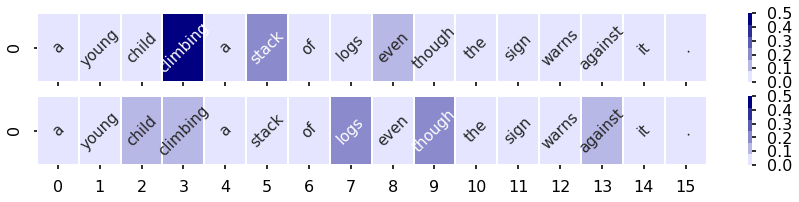

------------------------------
a group of adults and kids .
18


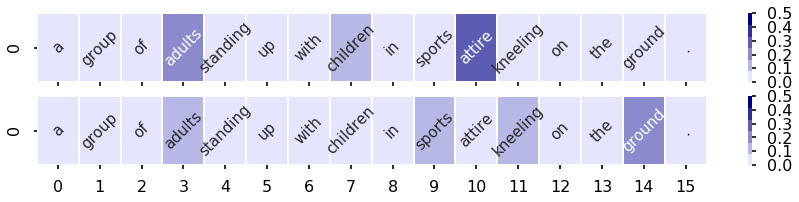

------------------------------
an extreme biker in mid - jump from underneath rider showing a blue sky .
18


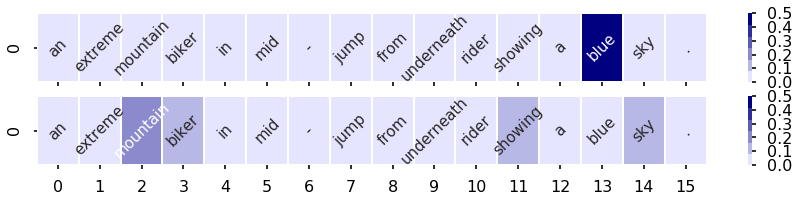

------------------------------
males are socializing with each other while wearing casual clothes .
18


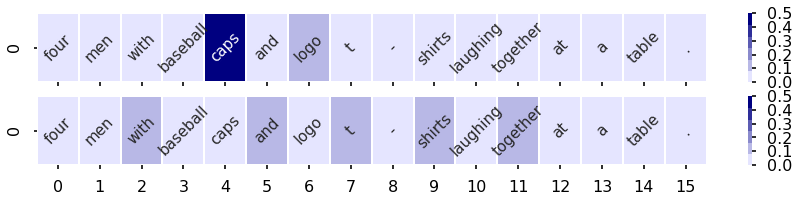

------------------------------
a costume is being worn by a performer .
18


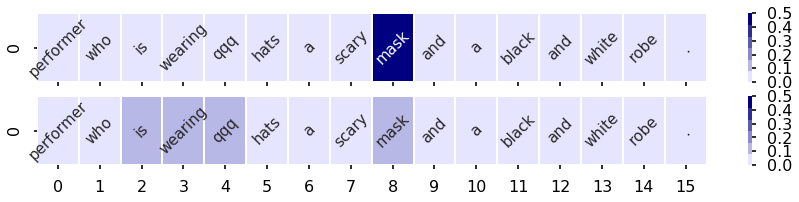

------------------------------
a person rides a snowboard .
18


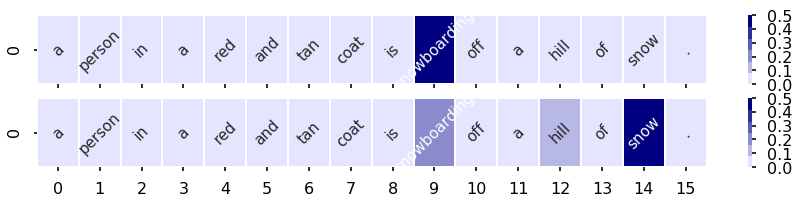

------------------------------
a canine is using his legs .
18


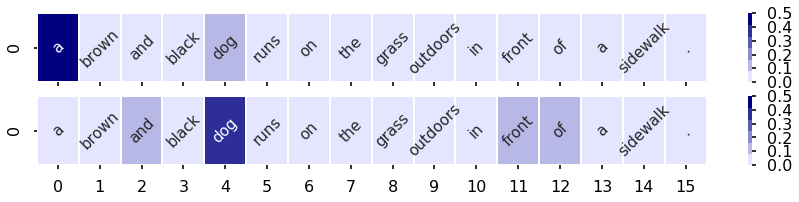

------------------------------
the man is wearing a jacket .
18


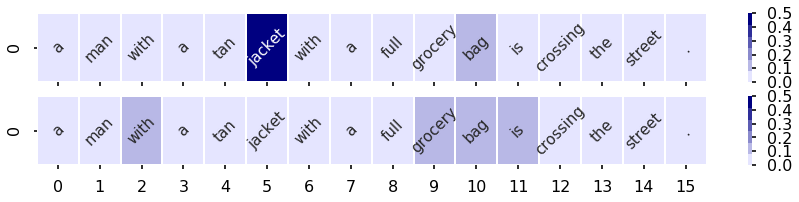

------------------------------
a woman is smiling .
19


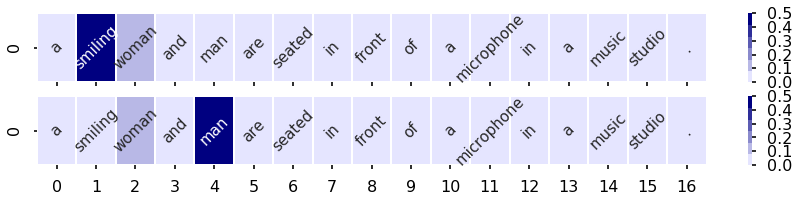

------------------------------
there is a furry animal in the grass .
19


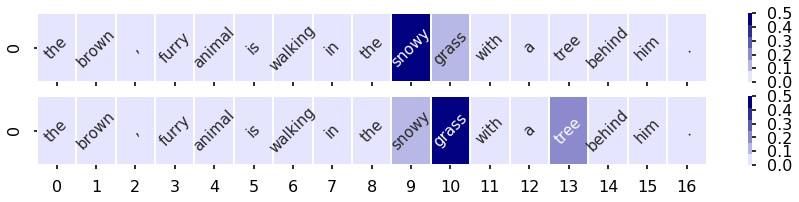

------------------------------
a child plays with two brooms outside
19


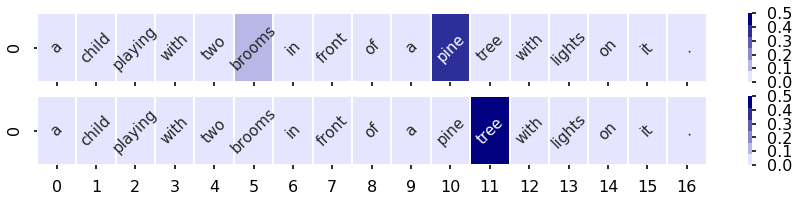

------------------------------
the guy has bottles on the truck
19


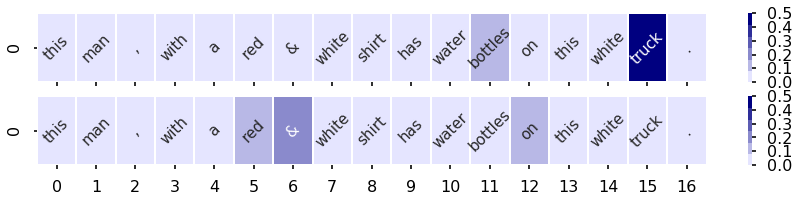

------------------------------
a man is wearing a mask
19


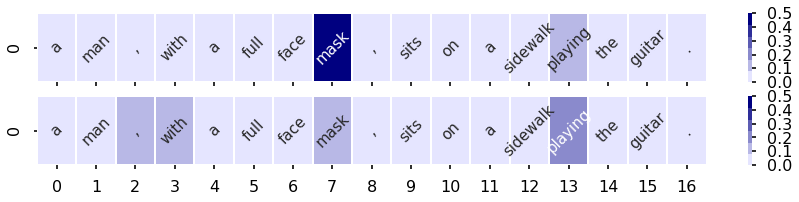

------------------------------
the men are playing music
19


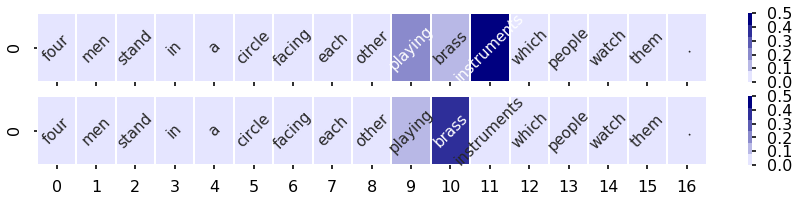

------------------------------
there are people playing music .
19


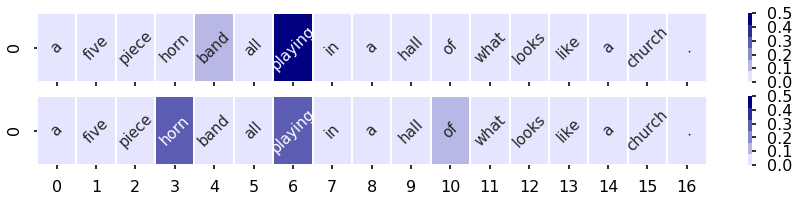

------------------------------
man has a shirt on
19


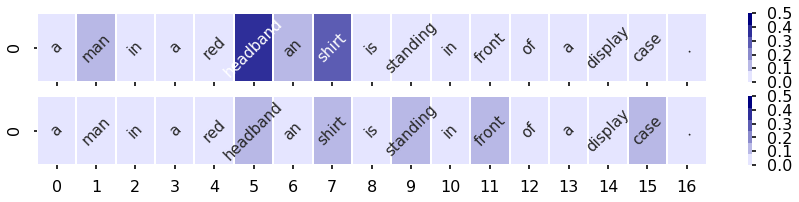

------------------------------
a snowboarder is dressed up .
19


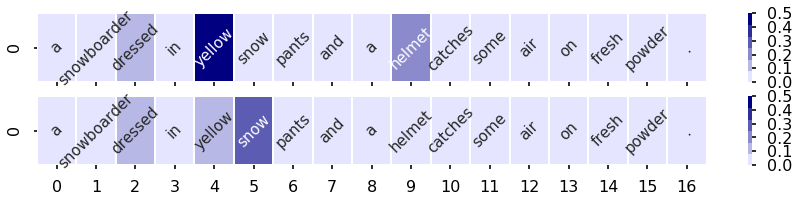

------------------------------
a child is in a baby carrier .
19


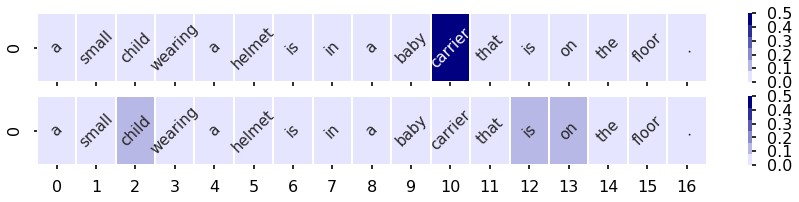

------------------------------
a man and woman ride a mule
19


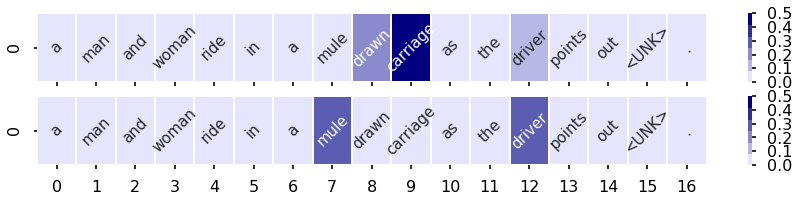

------------------------------
an emergency worker helps outdoors .
19


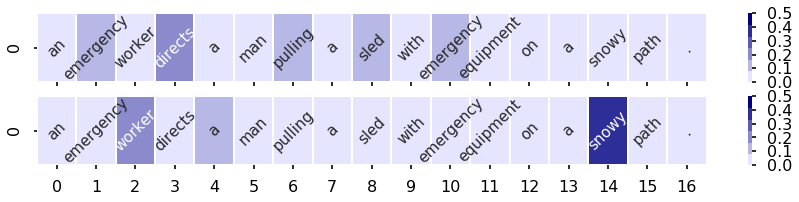

------------------------------
the man is outside .
20


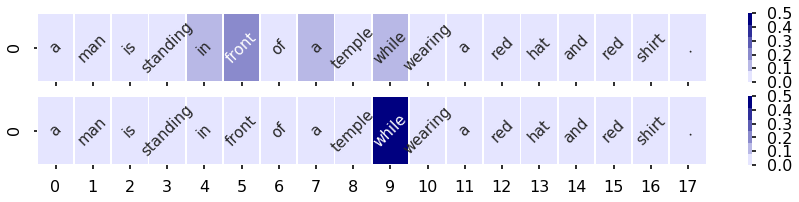

------------------------------
there is one child in this picture , and he is outside .
20


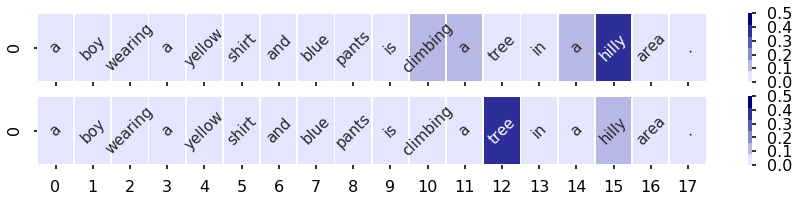

------------------------------
a person taking a photo .
20


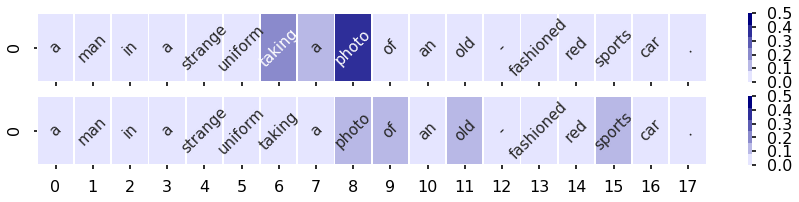

------------------------------
Cropping saved pngs
Done cropping
150


In [98]:
count = print_attention(output1,output2, output3, max=150, plot=True, output_filter=1, jsd_thresh=0.21)
print(count)

a basket weaver teaching a class at the fair .
8


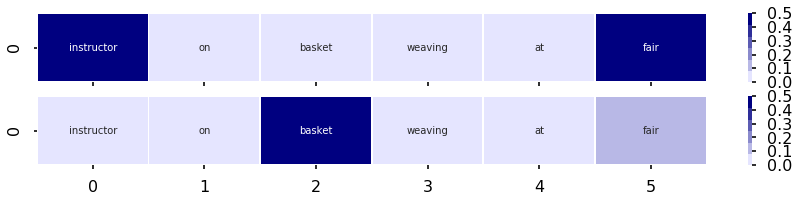

------------------------------
this is the first time the dog has seen snow .
8


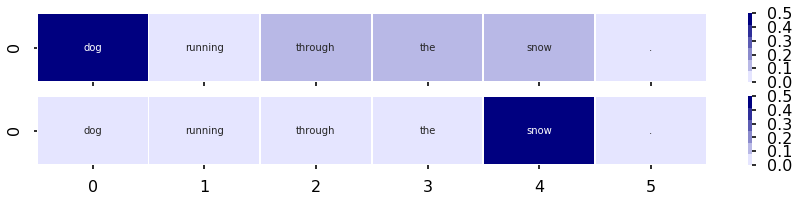

------------------------------
the man 's beard is quite long .
9


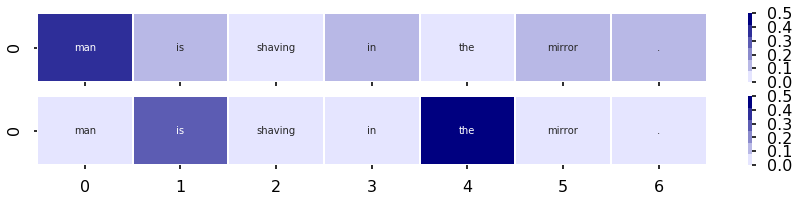

------------------------------
the woman is tall .
9


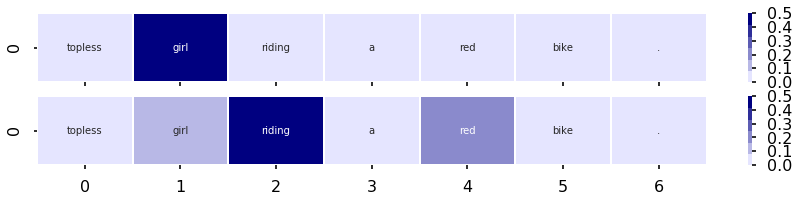

------------------------------
the children are having fun together .
9


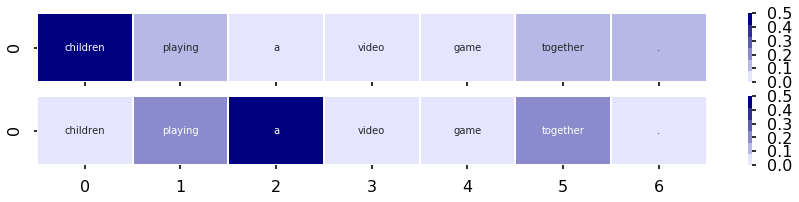

------------------------------
the men are construction workers .
10


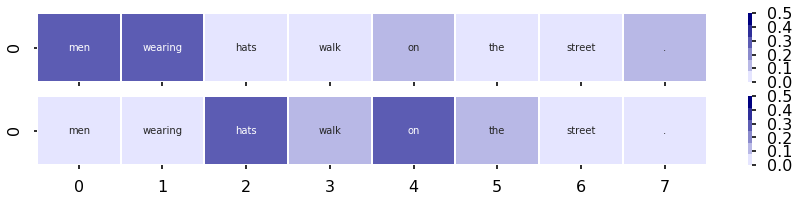

------------------------------
the women are performing a play .
10


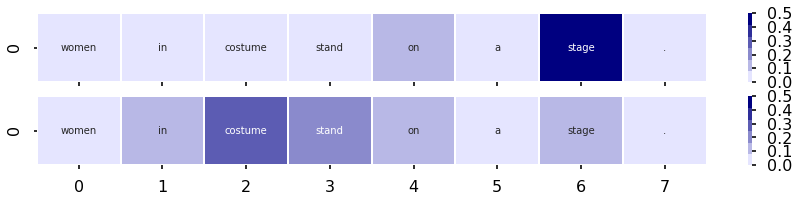

------------------------------
a man is enjoying his favorite route .
10


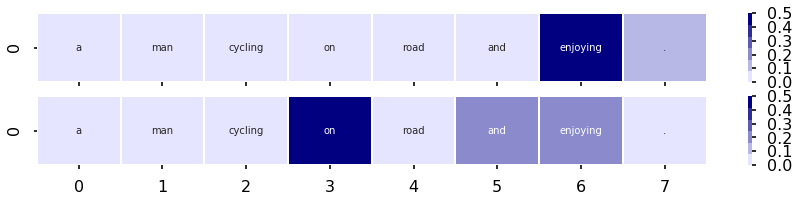

------------------------------
two instructors are teaching a small class of five how to fly a helicopter .
10


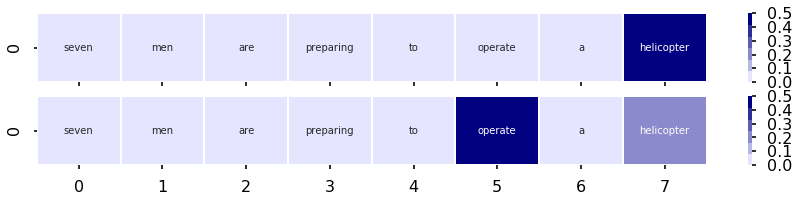

------------------------------
someone told a joke .
10


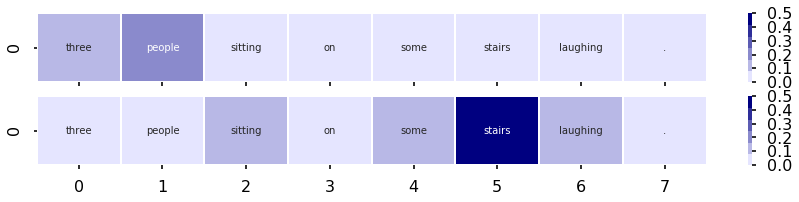

------------------------------
the restaurant is about to close .
10


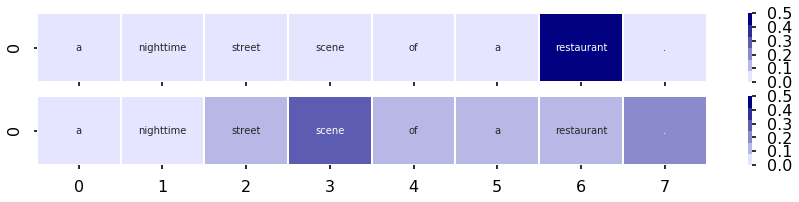

------------------------------
gymnasts get ready for the biggest competition of their life .
10


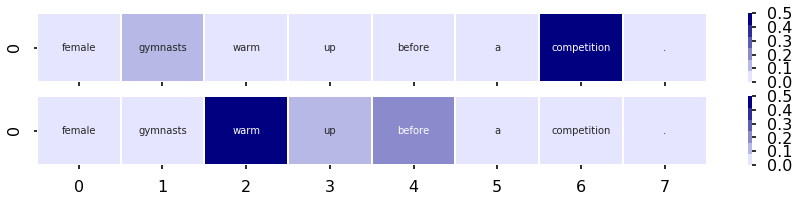

------------------------------
the kids are being punished .
10


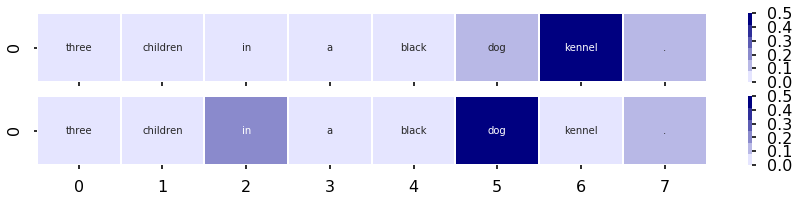

------------------------------
three men are laughing at a joke
10


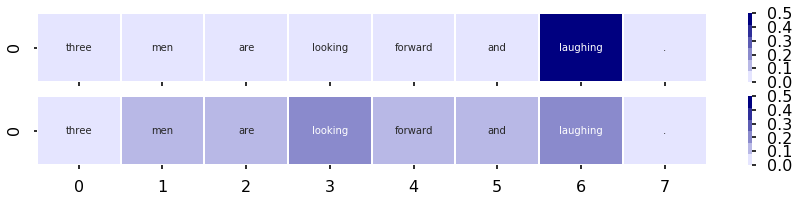

------------------------------
a man and woman are laughing at a joke .
10


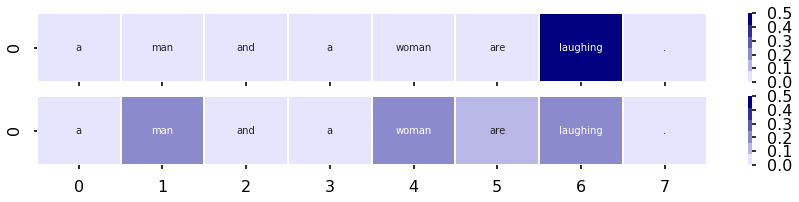

------------------------------
the man almost slipped earlier .
10


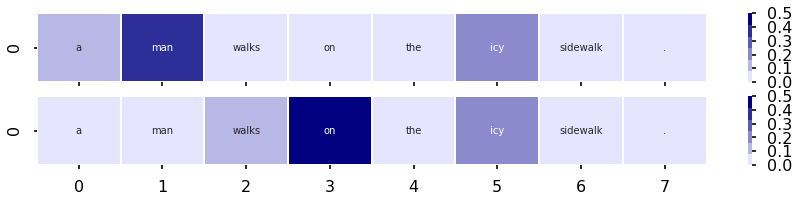

------------------------------
a person enjoying the waters
10


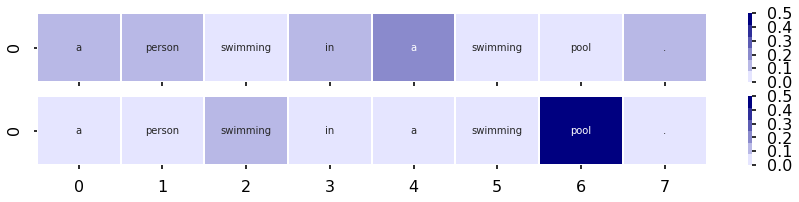

------------------------------
some of the lights are yellow .
11


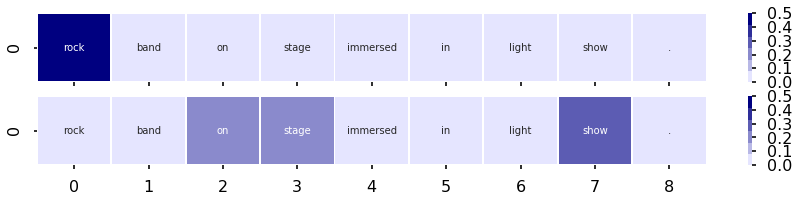

------------------------------
the man is a barber
11


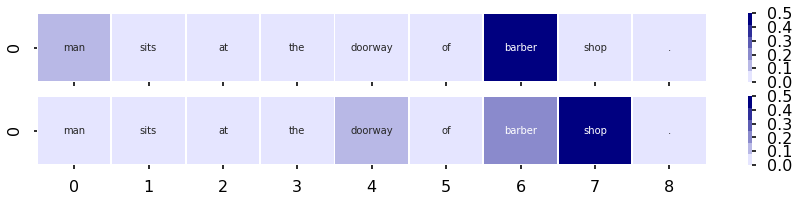

------------------------------
a man races on a four wheeler in a charity event .
11


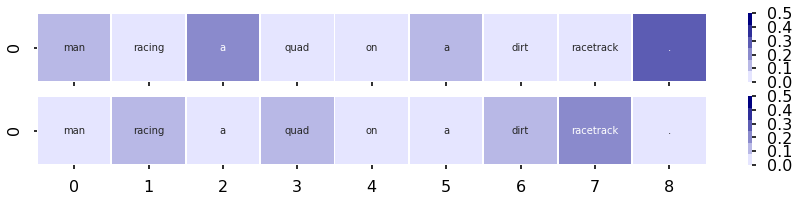

------------------------------
boyfriend and girlfriend hugging each other .
11


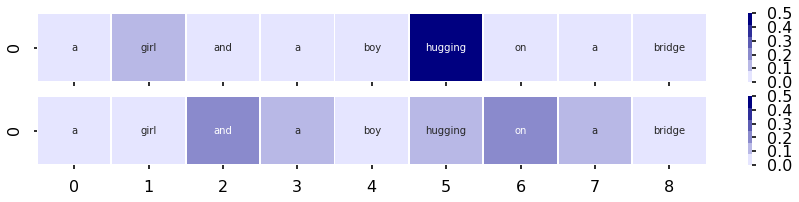

------------------------------
the two men are friends
11


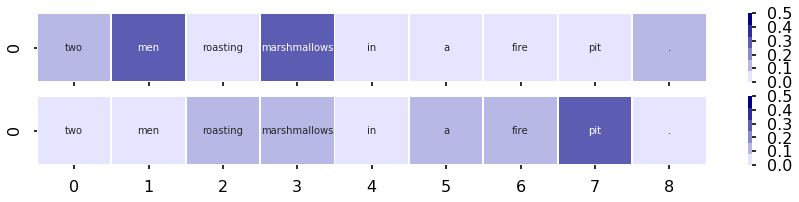

------------------------------
three children are shooting a deer .
11


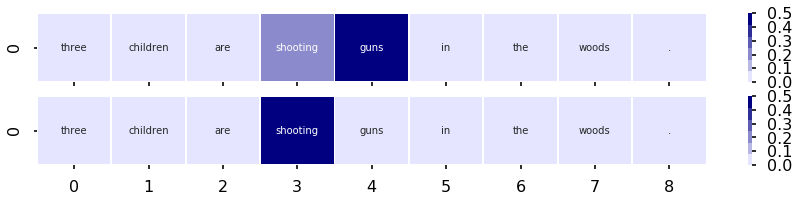

------------------------------
there are people sitting on benches outdoors talking to each other .
11


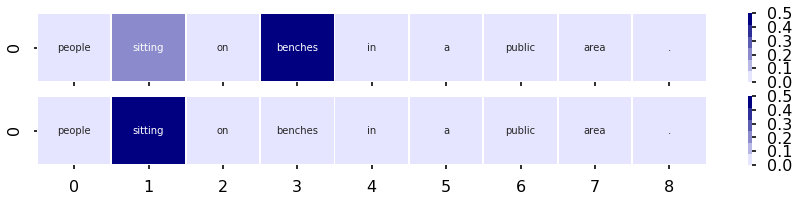

------------------------------
the man is wearing glasses .
11


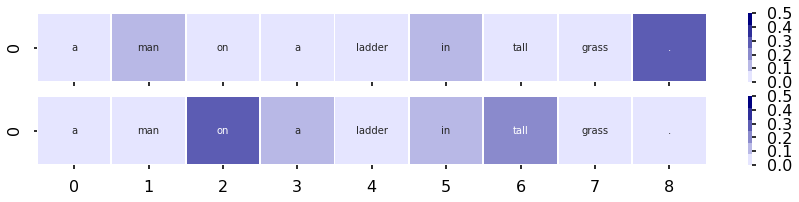

------------------------------
an qqq year old man has an orange shirt .
12


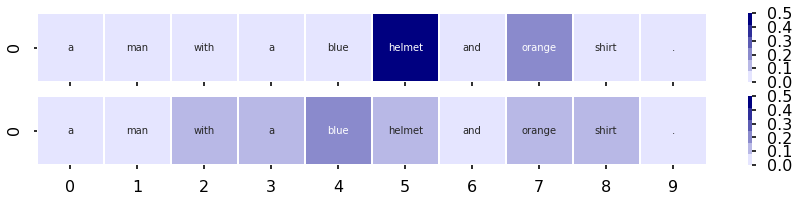

------------------------------
teammates are competing in a softballs championship .
12


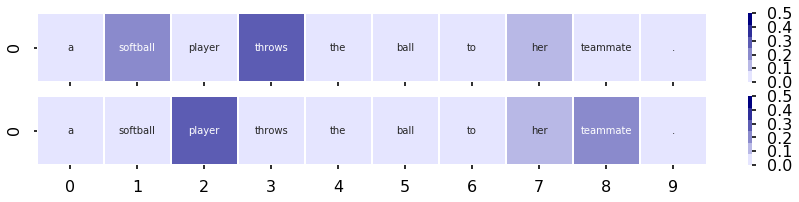

------------------------------
the tiles are very colorful .
12


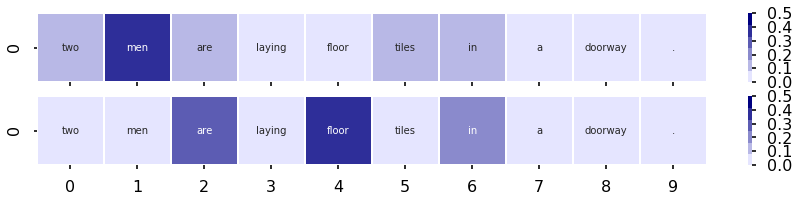

------------------------------
the couple is married .
12


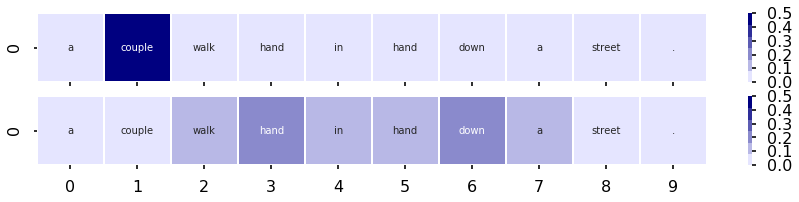

------------------------------
the boy is going to school .
12


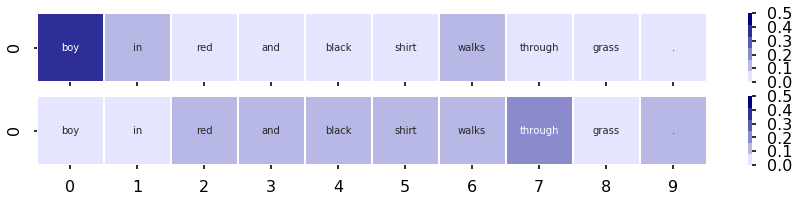

------------------------------
he is wearing sunscreen .
12


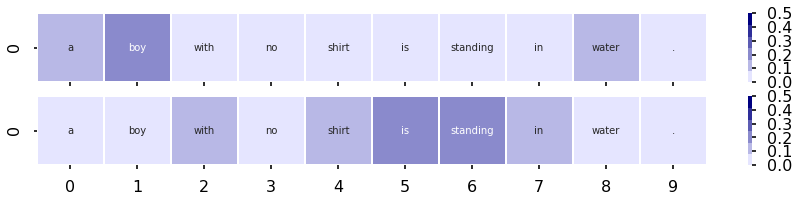

------------------------------
the governor prepared to deliver the speech that would deliver the votes .
12


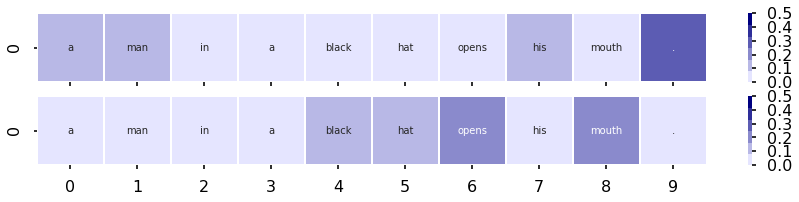

------------------------------
there is a photo of mt everest .
12


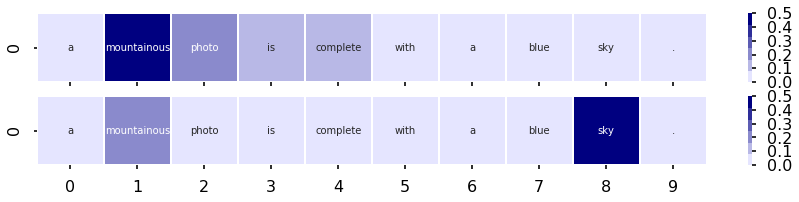

------------------------------
a king sits behind some drums .
12


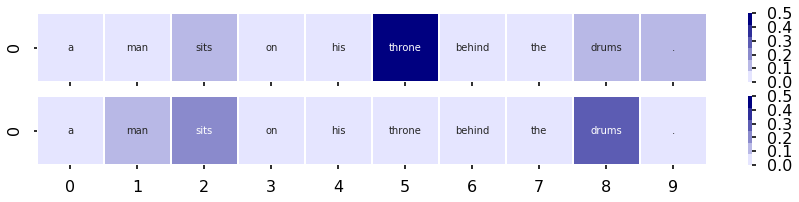

------------------------------
the male rollerblader is skillfully riding the stair railing .
12


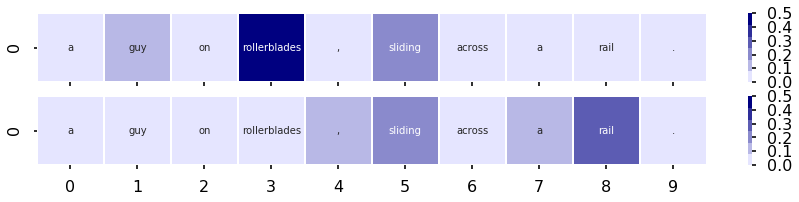

------------------------------
the woman is laughing at a joke .
12


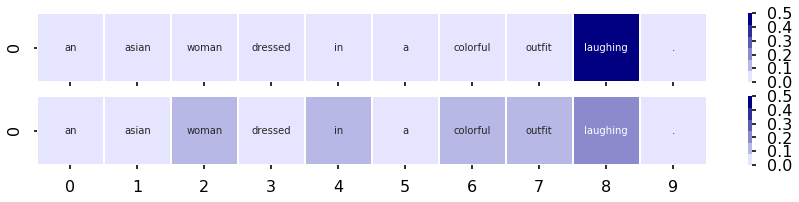

------------------------------
the hikers have backpacks .
12


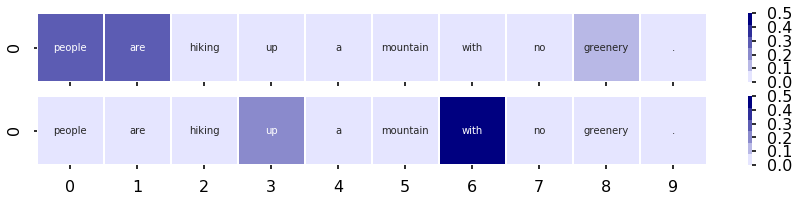

------------------------------
a man with glasses is looking at drinking glasses .
13


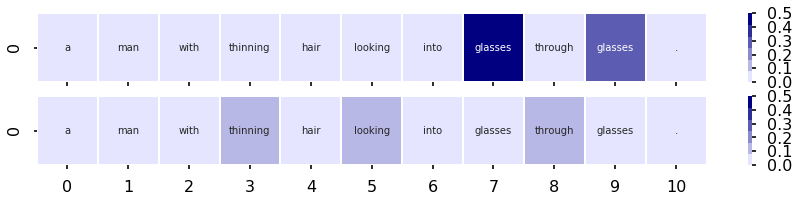

------------------------------
he is playing guitar for the crowd .
13


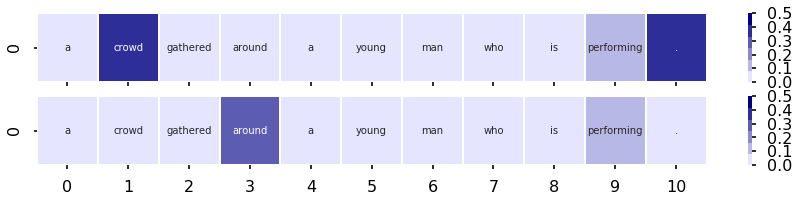

------------------------------
a group of men are discussing business .
13


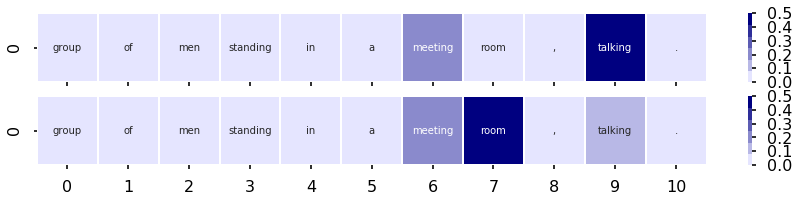

------------------------------
the restaurant is crowded
13


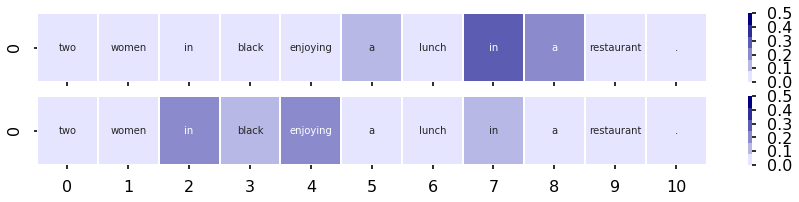

------------------------------
a father and child playing together .
13


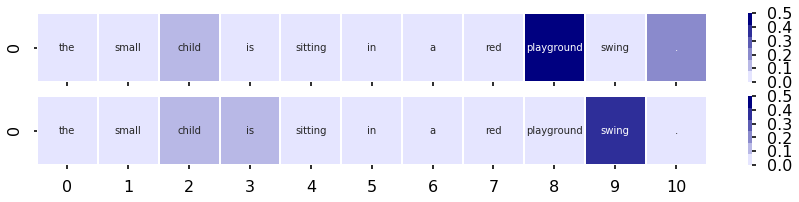

------------------------------
the boy is happy
13


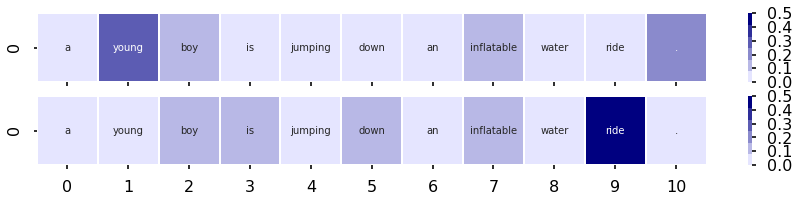

------------------------------
the white dog is with it 's owner .
13


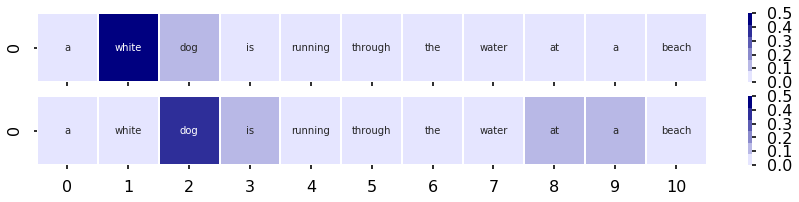

------------------------------
the couple are shopping for deals .
13


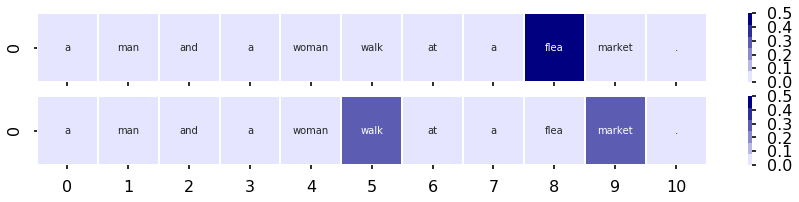

------------------------------
the curb is dangerous .
13


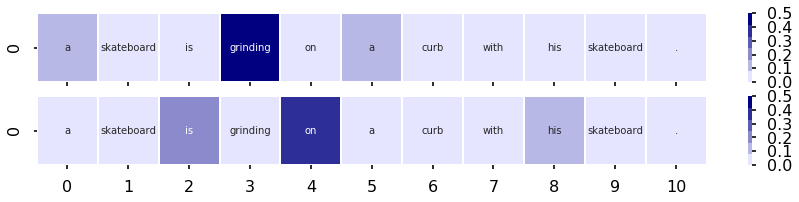

------------------------------
a group of people in green vests purchase food for lunch .
14


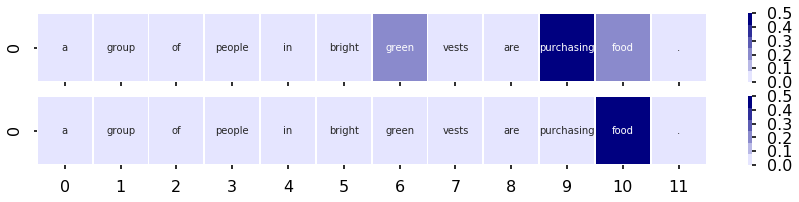

------------------------------
both dogs are female .
14


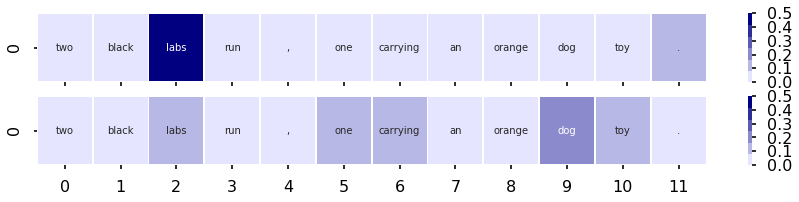

------------------------------
a woman has heard a joke .
14


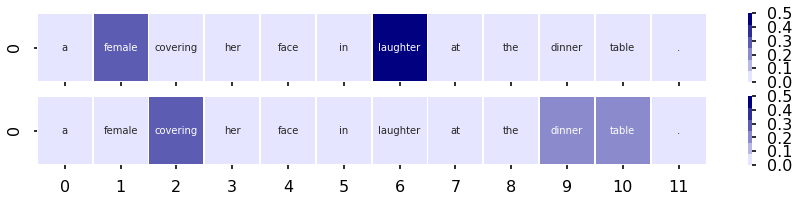

------------------------------
two bears are facing each other in the woods with their mouths open .
14


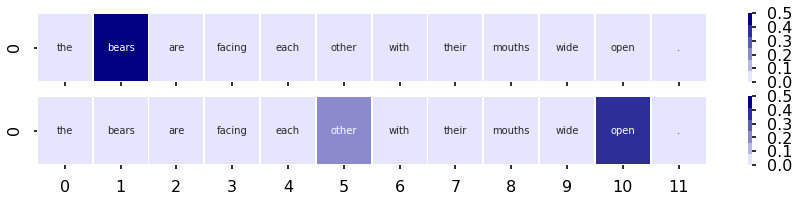

------------------------------
a group of children are relaxing in front of a large red building .
14


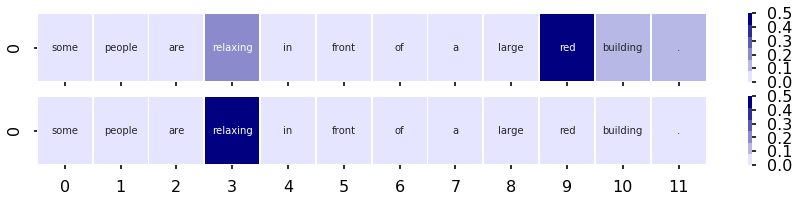

------------------------------
the windsurfer is having fun .
14


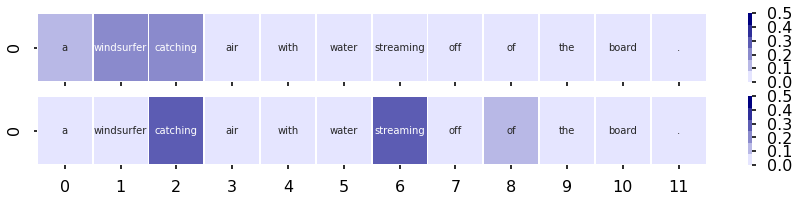

------------------------------
the young boy is hispanic .
14


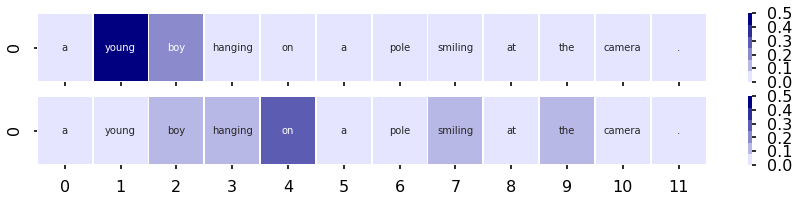

------------------------------
the men and woman are splashing each other in the fountain .
14


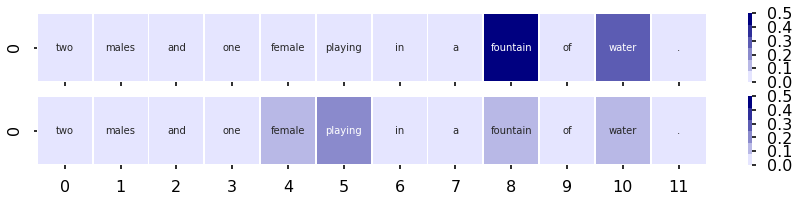

------------------------------
a man is trying his best at the national championship of baton .
14


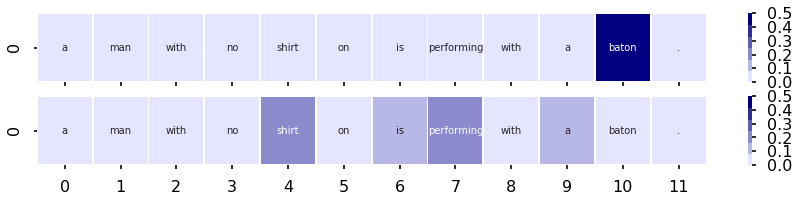

------------------------------
the men are partners
14


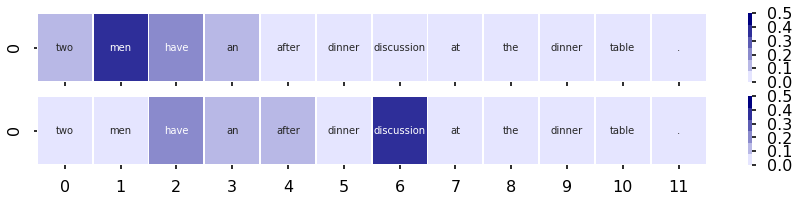

------------------------------
a man is traveling to see his best friend .
15


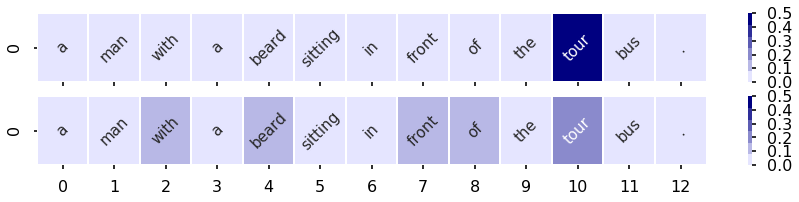

------------------------------
the woman is naturally blonde .
15


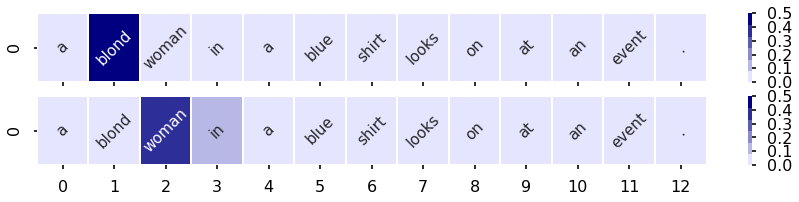

------------------------------
the man may lose his balance .
15


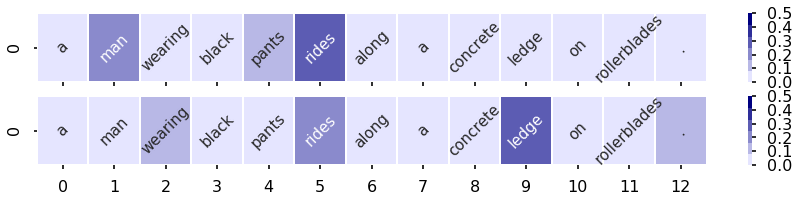

------------------------------
a black dog wearing a blue collar is chasing something into the water .
15


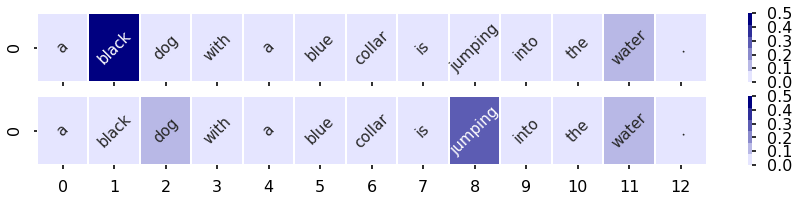

------------------------------
the woman is at a party
15


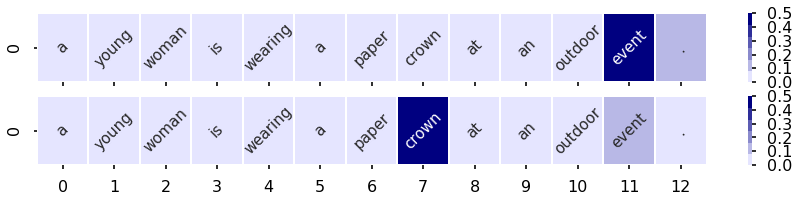

------------------------------
the woman is in the ocean .
15


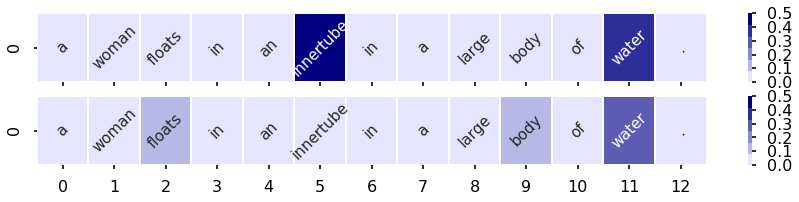

------------------------------
the girl is playing a game at recess .
15


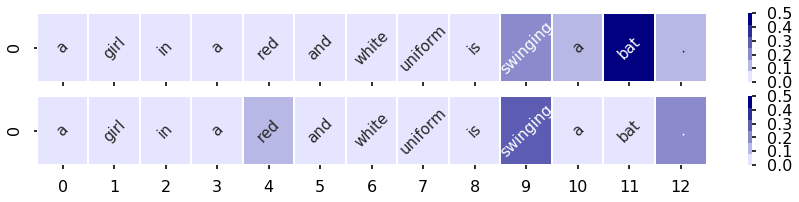

------------------------------
the person is competing in a snowboarding competition .
15


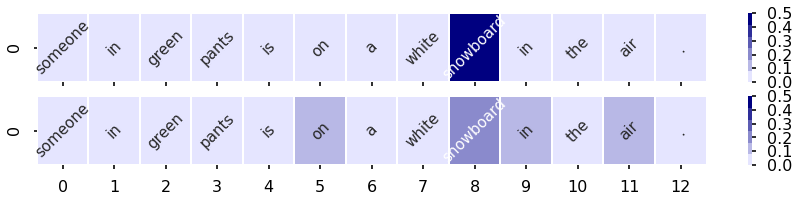

------------------------------
a snowboarder in a green hat rides along a metal railing in a competition .
15


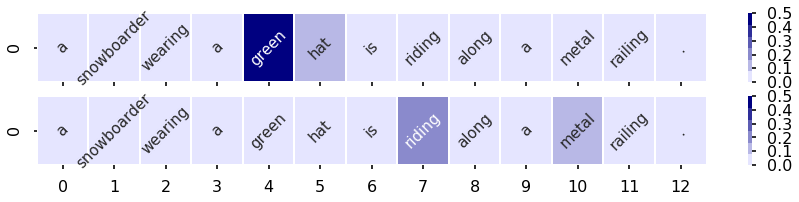

------------------------------
the children are playing a bedtime game with their parents .
15


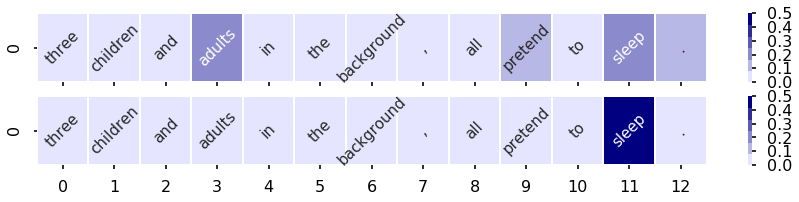

------------------------------
a man hiding his true identity .
16


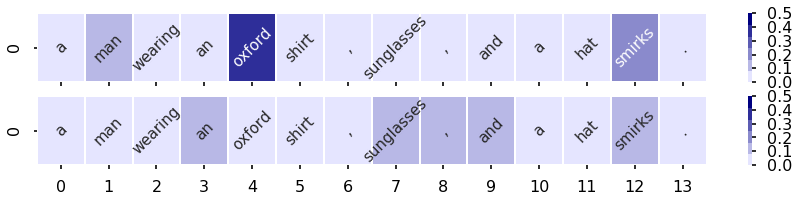

------------------------------
a couple are preparing to be intimate .
16


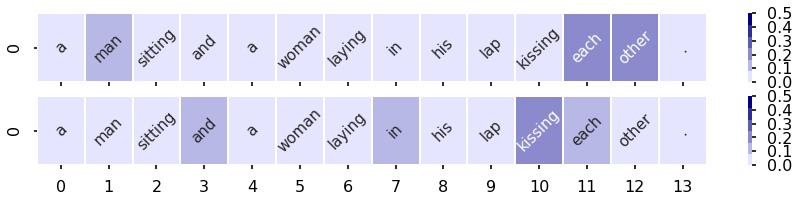

------------------------------
the people are hungry .
16


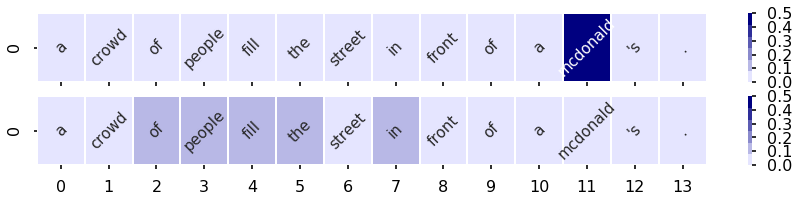

------------------------------
one of the men is a goalie .
16


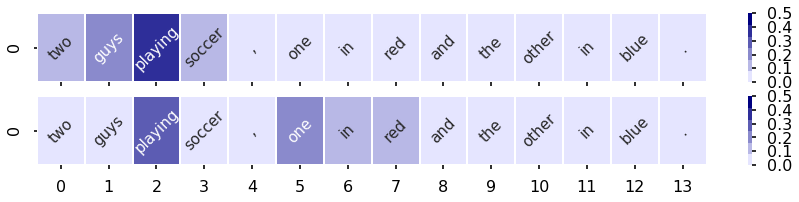

------------------------------
two friends holding cotton candy smile at each other .
16


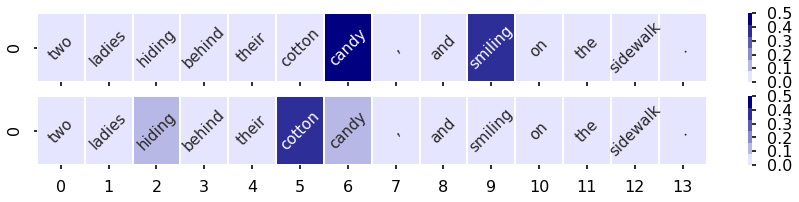

------------------------------
a black lab waits for its owner to throw a ball into the water .
16


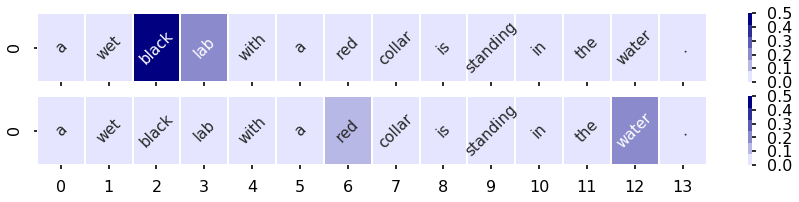

------------------------------
a man is about to perform a song .
16


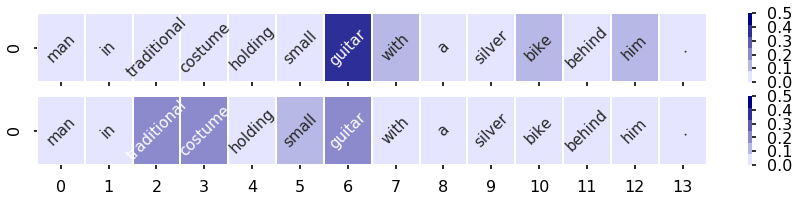

------------------------------
the lady on the table is cutting here sandwich is on her cellphone
16


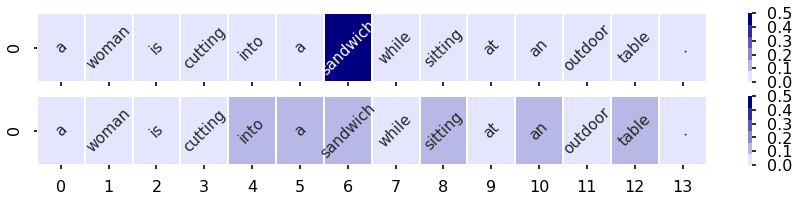

------------------------------
professional actors are doing summer stock .
16


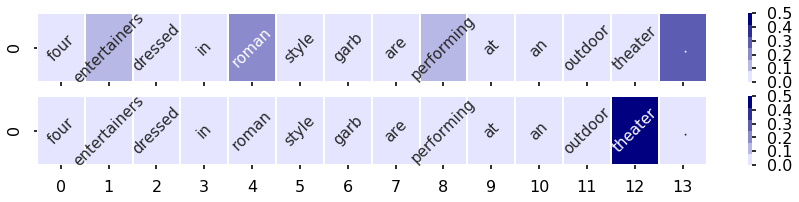

------------------------------
a gymnast is completing her jump in the finals .
16


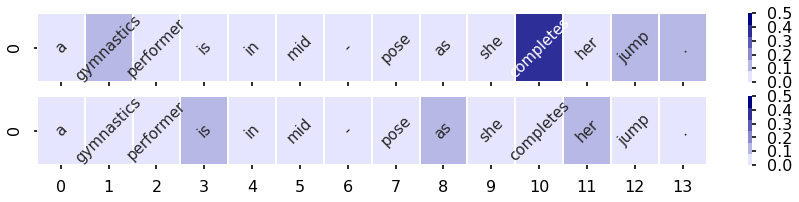

------------------------------
a dog returns a toy to its owner .
17


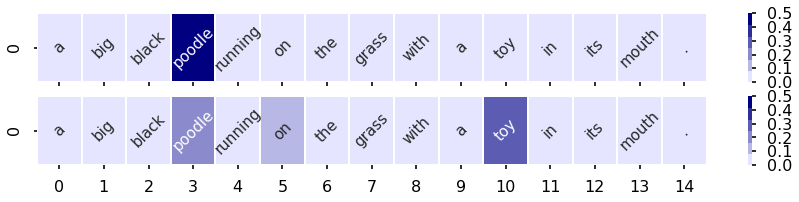

------------------------------
the man is wearing knee pads .
17


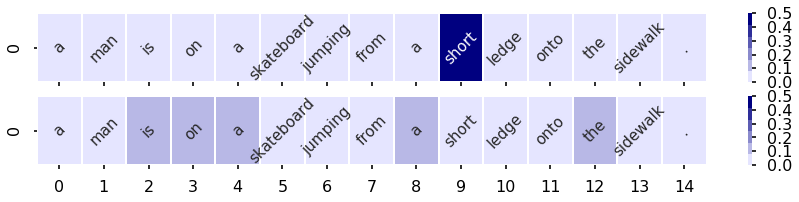

------------------------------
a man prepares to show off his knife - wielding skills
17


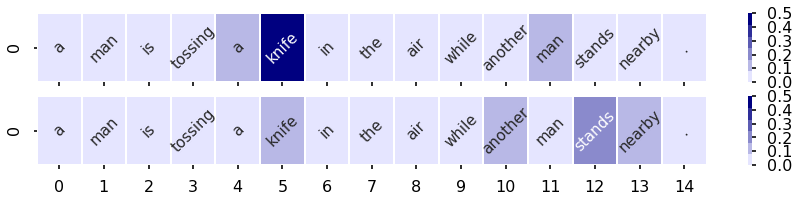

------------------------------
he was happy .
17


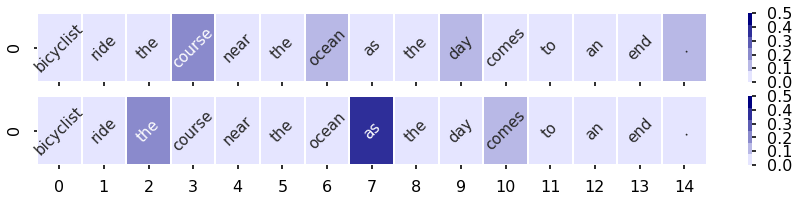

------------------------------
the young woman is wearing a helmet .
17


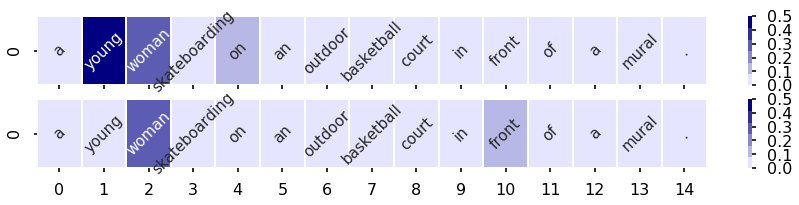

------------------------------
the man is clearing his driveway .
17


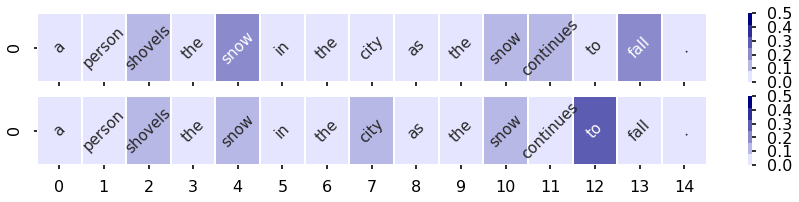

------------------------------
a long jumper 's glasses fall off .
18


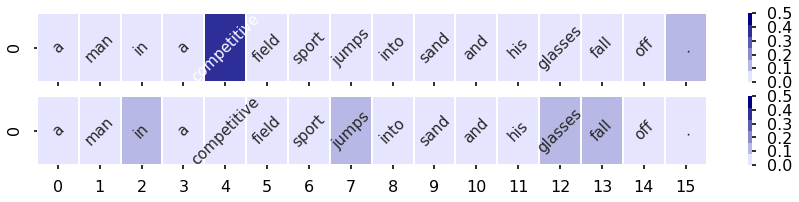

------------------------------
the girl in a blue dress is a flower girl at a wedding .
18


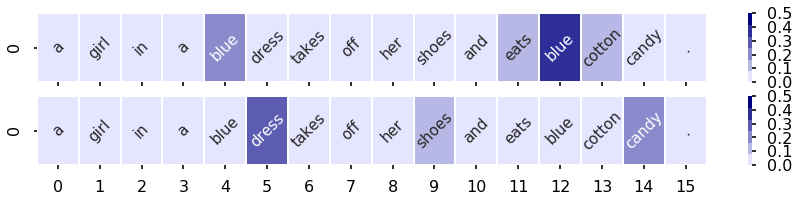

------------------------------
the girl is eating blue cotton candy at a carnival .
18


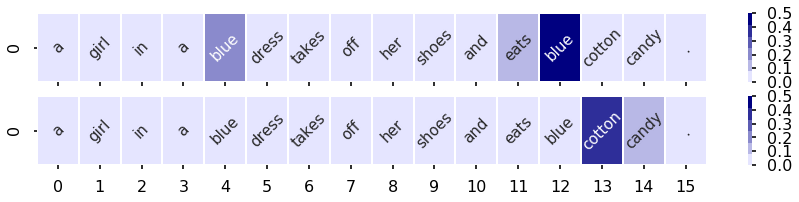

------------------------------
the two people are romantically involved .
18


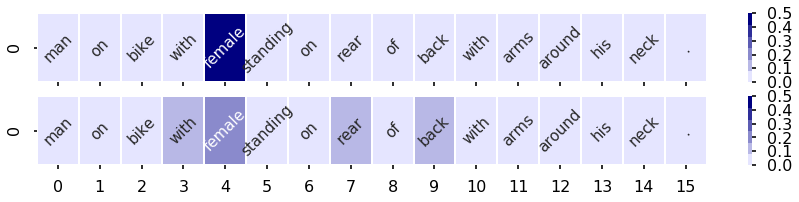

------------------------------
the couple are hispanic .
18


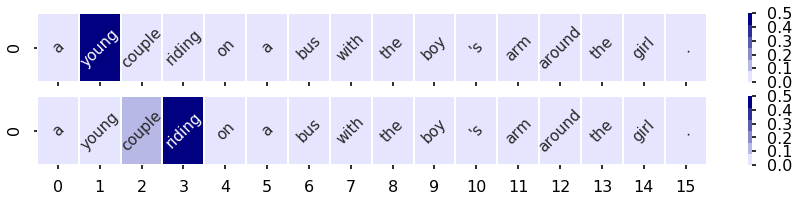

------------------------------
a mother and her child are playing in the snow .
18


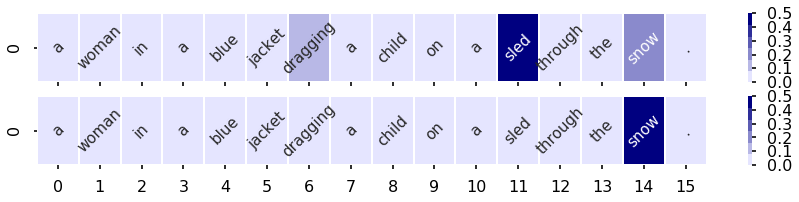

------------------------------
a man practices for the qqq party .
18


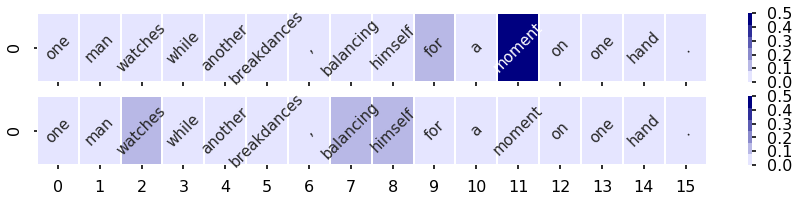

------------------------------
a person is performing a trick at the circus .
18


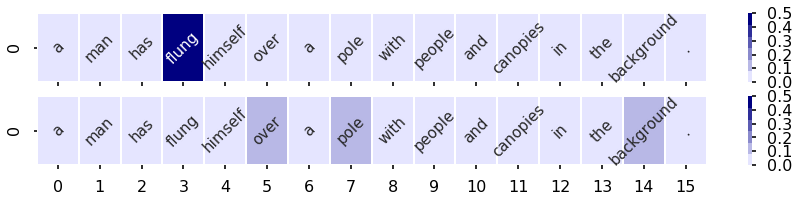

------------------------------
a girl in a red coat makes a snow angel for the first time .
19


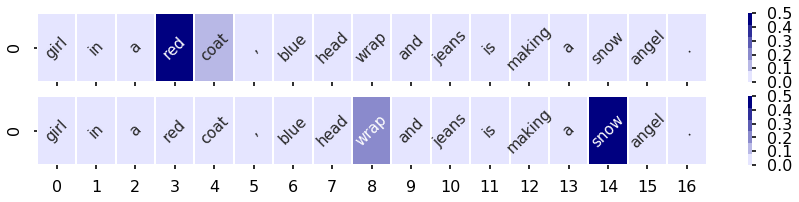

------------------------------
the people are friends .
19


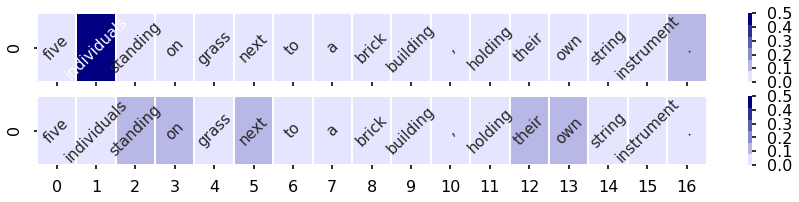

------------------------------
the woman is happy .
19


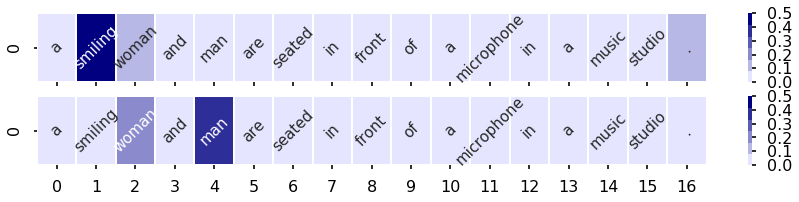

------------------------------
the guy has bottles on the truck for me
19


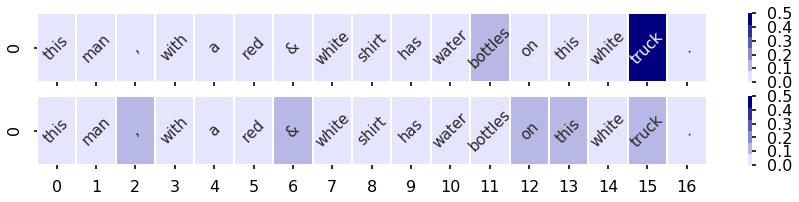

------------------------------
the person is in a race .
19


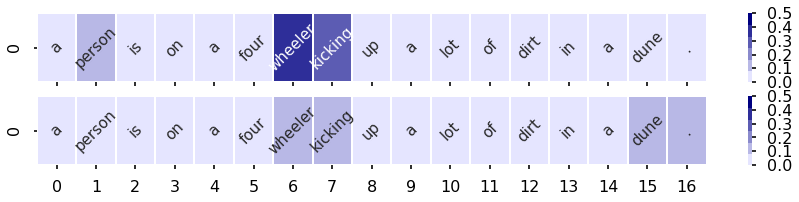

------------------------------
kids eating cupcakes that their mom gave them .
19


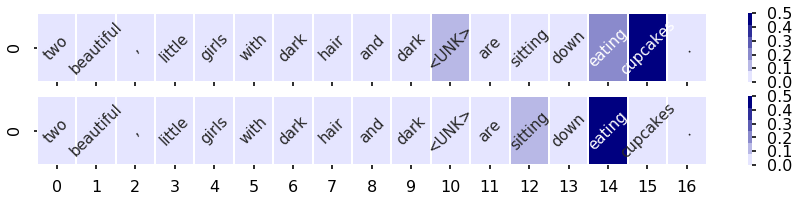

------------------------------
the woman is a super model .
19


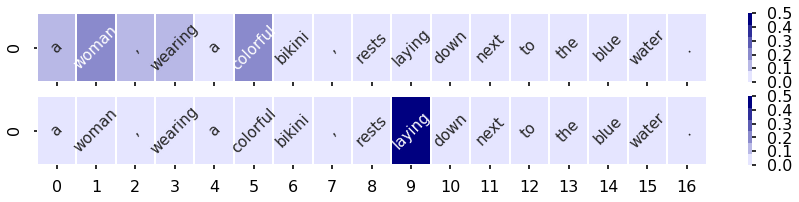

------------------------------
the guy is on the bench waiting for his wife
19


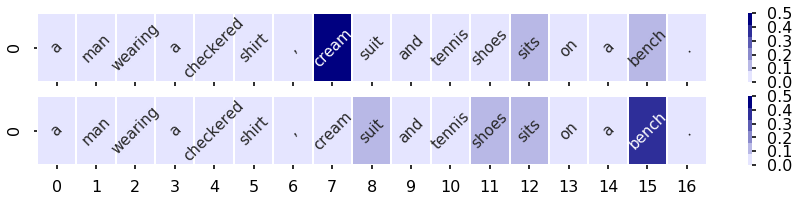

------------------------------
a drummer practicing for a concert .
19


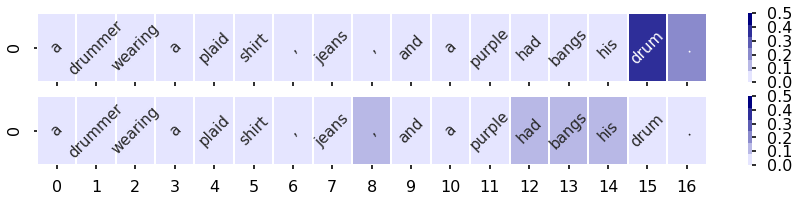

------------------------------
the police are controlling an unruly crowd .
20


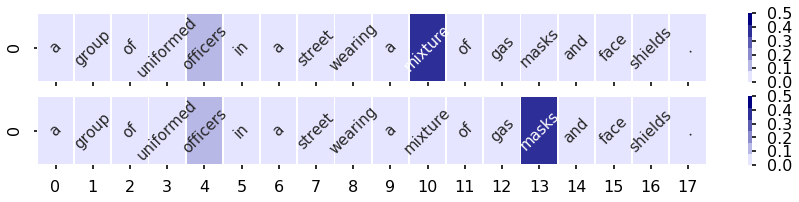

------------------------------
a tall person with glasses
20


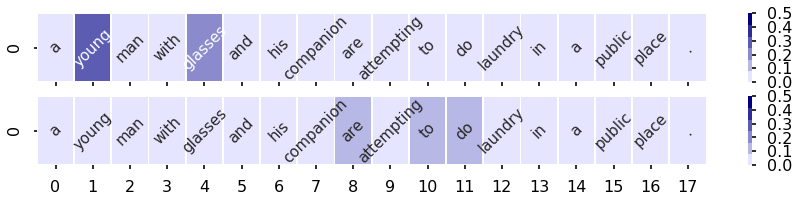

------------------------------
some children are playing soccer by a school .
20


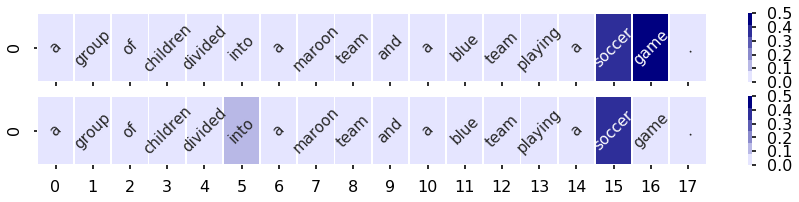

------------------------------
he is chinese .
20


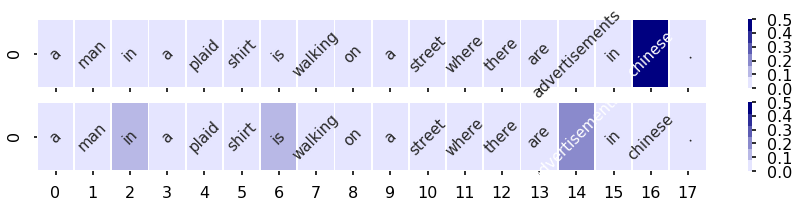

------------------------------
the men are brothers .
20


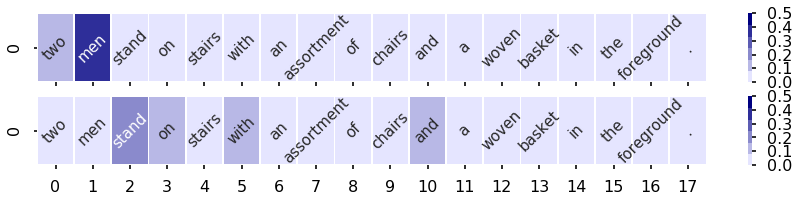

------------------------------
the boy is qqq
20


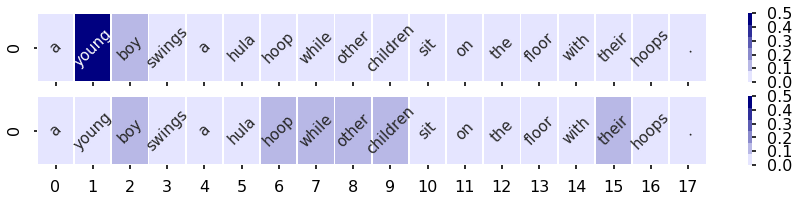

------------------------------
the kids are playing soccer in the field with their dog .
21


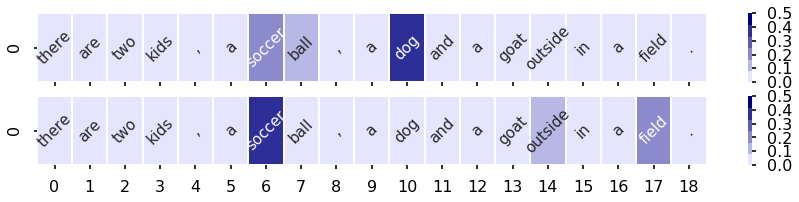

------------------------------
a girl might fall off a tree .
21


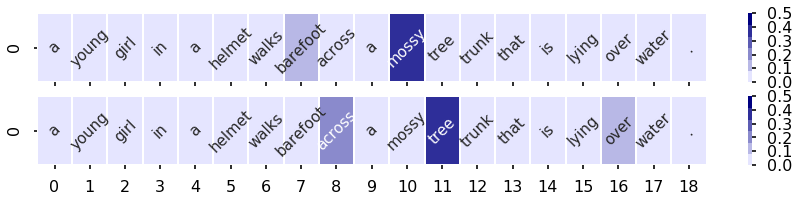

------------------------------
the young child is working on his science project .
21


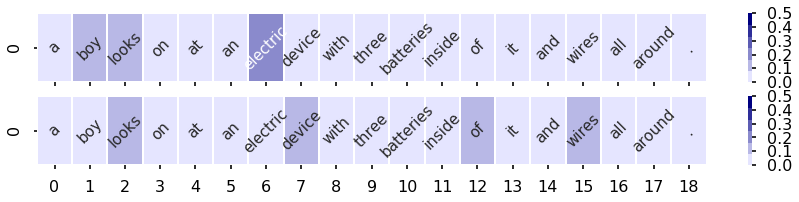

------------------------------
the couple is married .
21


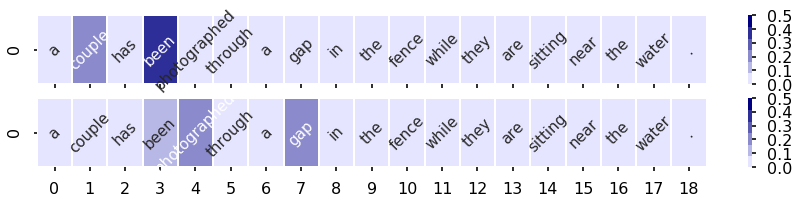

------------------------------
the player is pretty
21


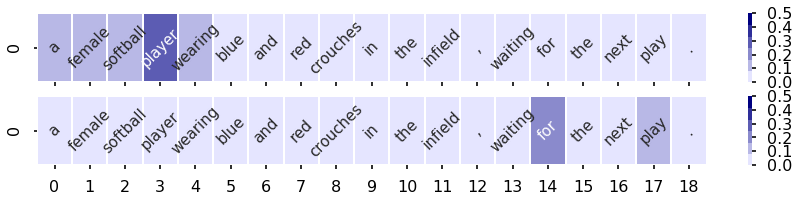

------------------------------
children doing homework assignments while tutor monitors them .
21


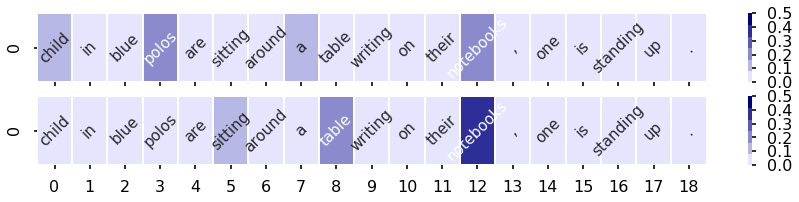

------------------------------
a man takes a smoke break from work .
21


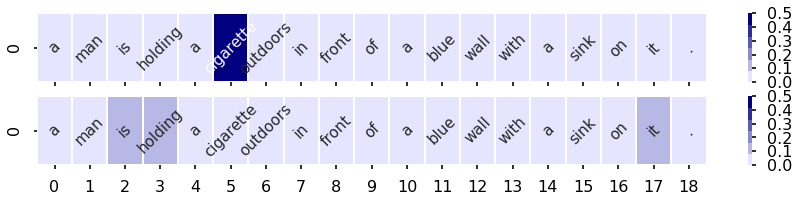

------------------------------
a sedan was turning a corner as walkers were crossing .
22


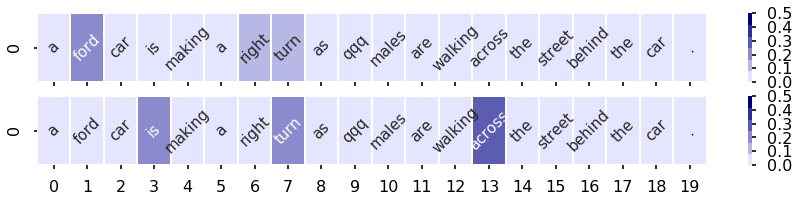

------------------------------
a man is giving a toast at a wedding .
22


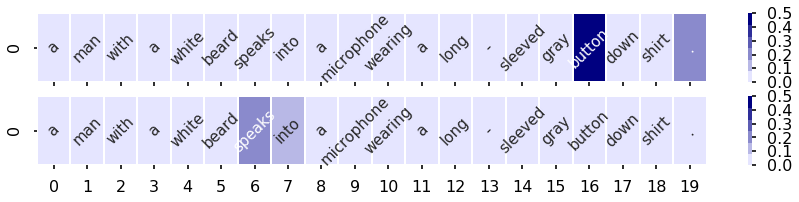

------------------------------
a woman giving a seminar has her words recorded by her <UNK> .
22


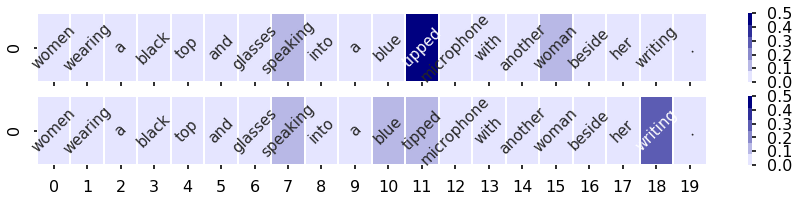

------------------------------
a father is buying his daughter ice cream .
22


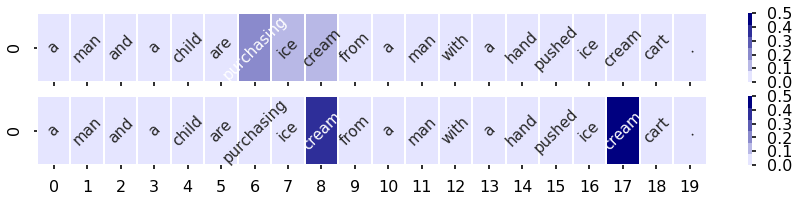

------------------------------
the man is intelligent
22


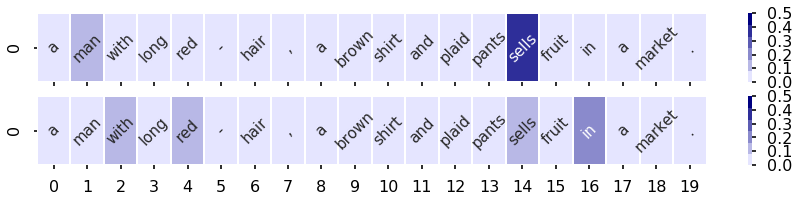

------------------------------
the racetrack is long .
22


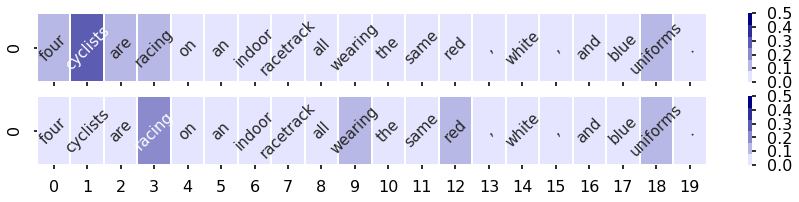

------------------------------
the kids like science .
22


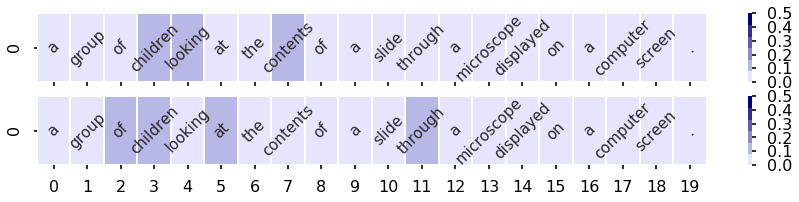

------------------------------
two trains of different sizes but following each other side by side going to opposing directions .
23


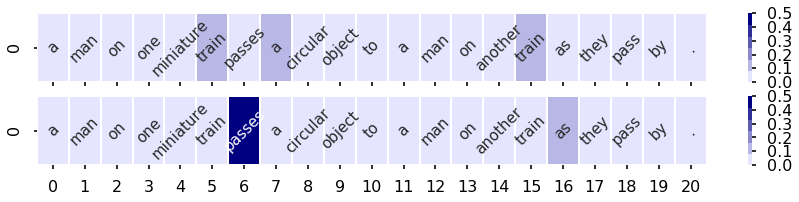

------------------------------
cyclists are in a race on the part of the course that is on the highway .
23


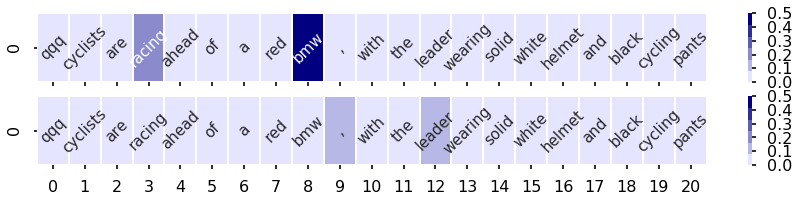

------------------------------
the people are women
23


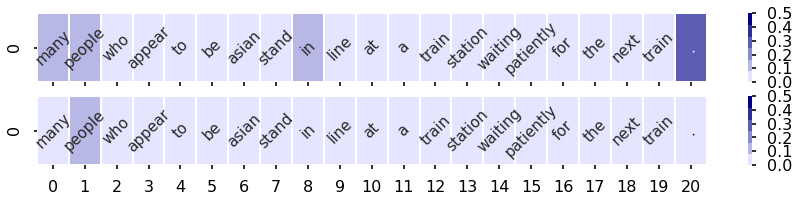

------------------------------
some men wearing red winter jackets are looking over a lake and listening to music .
23


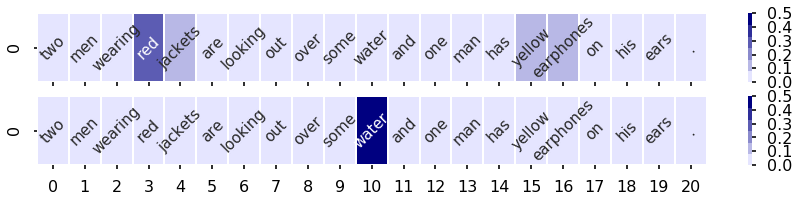

------------------------------
the musician singing the song is asian .
23


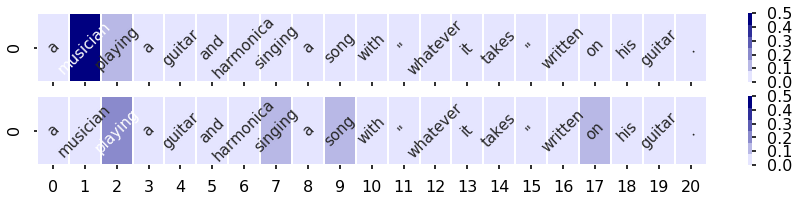

------------------------------
the women are both farmers
23


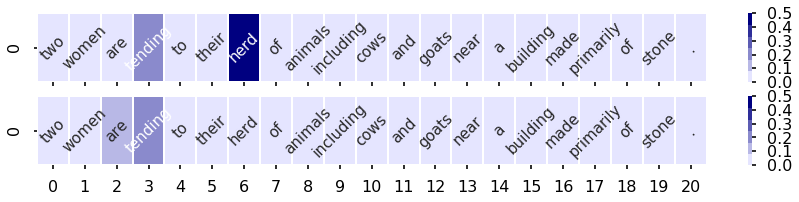

------------------------------
a man is <UNK> to play a game
23


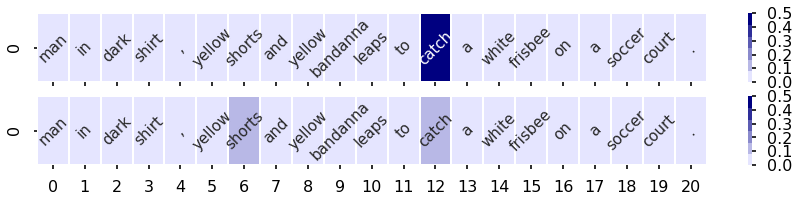

------------------------------
a band is playing a concert in a packed stadium .
23


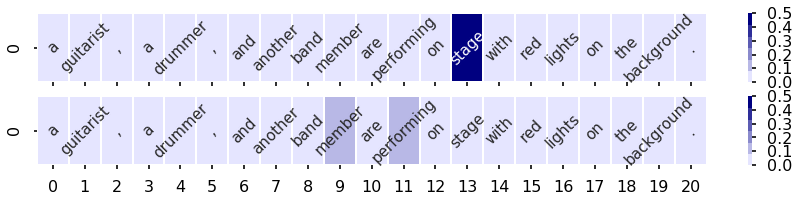

------------------------------
two men are friends
24


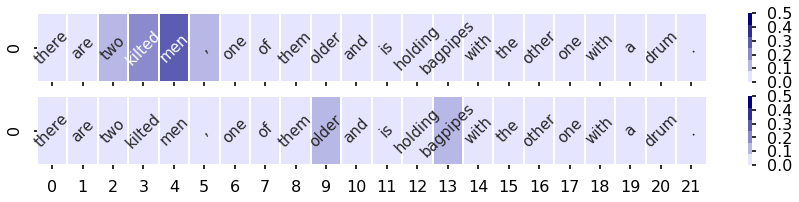

------------------------------
a girl is swinging , rather high , on a swing with light blue ropes .
24


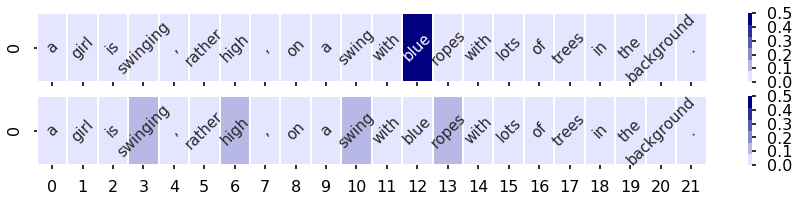

------------------------------
a woman is a good surfer .
24


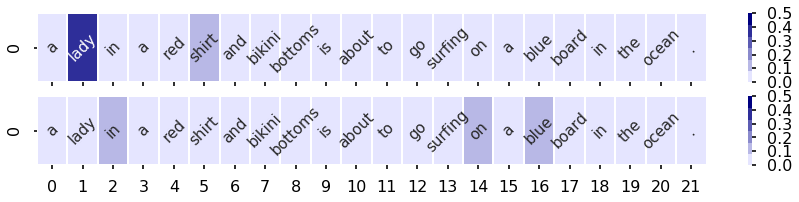

------------------------------
they think the men are handsome .
24


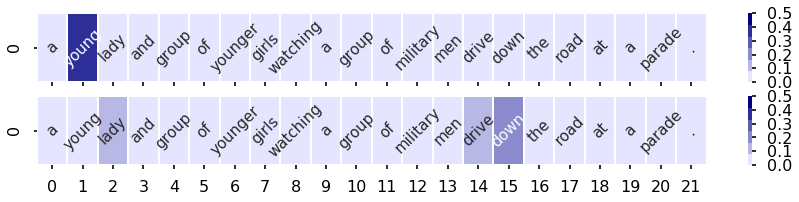

------------------------------
people are looking at sexy underwear .
24


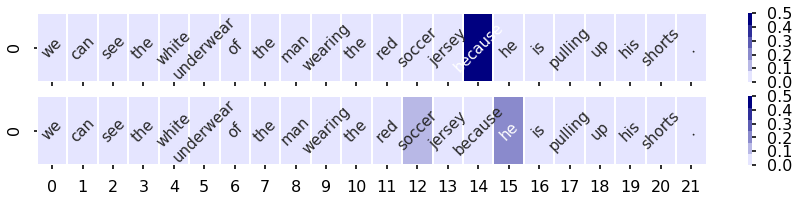

------------------------------
the man is a repairman .
24


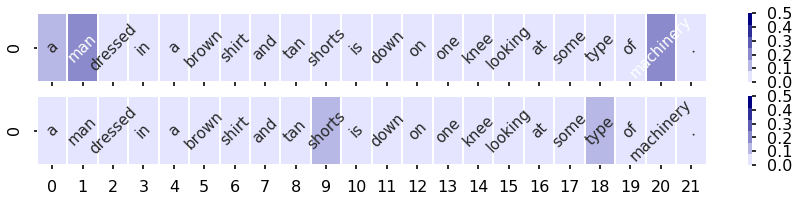

------------------------------
a young couple is very much in love .
24


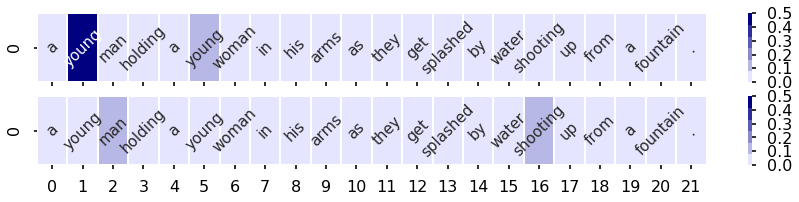

------------------------------
a lady just exited starbucks .
25


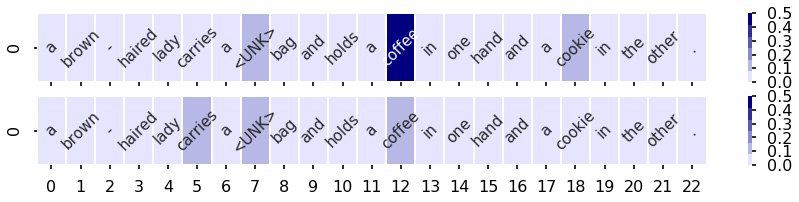

------------------------------
a tall person in a uniform
25


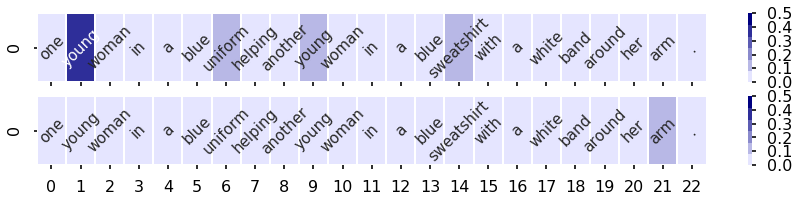

------------------------------
a child 's mother takes a picture of her .
25


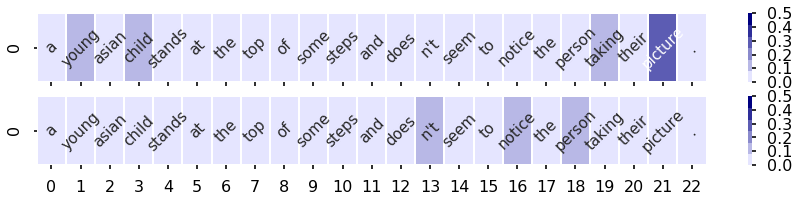

------------------------------
the trees are ready for spring .
25


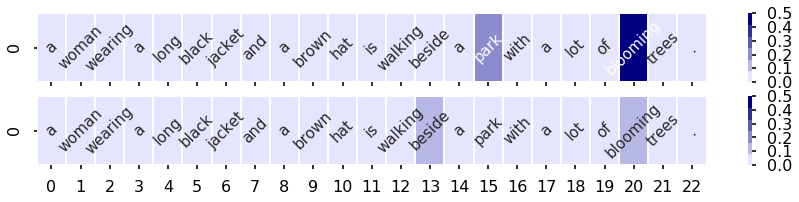

------------------------------
a worker pulls up his long boots before climbing onto the flotation device .
25


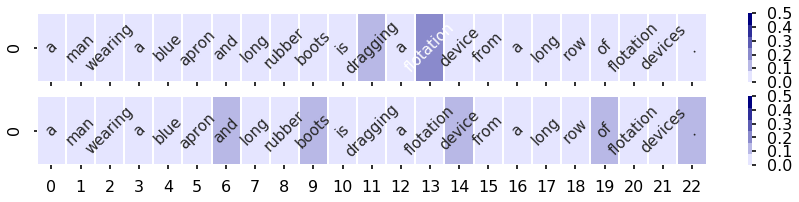

------------------------------
a young woman wearing a white sleeveless dress lined with real red flowers talking to her boyfriend on her cellphone as she walks down a quiet street sidewalk .
25


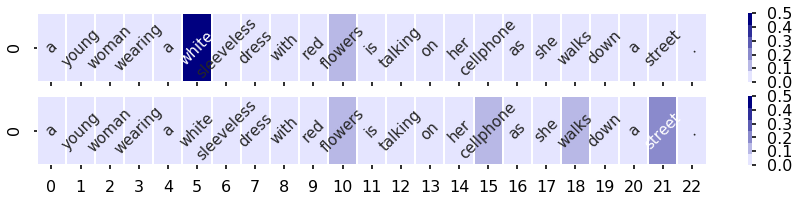

------------------------------
a man is sick next to the toilet .
25


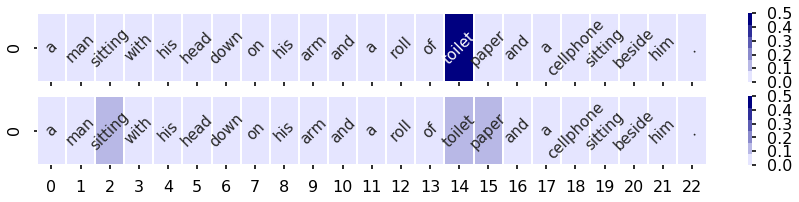

------------------------------
a tall person in a blouse
25


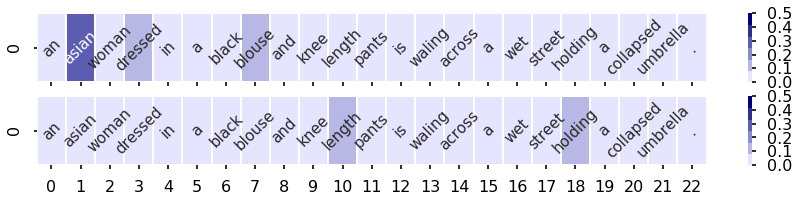

------------------------------
the woman sitting is asian .
26


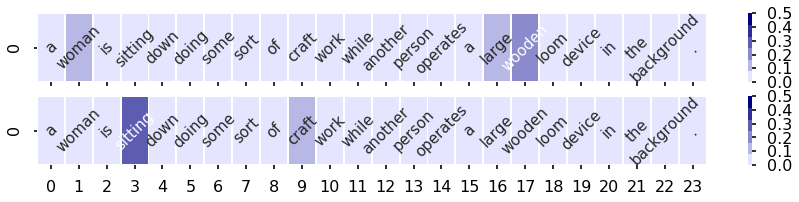

------------------------------
a woman is getting ready to perform a song for the audience .
26


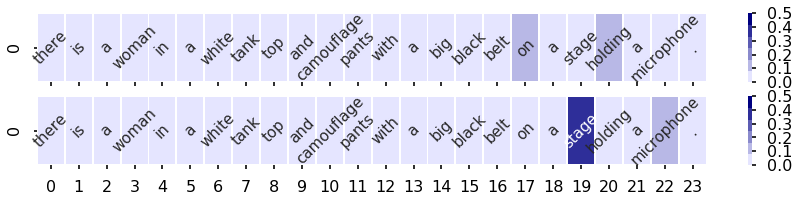

------------------------------
the people are business <UNK> .
27


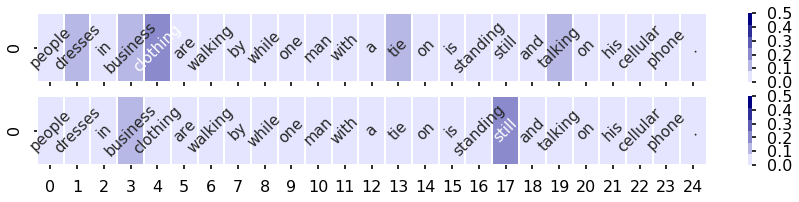

------------------------------
the band plays jazz music .
27


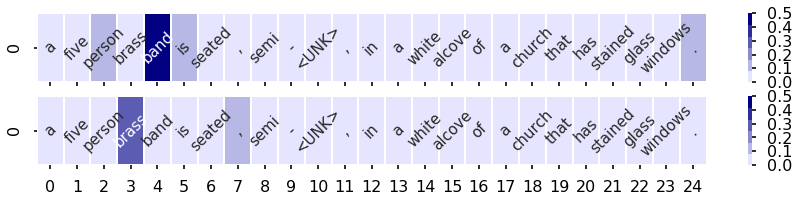

------------------------------
the young man jumping against the wall is hispanic .
27


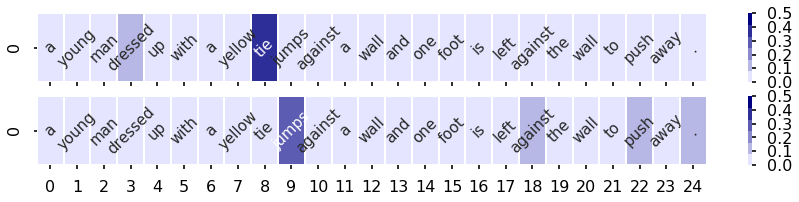

------------------------------
a bunch of people are hanging out in the park in the middle of classes .
28


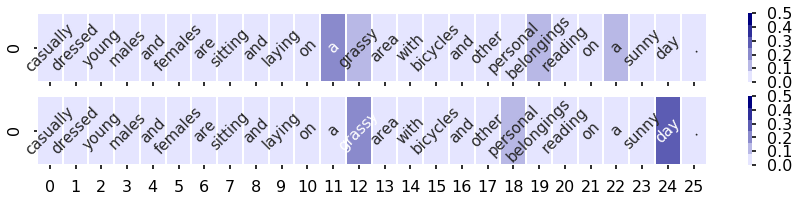

------------------------------
the man is fat .
28


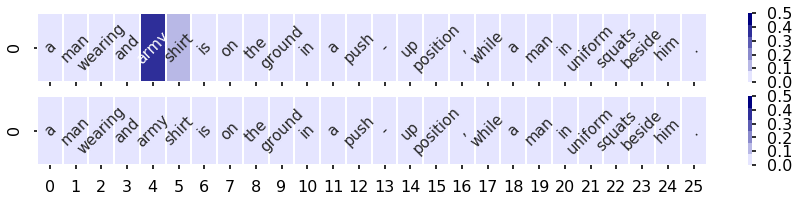

------------------------------
a boy has a light yellow balloon .
28


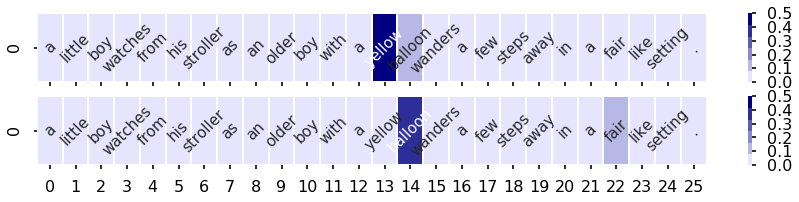

------------------------------
Cropping saved pngs
Done cropping
150


In [99]:
count = print_attention(output1,output2, output3, max=150, plot=True, output_filter=2, jsd_thresh=0.21)
print(count)